In [1]:
!pip install fuzzywuzzy

In [2]:
!pip install python-Levenshtein

In [3]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline
pd.options.mode.copy_on_write = True

In [4]:
df = pd.read_csv('data.xlsx - Sheet1.csv', encoding = 'unicode_escape')

In [5]:
pd.set_option('display.max_rows', len(df))
pd.set_option('display.max_columns', len(df.columns))

In [6]:
df.head(5)

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.3,"board ofsecondary education,ap",2007,95.8,"board of intermediate education,ap",1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.4,cbse,2007,85.0,cbse,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.0,cbse,2010,68.2,cbse,64,2,B.Tech/B.E.,information technology,70.00,64,0,Uttar Pradesh,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.6,cbse,2007,83.6,cbse,6920,1,B.Tech/B.E.,computer engineering,74.64,6920,1,Delhi,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.0,cbse,2008,76.8,cbse,11368,2,B.Tech/B.E.,electronics and communication engineering,73.90,11368,0,Uttar Pradesh,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [7]:
df['Unnamed: 0'].unique()

array(['train'], dtype=object)

In [8]:
df.shape

(3998, 39)

In [9]:
df.columns

Index(['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')

In [10]:
new_df = df[[#'Unnamed: 0', 
    'ID', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience', 'Salary']]

In [11]:
new_df.head()

,ID,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Salary
0,203097,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.3,"board ofsecondary education,ap",2007,95.8,"board of intermediate education,ap",1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455,420000.0
1,579905,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.4,cbse,2007,85.0,cbse,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637,500000.0
2,810601,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.0,cbse,2010,68.2,cbse,64,2,B.Tech/B.E.,information technology,70.00,64,0,Uttar Pradesh,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721,325000.0
3,267447,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.6,cbse,2007,83.6,cbse,6920,1,B.Tech/B.E.,computer engineering,74.64,6920,1,Delhi,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194,1100000.0
4,343523,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.0,cbse,2008,76.8,cbse,11368,2,B.Tech/B.E.,electronics and communication engineering,73.90,11368,0,Uttar Pradesh,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295,200000.0


In [12]:
new_df['CivilEngg'].unique()

array([ -1, 320, 400, 388, 260, 440, 356, 292, 500, 200, 300, 452, 322,
       340, 166, 277, 516, 380, 433, 280, 420, 460, 480], dtype=int64)

In [13]:
new_df['DOL'].unique()

array(['present', '3/1/15 0:00', '5/1/15 0:00', '7/1/15 0:00',
       '4/1/15 0:00', '10/1/14 0:00', '9/1/14 0:00', '6/1/14 0:00',
       '9/1/12 0:00', '12/1/13 0:00', '6/1/15 0:00', '10/1/13 0:00',
       '1/1/15 0:00', '4/1/14 0:00', '6/1/13 0:00', '3/1/12 0:00',
       '7/1/14 0:00', '2/1/13 0:00', '1/1/14 0:00', '4/1/13 0:00',
       '7/1/12 0:00', '5/1/14 0:00', '9/1/13 0:00', '2/1/15 0:00',
       '1/1/12 0:00', '8/1/15 0:00', '8/1/14 0:00', '12/1/15 0:00',
       '12/1/14 0:00', '5/1/12 0:00', '3/1/11 0:00', '7/1/11 0:00',
       '2/1/14 0:00', '12/1/11 0:00', '10/1/15 0:00', '11/1/14 0:00',
       '3/1/14 0:00', '11/1/11 0:00', '5/1/13 0:00', '7/1/13 0:00',
       '11/1/13 0:00', '1/1/11 0:00', '5/1/11 0:00', '2/1/12 0:00',
       '11/1/12 0:00', '6/1/12 0:00', '8/1/13 0:00', '3/1/05 0:00',
       '3/1/13 0:00', '10/1/12 0:00', '2/1/11 0:00', '2/1/10 0:00',
       '1/1/13 0:00', '6/1/11 0:00', '9/1/15 0:00', '4/1/12 0:00',
       '8/1/12 0:00', '4/1/11 0:00', '10/1/11 0:00', '

In [14]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 38 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ID                     3998 non-null   int64  
 1   DOJ                    3998 non-null   object 
 2   DOL                    3998 non-null   object 
 3   Designation            3998 non-null   object 
 4   JobCity                3998 non-null   object 
 5   Gender                 3998 non-null   object 
 6   DOB                    3998 non-null   object 
 7   10percentage           3998 non-null   float64
 8   10board                3998 non-null   object 
 9   12graduation           3998 non-null   int64  
 10  12percentage           3998 non-null   float64
 11  12board                3998 non-null   object 
 12  CollegeID              3998 non-null   int64  
 13  CollegeTier            3998 non-null   int64  
 14  Degree                 3998 non-null   object 
 15  Spec

In [15]:
new_df[new_df.duplicated(keep=False)]

,ID,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Salary


In [16]:
pd.options.mode.copy_on_write = True

In [17]:
#new_df.loc[new_df['DOL'] == 'present', 'DOL'] = pd.Timestamp('now').strftime('%m/%d/%y')
#new_df['DOL'] = pd.to_datetime(new_df['DOL'])

In [18]:
new_df['DOJ'] = pd.to_datetime(new_df['DOJ'])
new_df['DOB'] = pd.to_datetime(new_df['DOB'])

In [19]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 38 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   ID                     3998 non-null   int64         
 1   DOJ                    3998 non-null   datetime64[ns]
 2   DOL                    3998 non-null   object        
 3   Designation            3998 non-null   object        
 4   JobCity                3998 non-null   object        
 5   Gender                 3998 non-null   object        
 6   DOB                    3998 non-null   datetime64[ns]
 7   10percentage           3998 non-null   float64       
 8   10board                3998 non-null   object        
 9   12graduation           3998 non-null   int64         
 10  12percentage           3998 non-null   float64       
 11  12board                3998 non-null   object        
 12  CollegeID              3998 non-null   int64         
 13  Col

In [20]:
new_df.describe()

,ID,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Salary
count,3.998000e+03,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3.998000e+03
mean,6.637945e+05,77.925443,2008.087544,74.466366,5156.851426,1.925713,71.486171,5156.851426,0.300400,2012.105803,501.649075,501.598799,513.378189,0.510490,353.102801,95.328414,90.742371,22.974737,16.478739,31.851176,2.683842,-0.037831,0.146496,0.002763,-0.169033,-0.138110,3.076998e+05
std,3.632182e+05,9.850162,1.653599,10.999933,4802.261482,0.262270,8.167338,4802.261482,0.458489,31.857271,104.940021,86.783297,122.302332,0.468671,205.355519,158.241218,175.273083,98.123311,87.585634,104.852845,36.658505,1.028666,0.941782,0.951471,1.007580,1.008075,2.127375e+05
min,1.124400e+04,43.000000,1995.000000,40.000000,2.000000,1.000000,6.450000,2.000000,0.000000,0.000000,180.000000,195.000000,120.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700,3.500000e+04
25%,3.342842e+05,71.680000,2007.000000,66.000000,494.000000,2.000000,66.407500,494.000000,0.000000,2012.000000,425.000000,445.000000,430.000000,0.342315,295.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200,1.800000e+05
50%,6.396000e+05,79.150000,2008.000000,74.400000,3879.000000,2.000000,71.720000,3879.000000,0.000000,2013.000000,500.000000,505.000000,515.000000,0.622643,415.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300,3.000000e+05
75%,9.904800e+05,85.670000,2009.000000,82.600000,8818.000000,2.000000,76.327500,8818.000000,1.000000,2014.000000,570.000000,565.000000,595.000000,0.842248,495.000000,233.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.702700,0.812800,0.672000,0.526200,0.502400,3.700000e+05
max,1.298275e+06,97.760000,2013.000000,98.700000,18409.000000,2.000000,99.930000,18409.000000,1.000000,2017.000000,875.000000,795.000000,900.000000,0.999910,840.000000,612.000000,715.000000,623.000000,676.000000,548.000000,516.000000,1.995300,1.904800,2.535400,3.352500,1.822400,4.000000e+06


<Axes: >

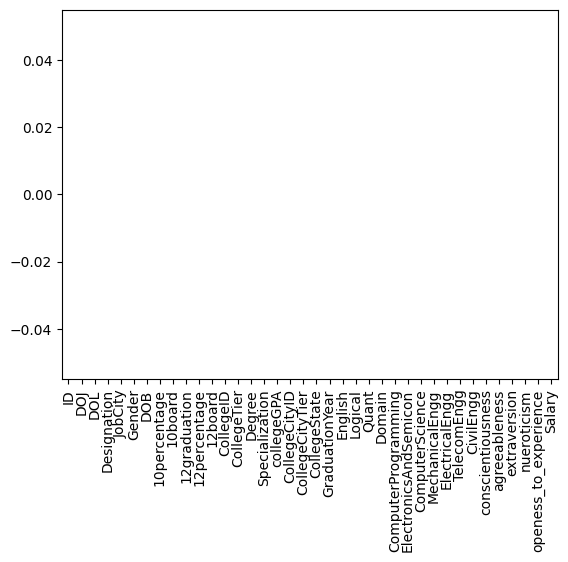

In [21]:
new_df.isnull().sum().plot(kind = 'bar')

# separating the dataset into numerical and categorical

In [22]:
def separating_columns(x):
    category_columns = []
    continous_numerical_columns = []
    discrete_numerical_columns = []
    for col in x:
        if new_df[col].dtype == 'object':
            category_columns.append(col)
        elif new_df[col].dtype == 'float64':
            continous_numerical_columns.append(col)
        else:
            discrete_numerical_columns.append(col)
    return category_columns, continous_numerical_columns, discrete_numerical_columns

category_columns, continous_numerical_columns, discrete_numerical_columns = separating_columns(new_df.columns)
#category_df = new_df[category_columns]
#numerical_contin_df = new_df[continous_numerical_columns]
#numerical_discrete_df = new_df[discrete_numerical_columns]

In [23]:
category_columns

['DOL',
 'Designation',
 'JobCity',
 'Gender',
 '10board',
 '12board',
 'Degree',
 'Specialization',
 'CollegeState']

In [24]:
new_df[category_columns].head()

,DOL,Designation,JobCity,Gender,10board,12board,Degree,Specialization,CollegeState
0,present,senior quality engineer,Bangalore,f,"board ofsecondary education,ap","board of intermediate education,ap",B.Tech/B.E.,computer engineering,Andhra Pradesh
1,present,assistant manager,Indore,m,cbse,cbse,B.Tech/B.E.,electronics and communication engineering,Madhya Pradesh
2,present,systems engineer,Chennai,f,cbse,cbse,B.Tech/B.E.,information technology,Uttar Pradesh
3,present,senior software engineer,Gurgaon,m,cbse,cbse,B.Tech/B.E.,computer engineering,Delhi
4,3/1/15 0:00,get,Manesar,m,cbse,cbse,B.Tech/B.E.,electronics and communication engineering,Uttar Pradesh


In [25]:
new_df[continous_numerical_columns].head()

,10percentage,12percentage,collegeGPA,Domain,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Salary
0,84.3,95.8,78.00,0.635979,0.9737,0.8128,0.5269,1.35490,-0.4455,420000.0
1,85.4,85.0,70.06,0.960603,-0.7335,0.3789,1.2396,-0.10760,0.8637,500000.0
2,85.0,68.2,70.00,0.450877,0.2718,1.7109,0.1637,-0.86820,0.6721,325000.0
3,85.6,83.6,74.64,0.974396,0.0464,0.3448,-0.3440,-0.40780,-0.9194,1100000.0
4,78.0,76.8,73.90,0.124502,-0.8810,-0.2793,-1.0697,0.09163,-0.1295,200000.0


In [26]:
new_df[continous_numerical_columns].dtypes

10percentage             float64
12percentage             float64
collegeGPA               float64
Domain                   float64
conscientiousness        float64
agreeableness            float64
extraversion             float64
nueroticism              float64
openess_to_experience    float64
Salary                   float64
dtype: object

In [27]:
new_df[discrete_numerical_columns].head()

,ID,DOJ,DOB,12graduation,CollegeID,CollegeTier,CollegeCityID,CollegeCityTier,GraduationYear,English,Logical,Quant,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg
0,203097,2012-06-01,1990-02-19,2007,1141,2,1141,0,2011,515,585,525,445,-1,-1,-1,-1,-1,-1
1,579905,2013-09-01,1989-10-04,2007,5807,2,5807,0,2012,695,610,780,-1,466,-1,-1,-1,-1,-1
2,810601,2014-06-01,1992-08-03,2010,64,2,64,0,2014,615,545,370,395,-1,-1,-1,-1,-1,-1
3,267447,2011-07-01,1989-12-05,2007,6920,1,6920,1,2011,635,585,625,615,-1,-1,-1,-1,-1,-1
4,343523,2014-03-01,1991-02-27,2008,11368,2,11368,0,2012,545,625,465,-1,233,-1,-1,-1,-1,-1


In [28]:
new_df[category_columns]['Designation'].replace({'systems engineer': 'system engineer'}, inplace=True)
new_df[category_columns]['Designation'].replace({'get': 'Unknown'}, inplace=True)
new_df[category_columns]['Designation'].replace({'it business analyst': 'business analyst'}, inplace=True)
new_df[category_columns]['Designation'].replace({'trainee software engineer': 'software engineer trainee'}, inplace=True)
new_df[category_columns]['Designation'].replace({'sea': 'software engineering associate'}, inplace=True)
new_df[category_columns]['Designation'].replace({'.net web developer': '.net developer'}, inplace=True)
new_df[category_columns]['Designation'].replace({'systems administratorr': 'system administrator'}, inplace=True)
new_df[category_columns]['Designation'].replace({
    'software quality assurance tester': 'quality assurance test engineer',
    'quality assurance tester': 'quality assurance test engineer',
    'quality assurance analyst': 'software quality assurance analyst',
    'quality assurance': 'software quality assurance analyst'
}, inplace=True)
new_df[category_columns]['Designation'].replace({'qa analyst': 'quality analyst'}, inplace=True)
new_df[category_columns]['Designation'].replace({'entry level management trainee': 'management trainee'}, inplace=True)
new_df[category_columns]['Designation'].replace({'customer service': 'customer service representative'}, inplace=True)
new_df[category_columns]['Designation'] = new_df['Designation'].str.replace(r'#', '')

In [29]:
new_df[category_columns]['Designation'].replace({'qa analyst': 'quality analyst'}, inplace = True)

In [30]:
new_df[category_columns]['JobCity'].replace(['-1', 'NOT KNOWN'], inplace=True)
new_df[category_columns]['10board'].replace(['0', 'NOT KNOWN'], inplace=True)
new_df[category_columns]['12board'].replace(['0', 'NOT KNOWN'], inplace=True)

In [31]:
new_df[category_columns]['10board'].replace({'central board of secondary education': 'cbse'}, inplace = True)

In [32]:
new_df[category_columns]['10board'] = new_df['10board'].replace({
    'state board': 'ssc',
    'board of secondary education': 'ssc',
    'central board of secondary education': 'cbse',
    'up': 'uttar pradesh board',
    'up board': 'uttar pradesh board',
    'up-board': 'uttar pradesh board',
    'upboard': 'uttar pradesh board',
    'u p board': 'uttar pradesh board',
    'west bengal board of secondary examination (wbbse)': 'wbbse',
    'mp' : 'mp state board',
    'mp board' : 'mp state board',
    'kseeb' : 'karnataka state board',
    'sslc': 'ssc',
    'state':'ssc',
    'bseb': 'bihar',
    'jbse,jharkhand' : 'jbse',
    'board of secondary education,odisha ': 'bse,odisha',
    'cbse board': 'cbse',
    ' cbse': 'cbse',
    'stateboard': 'ssc',
    ' state board': 'ssc',
    'ap state board for secondary education': 'ap state board',
    'state board of secondary education,andhra pradesh': 'ap state board',
    'state board of secondary education, andhra pradesh': 'ap state board',
    'state board of secondary education( ssc)': 'ssc',
    'secondary state certificate': 'ssc',
    'andhra pradesh state board':'ap state board',
    'cbse': 'cbse',
    'board of ssc': 'ssc',
    'apssc': 'ap state board',
    'ssc regular': 'ssc',
    'ssc board of andrapradesh': 'ap state board',
    'ssc-andhra pradesh': 'ap state board',
    'andhra pradesh board ssc': 'ap state board',
    'state board of secondary education, ap': 'ap state board',
    'board of high school and intermediate education uttarpradesh': 'uttar pradesh board',
    'rbse': 'rajasthan board',
    'rbse (state board)': 'rajasthan board',
    'secondary school of education': 'ssc',
    'karnataka secondary education examination board': 'karnataka state board',
    'karnataka secondary education board': 'karnataka state board',
    'west bengal board of secondary education': 'wbbse',
    'hbsc':'hbsc',
    'secondary school education' :'ssc',
    'karnataka board': 'karnataka state board',
    'board of secondaray education': 'ssc',
    'state board - west bengal board of secondary education : wbbse': 'wbbse',
    'board of secondary school education': 'ssc',
    'board of secondary education,andhra pradesh': 'ap state board',                                                                   
    'karnataka state examination board' :'karnataka state board',
    'state board': 'ssc',
    'karnataka secondary education': 'karnataka state board',
    'board of secondary education,ap' : 'ap state board',
    'sslc board': 'ssc',
    'school secondary education, andhra pradesh ': 'ap state board',
    'bse': 'ssc', 'maharashtra board': 'maharashtra state board',
    'matric': 'matriculation board',
    'matriculation': 'matriculation board',
    'rajasthan board of secondary education': 'rajasthan board',
    'maharashtra sate board': 'maharashtra state board',
    'board of secondary education, andhra pradesh': 'ap state board',
    'secondary school cerfificate': 'ssc',
    'bse(board of secondary education)' : 'ssc',
    'tn state board': 'ssc',
    'jseb': 'jharkhand academic council',
    'kseb': 'kerala university',
    'secondary school certificate' : 'ssc'
})

In [33]:
new_df[category_columns]['10board'] = new_df['10board'].str.strip()

In [34]:
new_df[category_columns]['JobCity'] = new_df['JobCity'].str.lower()
new_df[category_columns]['JobCity'].replace({'-1': 'Unknown'}, inplace = True)

In [35]:
new_df[category_columns]['12board'].replace({'state board': 'isc', 'board of intermediate': 'isc', 'board of intermediate education': 'isc', 'central board of secondary education': 'cbse', 'up': 'up board', 'bie':'isc', 'mp board': 'maharashtra state board', 'intermediate': 'isc', 'state': 'isc', 'rbse': 'rajasthan board', 'stateboard': 'isc', 'board of intermediate education,ap': 'isc', 'intermediate board': 'isc', 'intermediate board of education,andhra pradesh': 'isc', 'board of intermediate education, ap': 'isc', 'board of intermediate education, andhra pradesh': 'isc', 'board of intermediate ap': 'isc', ' board of intermediate': 'isc', 'intermidiate': 'isc', 'andhra pradesh board of secondary education': 'ise', 'board of intermediate education,andhra pradesh': 'ise', 'boardofintermediate': 'ise', 'board of intermediate education:ap,hyderabad': 'ise', 'ap board': 'isc'}, inplace = True)

In [36]:
new_df[category_columns]['Specialization'].replace({'electronics & instrumentation eng':'electronics and instrumentation engineering', 'computer science': 'computer engineering', 'information science':'information technology','electronics':'electronics engineering'}, inplace = True)

In [37]:
from fuzzywuzzy import process

def correct_designation_words(choices, targets, threshold=80):
    corrected_targets = []
    for target in targets:
        match, score = process.extractOne(target, choices)
        if score >= threshold:
            corrected_targets.append(match)
        else:
            corrected_targets.append(target)
    return corrected_targets

choices = ['java developer', 'software engineer', 'system engineer', 'software developer', 'programmer analyst',
           'java software engineer', 'software test engineer', 'project engineer', 'technical support engineer',
           'senior software engineer', 'test engineer', 'web developer', 'assistant manager', 'application developer',
           'network engineer', 'business analyst', 'data analyst', 'engineer', 'android developer',
           'associate software engineer', 'programmer', 'senior systems engineer', '.net developer', 'php developer',
          'production engineer', 'design engineer', 'asp.net developer', 'quality analyst',
           'assistant system engineer', 'electrical engineer', 'application engineer', 'lecturer', 'data scientist', 'hardware engineer', 'associate engineer']

new_df[category_columns]['Designation'] = correct_designation_words(choices, new_df[category_columns]['Designation'])

In [38]:
new_df[category_columns]['Designation'].value_counts()

software engineer                         539
system engineer                           323
software developer                        265
programmer analyst                        139
java software engineer                    111
software test engineer                    100
project engineer                           77
technical support engineer                 76
senior software engineer                   72
java developer                             67
test engineer                              57
web developer                              54
quality analyst                            54
business analyst                           53
assistant manager                          52
application developer                      52
network engineer                           51
data analyst                               49
engineer                                   47
associate software engineer                46
android developer                          46
.net developer                    

In [39]:
from fuzzywuzzy import process

def correct_designation_words(choices, targets, threshold=60):
    corrected_targets = []
    for target in targets:
        match, score = process.extractOne(target, choices)
        if score >= threshold:
            corrected_targets.append(match)
        else:
            corrected_targets.append(target)
    return corrected_targets

choices = ['bangalore', 'hyderabad', 'noida', 'pune', 'chennai', 'gurgaon', 'new delhi', 'kolkata', 'mumbai','jaipur','lucknow','mysore','chandigarh','bhubaneswar','indore','coimbatore','faridabad','bhopal','ahmedabad','ghaziabad','kochi','dehradun','trivandrum','kolkata','Tamil Nadu', 'Rajasthan', 'Odisha']

new_df[category_columns]['JobCity'] = correct_designation_words(choices, new_df[category_columns]['JobCity'])

In [40]:
from fuzzywuzzy import process

def correct_designation_words(choices, targets, threshold=60):
    corrected_targets = []
    for target in targets:
        match, score = process.extractOne(target, choices)
        if score >= threshold:
            corrected_targets.append(match)
        else:
            corrected_targets.append(target)
    return corrected_targets

choices = ['maharashtra state board','matriculation board', 'cbse', 'up board','matriculation board', 'bse, odisha', 'bihar school examination board', 'mp state board', 'karnataka secondary board', 'cbse','secondary board of rajasthan', 'uttarakhand board','jharkhand academic council','kseb', 'hsc', 'ssc','kerala university']
new_df[category_columns]['10board'] = correct_designation_words(choices, new_df[category_columns]['10board'])

In [41]:
def correct_designation_words(choices, targets, threshold=80):
    corrected_targets = []
    for target in targets:
        match, score = process.extractOne(target, choices)
        if score >= threshold:
            corrected_targets.append(match)
        else:
            corrected_targets.append(target)
    return corrected_targets

choices = ['cbse', 'isc','chse','maharashtra state board', 'icse', 'up board', 'puc', 'ipe', 'karnataka state board', 'board of higher secondary orissa','uttar pradesh board','icse','rajasthan board','chse','ipe','hsc','puc','wbchse','pu board', 'matriculation', 'hbse','uttar pradesh board','west bengal council of higher secondary education','tamilnadu state board','uttarakhand board','board of secondary education rajasthan','bihar board','directorate of technical education,banglore','haryana state board of technical education chandigar','tamil nadu state board','board of technicaleducation ,delhi','government polytechnic mumbai , mumbai board','himachal pradesh board','nashik board']
new_df[category_columns]['12board'] = correct_designation_words(choices, new_df[category_columns]['12board'])

# Uni-varient Analysis

In [42]:
print("***Descriptive Analysis of Category variables***")
print(' ')
for i in new_df[category_columns]:
    print(f'most frquent of {i} {new_df[i].count()}')
    print(f'number of Unique occurrences of {i} is {new_df[i].nunique()}')
    print(f'most frquent {i} is {new_df[i].value_counts().idxmax()}')
    print(f'minimum frquent {i} is {new_df[i].value_counts().idxmin()}')
    print(' ')

***Descriptive Analysis of Category variables***
 
most frquent of DOL 3998
number of Unique occurrences of DOL is 67
most frquent DOL is present
minimum frquent DOL is 3/1/08 0:00
 
most frquent of Designation 3998
number of Unique occurrences of Designation is 408
most frquent Designation is software engineer
minimum frquent Designation is editor
 
most frquent of JobCity 3998
number of Unique occurrences of JobCity is 338
most frquent JobCity is Bangalore
minimum frquent JobCity is Nellore
 
most frquent of Gender 3998
number of Unique occurrences of Gender is 2
most frquent Gender is m
minimum frquent Gender is f
 
most frquent of 10board 3998
number of Unique occurrences of 10board is 273
most frquent 10board is cbse
minimum frquent 10board is biharboard
 
most frquent of 12board 3998
number of Unique occurrences of 12board is 316
most frquent 12board is isc
minimum frquent 12board is west bengal council of higher secondary eucation
 
most frquent of Degree 3998
number of Unique o

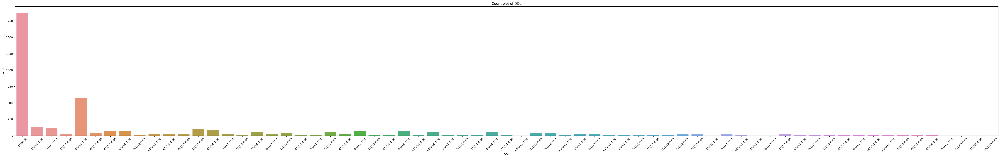

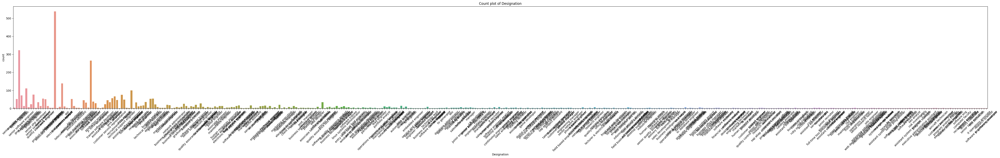

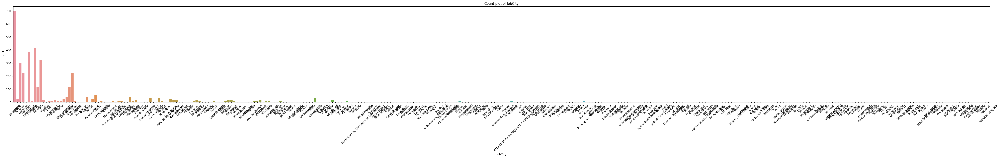

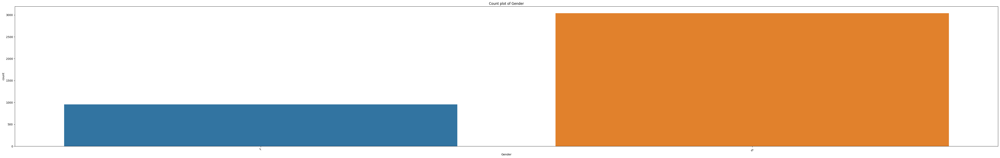

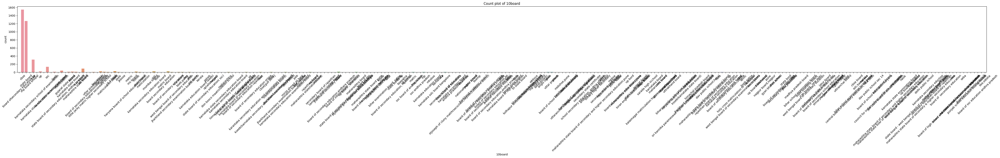

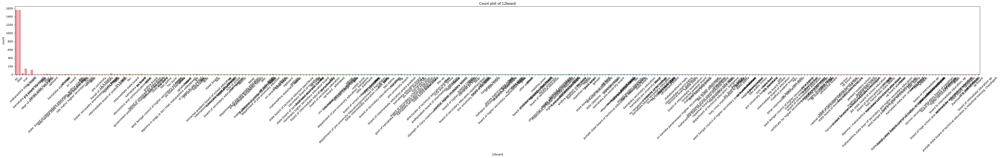

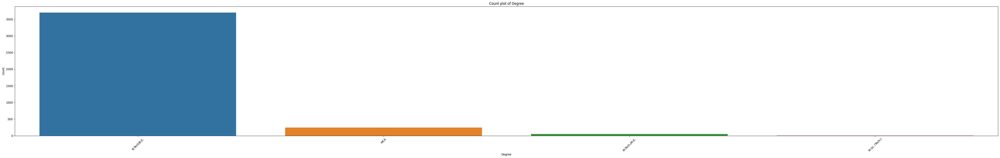

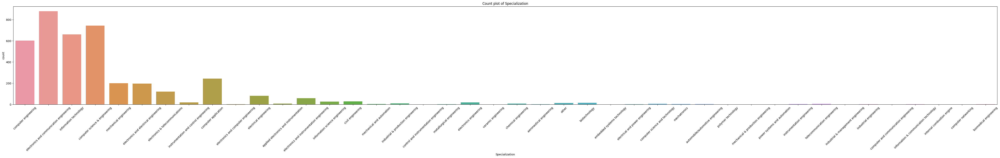

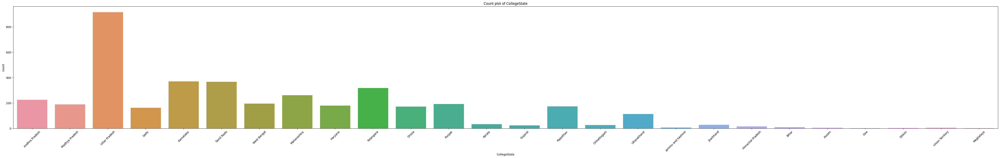

In [43]:
for i in new_df[category_columns].columns:
    plt.figure(figsize=(50, 8))
    sns.countplot(data=new_df, x=i)
    plt.title(f'Count plot of {i}')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

from the countplots of category columns (designation, Jobcity, 10board, 12 board, specilization, Degree, college state) i can depict that there are least occurance of the frequency. so, in order to make it a standarised formate i am replacing the least occurance values with 'other'. 

In [44]:
def standardize_category(df, columns, threshold, replacement):
    for column in columns:
        value_counts = df[column].value_counts()
        to_replace = value_counts[value_counts <= threshold].index
        df[column] = df[column].replace(to_replace, replacement)
    return df

columns_to_standardize = ['JobCity', 'Gender','10board', '12board', 'Degree', 'Specialization', 'CollegeState']
threshold = 20
replace = 'other'
new_df_1 = standardize_category(new_df, columns_to_standardize, threshold, replace)

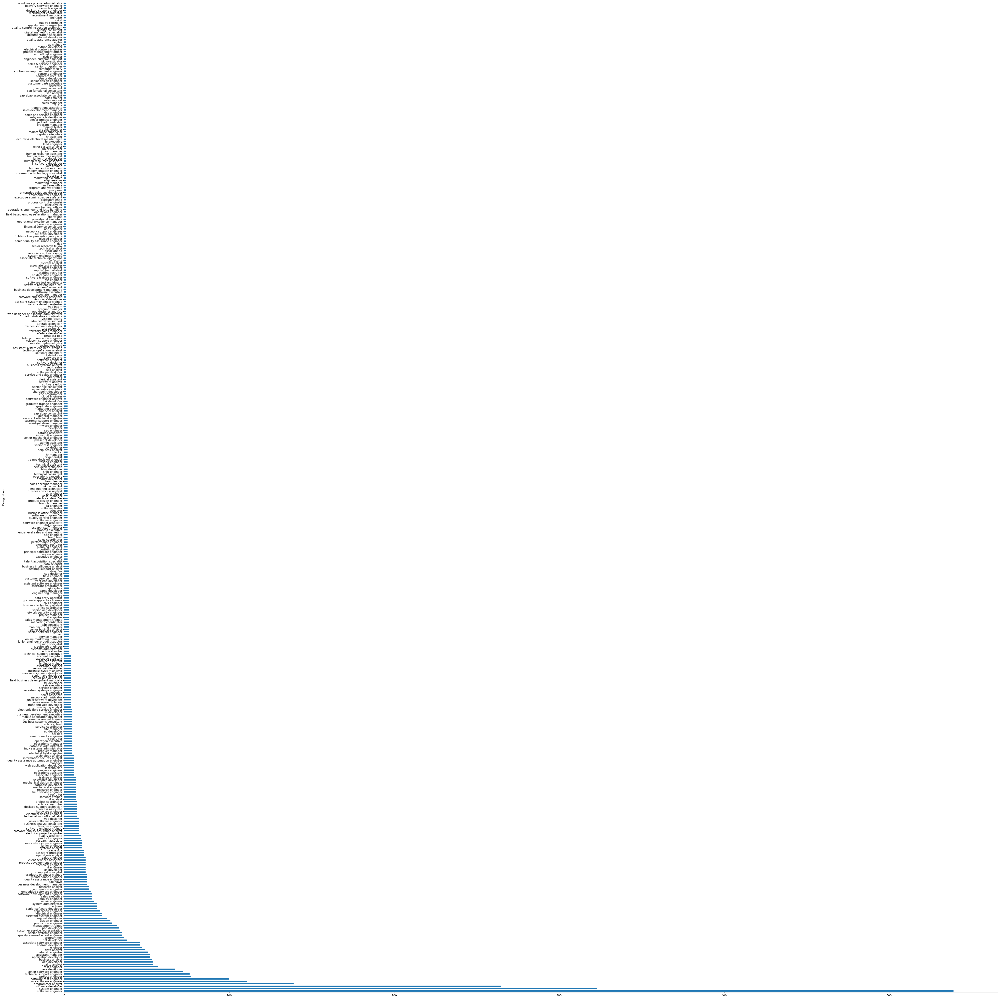

In [45]:
new_df_1.groupby(['Designation'])['Designation'].count().sort_values(ascending = False).plot(kind = 'barh', figsize = (50,50))
plt.tight_layout()

**Observation from the visual representation***
Designation plot - consists of 35 unique values, through the plot i can dipicts that people are working in different sectors from those majority are working as a software engineer.

<Axes: ylabel='JobCity'>

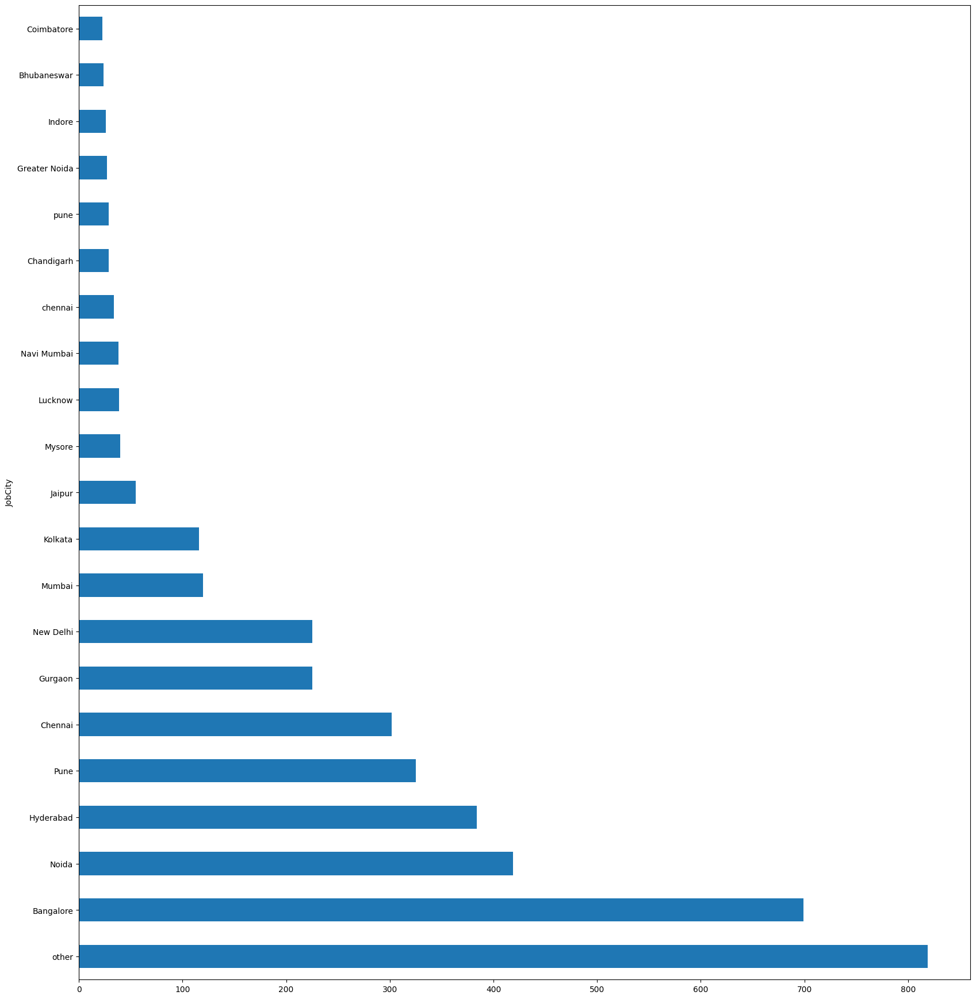

In [46]:
new_df_1.groupby(['JobCity'])['JobCity'].count().sort_values(ascending = False).plot(kind = 'barh', figsize = (20,22))

Observation from the visual representation: The plot indicates that the majority of people work in Bangalore city, suggesting that Bangalore is the primary working location for individuals in the dataset.

<Axes: ylabel='10board'>

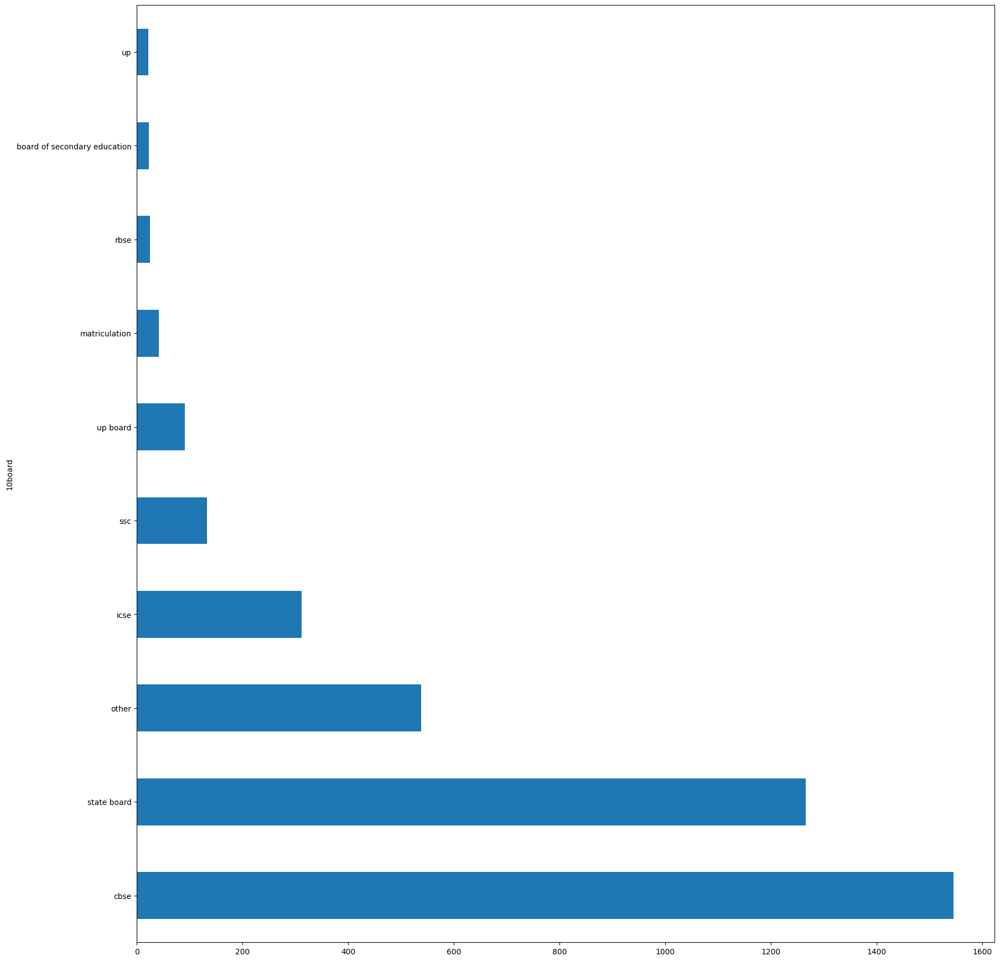

In [47]:
new_df_1.groupby(['10board'])['10board'].count().sort_values(ascending = False).plot(kind = 'barh', figsize = (20,22))

majority of the people completed there secondary study in the cbse

<Axes: ylabel='12board'>

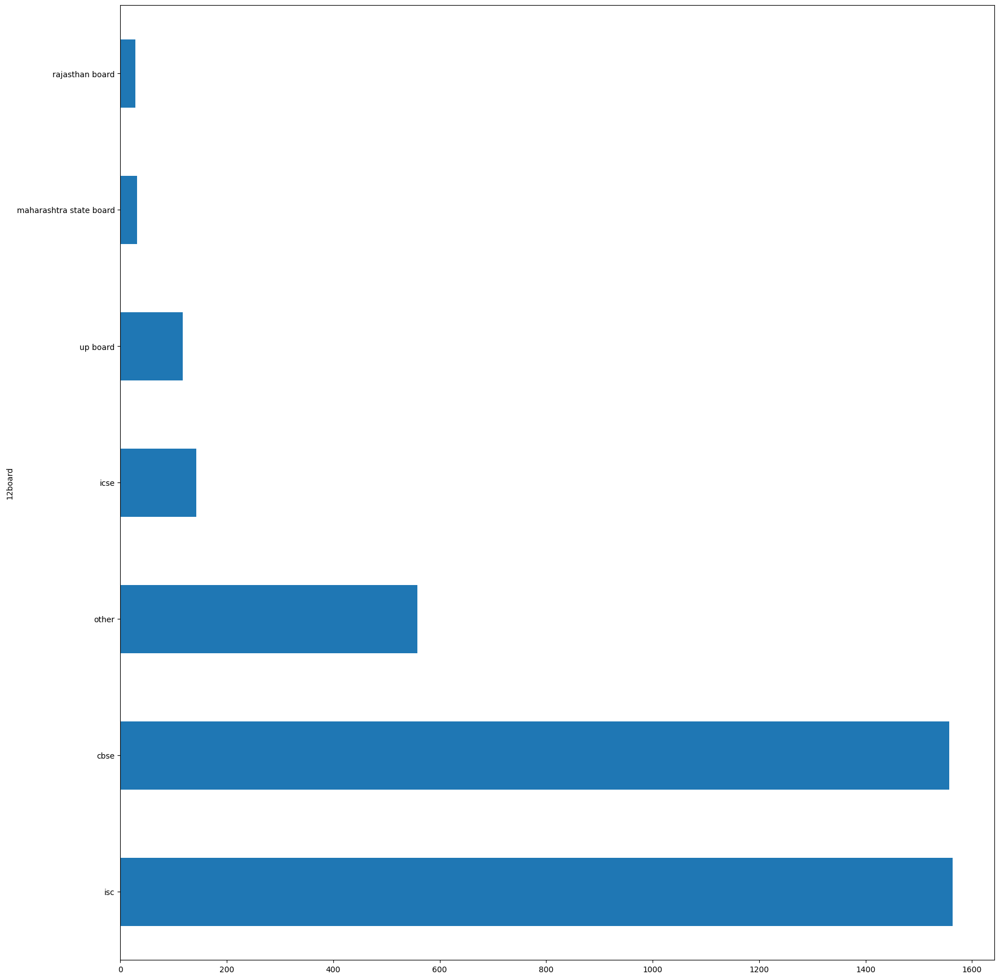

In [48]:
new_df_1.groupby(['12board'])['12board'].count().sort_values(ascending = False).plot(kind = 'barh', figsize = (20,22))

mjority of people done their high school education in ISC and followed by CBSE

<Axes: xlabel='Gender'>

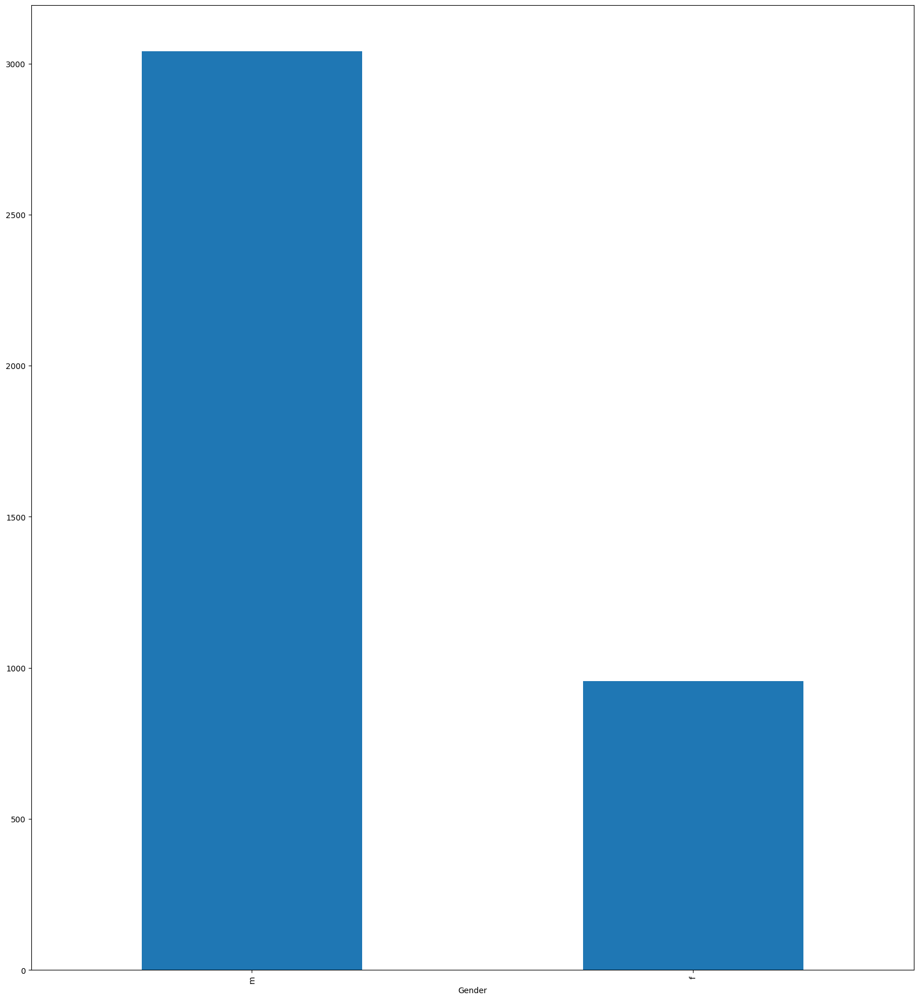

In [49]:
new_df_1.groupby(['Gender'])['Gender'].count().sort_values(ascending = False).plot(kind = 'bar', figsize = (20,22))

the count for male is higher than the count for females

<Axes: >

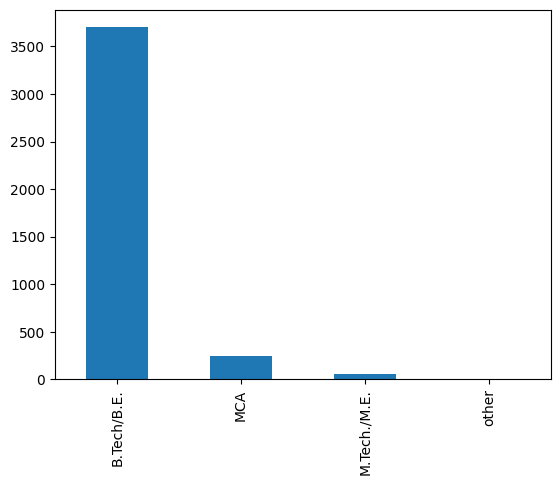

In [50]:
new_df_1['Degree'].value_counts().plot(kind = 'bar')

highest majority of people choosen or grduated from B.tech/B.E after that Mca, M.Techh/M.E

<Axes: xlabel='Specialization'>

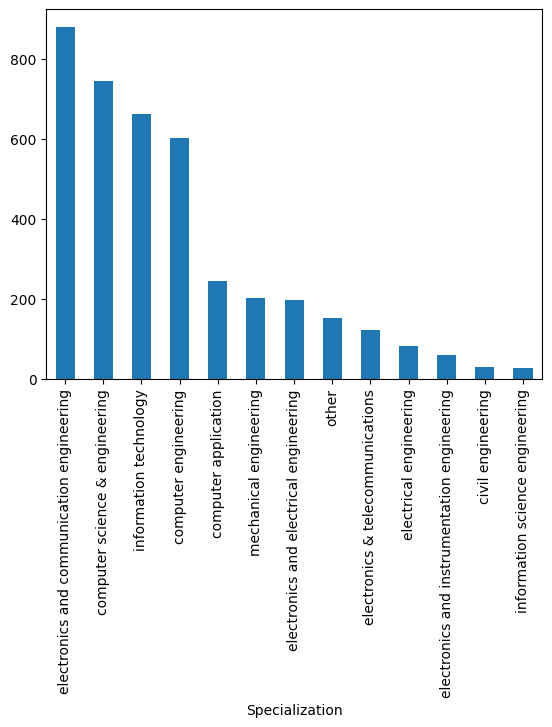

In [51]:
new_df_1.groupby(['Specialization'])['Specialization'].count().sort_values(ascending = False).plot(kind = 'bar')

most of the people choosen computer science and engineering, electronics and communication engineering, Information technology, computer engineering and computer application as their specialization in their graduation

<Axes: xlabel='CollegeState'>

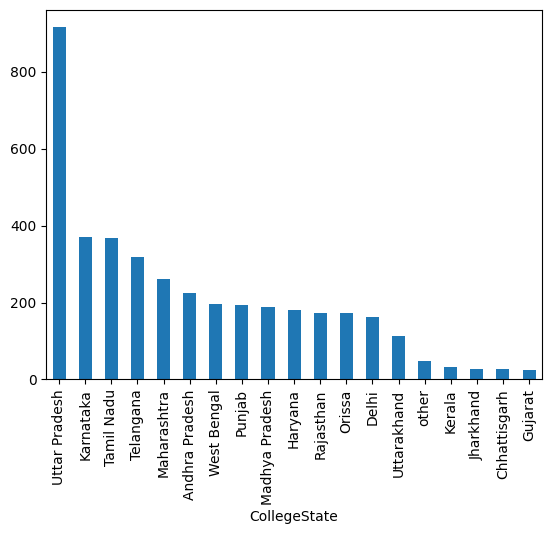

In [52]:
new_df_1.groupby(['CollegeState'])['CollegeState'].count().sort_values(ascending = False).plot(kind = 'bar')

most of the people completed their graduation from uttar pradesh after that karnataka, Tamil Nadu and Telangana

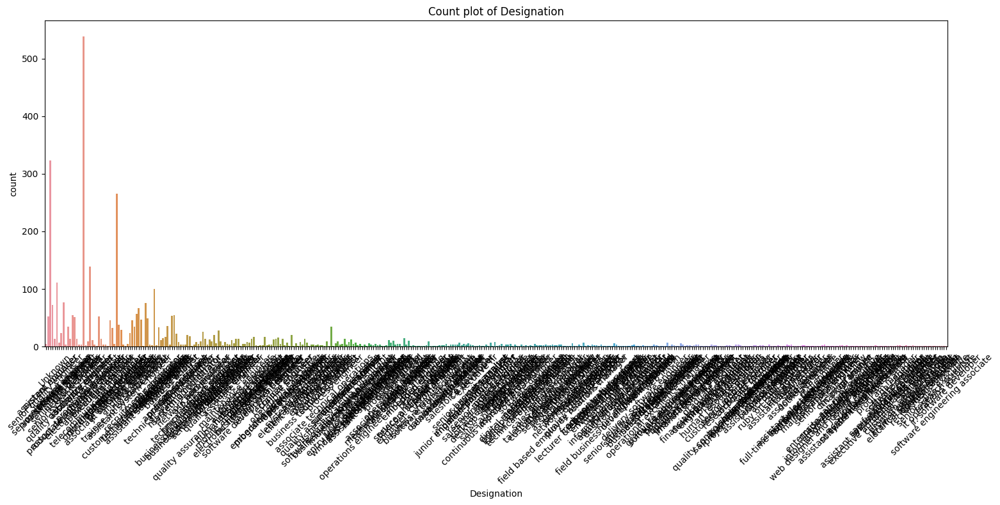

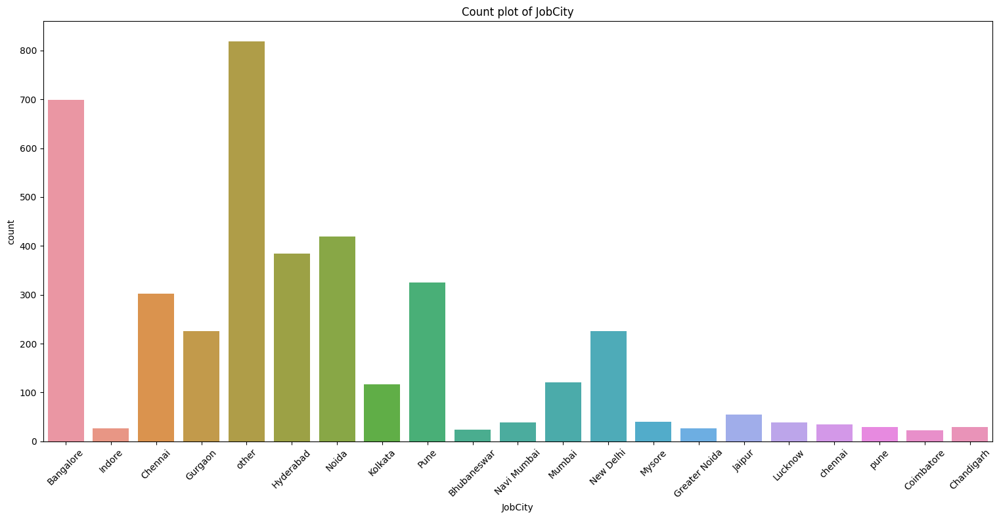

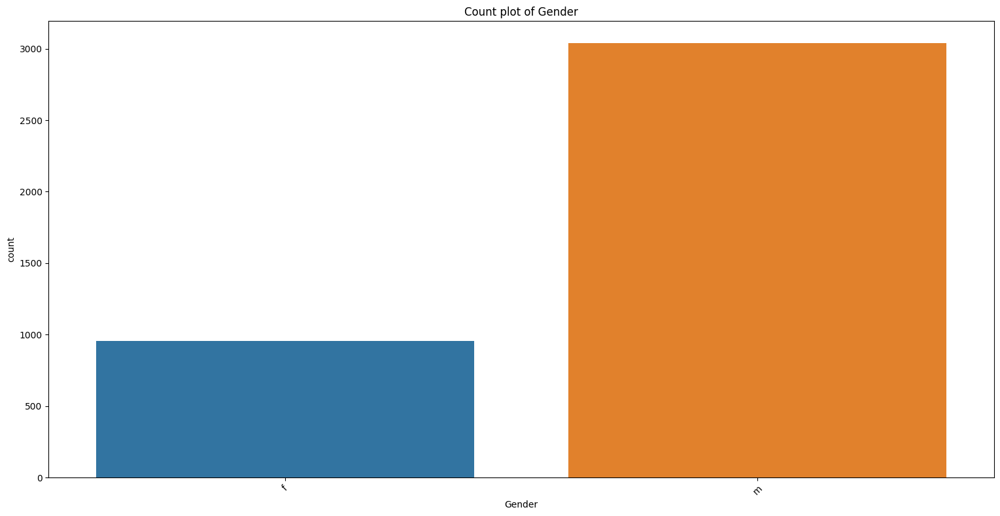

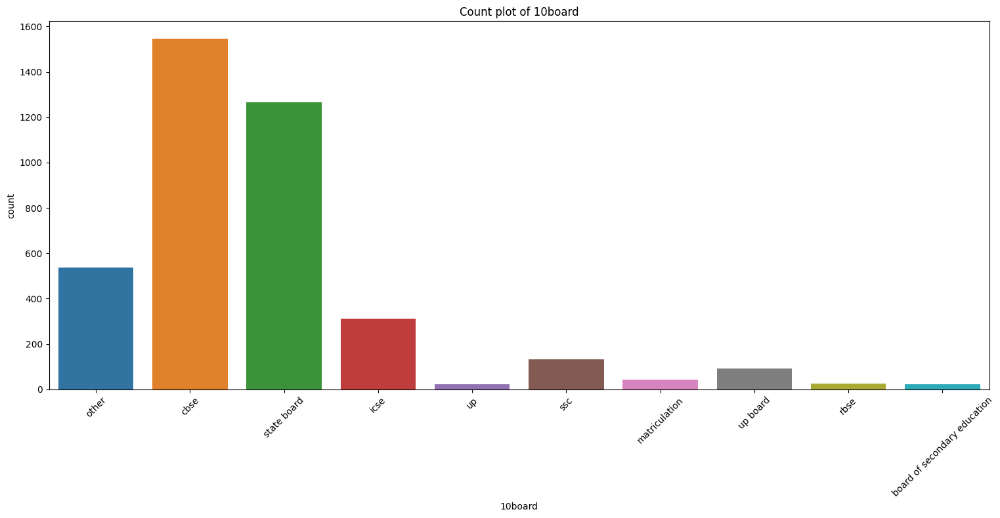

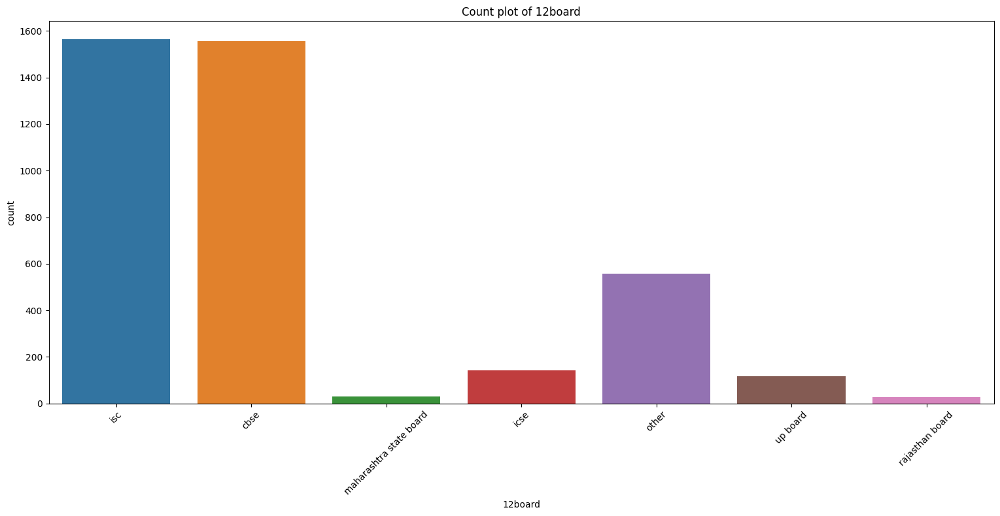

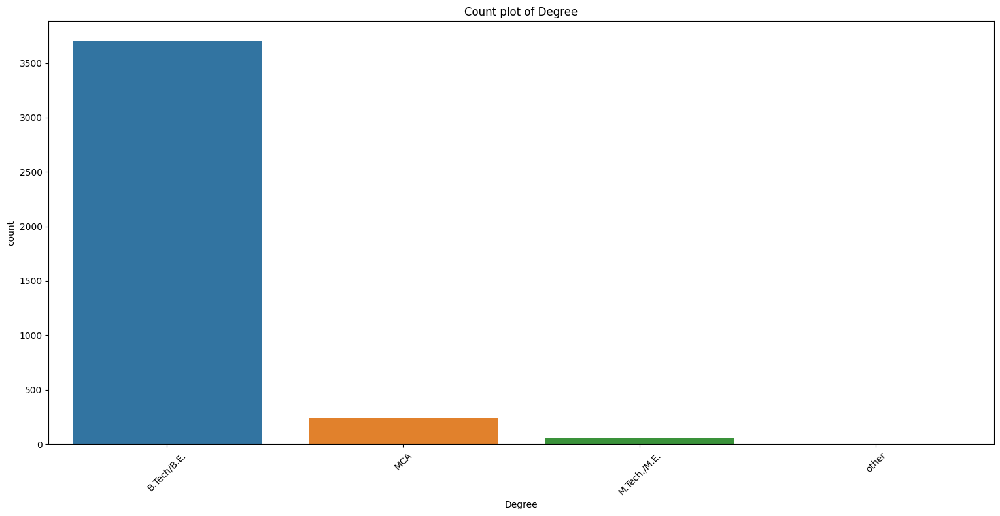

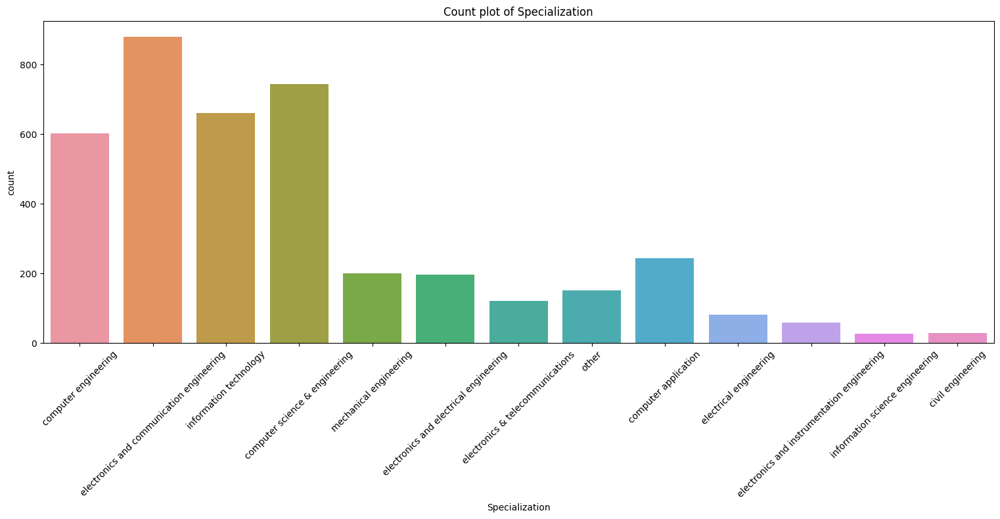

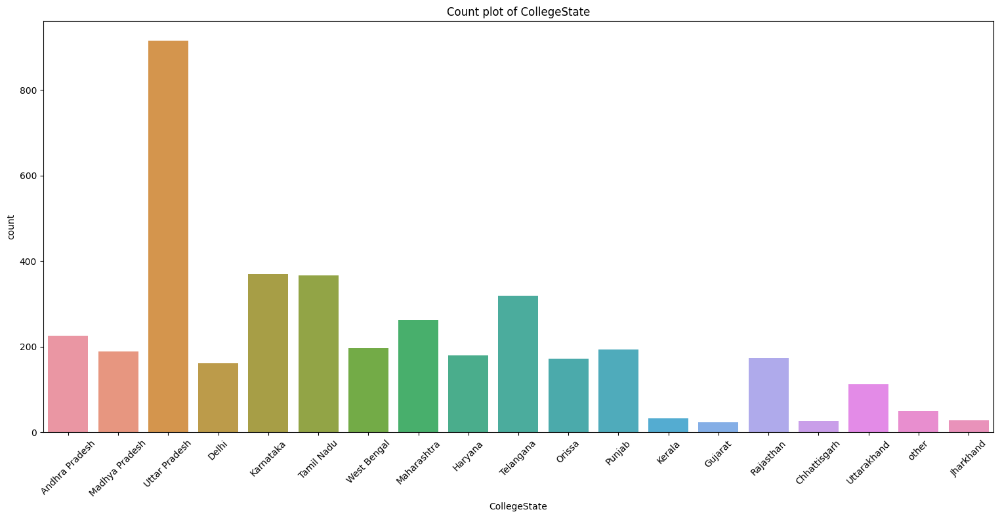

In [53]:
columns_to_standardize = ['Designation', 'JobCity', 'Gender', '10board', '12board', 'Degree', 'Specialization', 'CollegeState']
for i in columns_to_standardize:
    plt.figure(figsize=(30, 8))
    plt.subplot(1,2,1)
    sns.countplot(data=new_df_1, x=i)
    plt.title(f'Count plot of {i}')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [54]:
new_df[continous_numerical_columns].head()

,10percentage,12percentage,collegeGPA,Domain,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Salary
0,84.3,95.8,78.00,0.635979,0.9737,0.8128,0.5269,1.35490,-0.4455,420000.0
1,85.4,85.0,70.06,0.960603,-0.7335,0.3789,1.2396,-0.10760,0.8637,500000.0
2,85.0,68.2,70.00,0.450877,0.2718,1.7109,0.1637,-0.86820,0.6721,325000.0
3,85.6,83.6,74.64,0.974396,0.0464,0.3448,-0.3440,-0.40780,-0.9194,1100000.0
4,78.0,76.8,73.90,0.124502,-0.8810,-0.2793,-1.0697,0.09163,-0.1295,200000.0


for the columns 'Domain','conscientiousness','agreeableness','extraversion','nueroticism','openess_to_experience' data is not ranging in the specific formate. so, inorder to avoid hindernes in the data. i have converted the columns into the range of 0 to 1. 

In [55]:
from sklearn.preprocessing import MinMaxScaler
columns = ['Domain','conscientiousness','agreeableness','extraversion','nueroticism','openess_to_experience']
scale_values = MinMaxScaler()
new_df[columns] = scale_values.fit_transform(new_df[columns])

In [56]:
for i in new_df[continous_numerical_columns]:
    print(f'****{i} descriptive properties****')
    print(f'mean of {i} is {new_df[i].mean()}')
    print(f'median of {i} is {new_df[i].median()}')
    print(f'std of {i} is {new_df[i].std()}')
    print(f'quantile 25% of {i} is {new_df[i].quantile(0.25)}')
    print(f'quantile 75% of {i} is {new_df[i].quantile(0.75)}')
    print(f'quantile 99% of {i} is {new_df[i].quantile(0.99)}')
    print(f'skew of {i} is {new_df[i].skew()}')
    print(f'kurtosis of {i} is {new_df[i].kurtosis()}')
    print(' ')

****10percentage descriptive properties****
mean of 10percentage is 77.9254427213607
median of 10percentage is 79.15
std of 10percentage is 9.850162410652574
quantile 25% of 10percentage is 71.68
quantile 75% of 10percentage is 85.67
quantile 99% of 10percentage is 94.20119999999999
skew of 10percentage is -0.5910185081648047
kurtosis of 10percentage is -0.1102843100198605
 
****12percentage descriptive properties****
mean of 12percentage is 74.46636568284141
median of 12percentage is 74.4
std of 12percentage is 10.999933102957721
quantile 25% of 12percentage is 66.0
quantile 75% of 12percentage is 82.6
quantile 99% of 12percentage is 96.0
skew of 12percentage is -0.03260741437482245
kurtosis of 12percentage is -0.6307374665885321
 
****collegeGPA descriptive properties****
mean of collegeGPA is 71.48617058529265
median of collegeGPA is 71.72
std of collegeGPA is 8.167337651961995
quantile 25% of collegeGPA is 66.4075
quantile 75% of collegeGPA is 76.3275
quantile 99% of collegeGPA is 

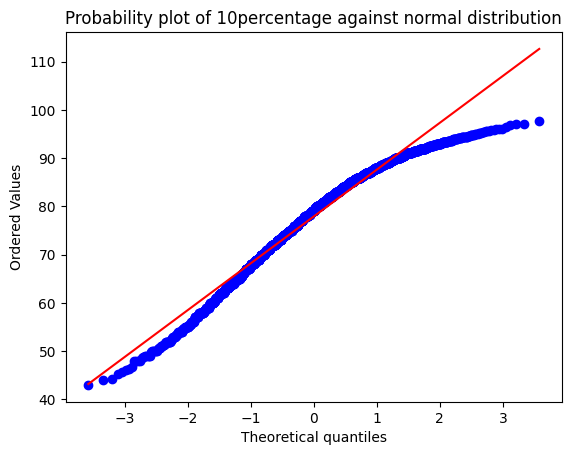

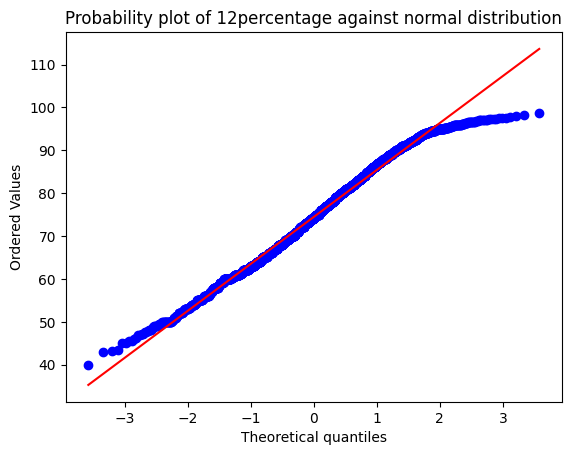

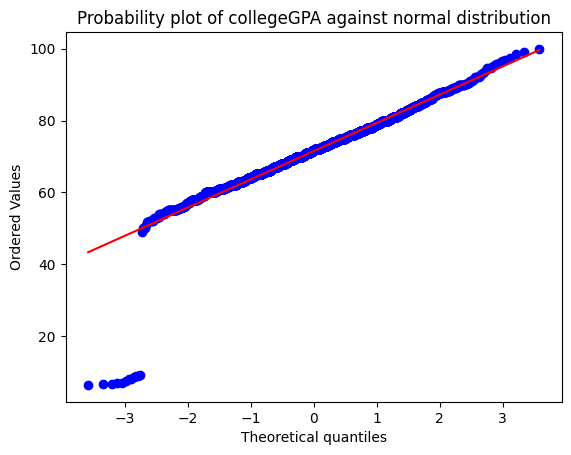

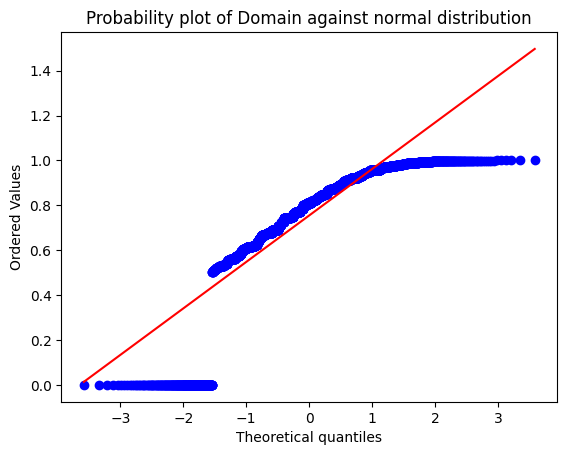

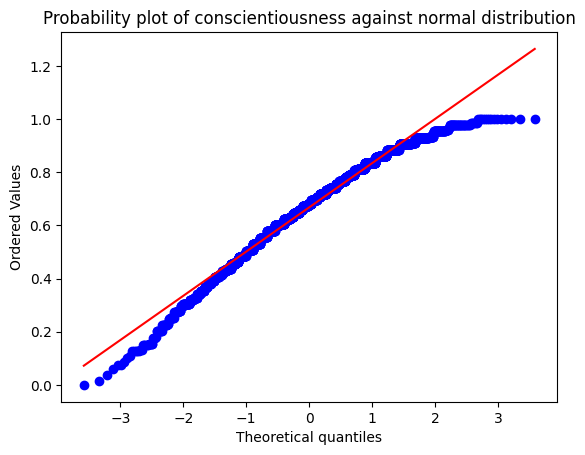

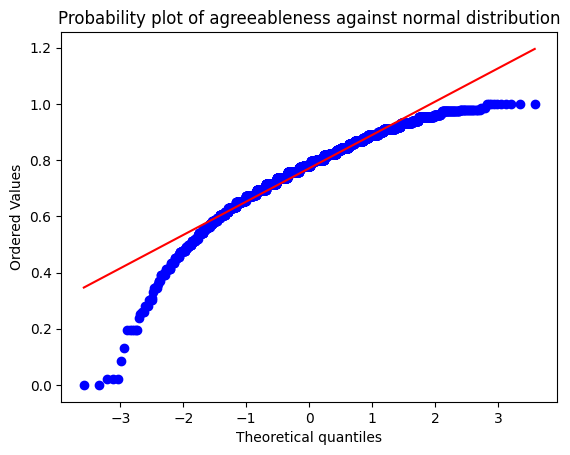

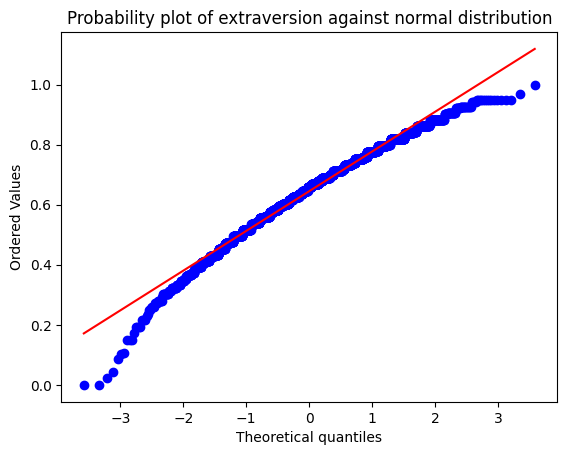

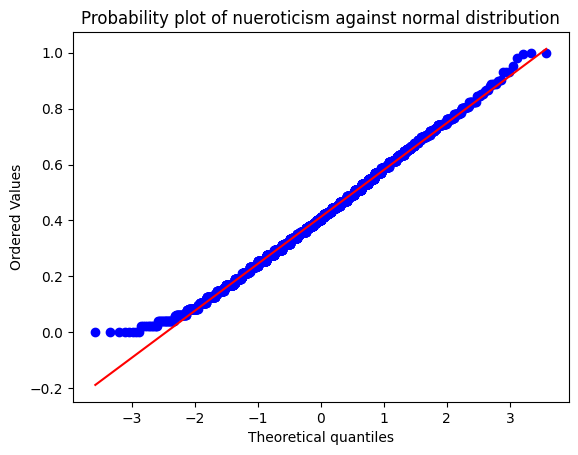

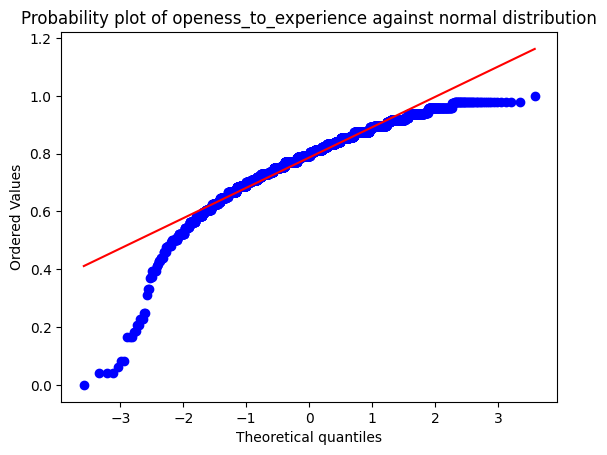

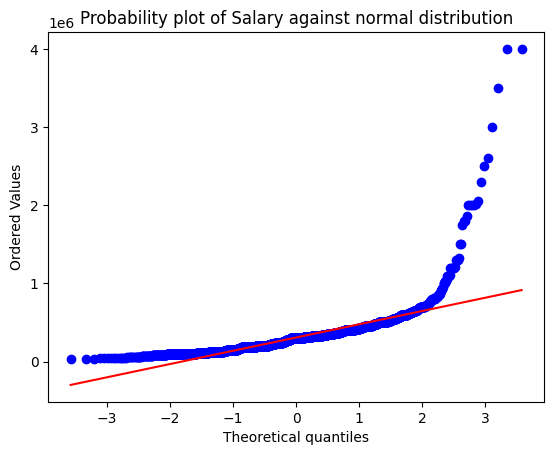

In [57]:
from scipy import stats
for i in new_df[continous_numerical_columns]:
    stats.probplot(new_df[i], dist="norm", plot=plt)
    plt.title(f'Probability plot of {i} against normal distribution')
    plt.show()

from the qqplot i can observe that the data is not normally distributed 

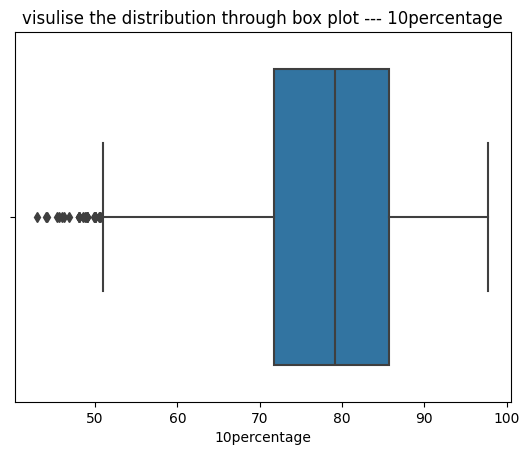

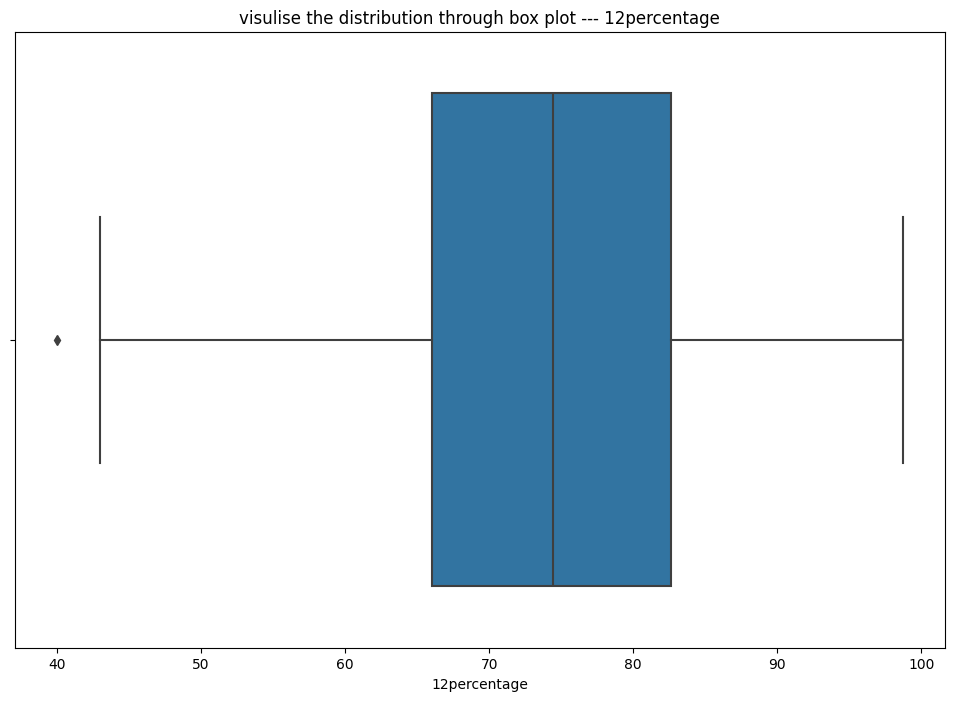

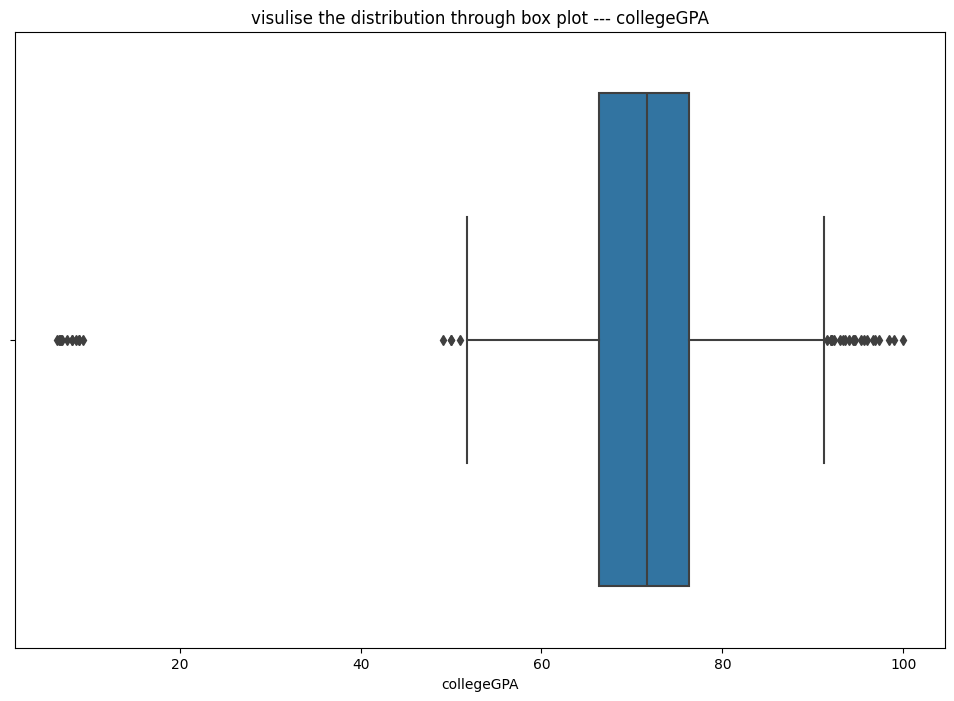

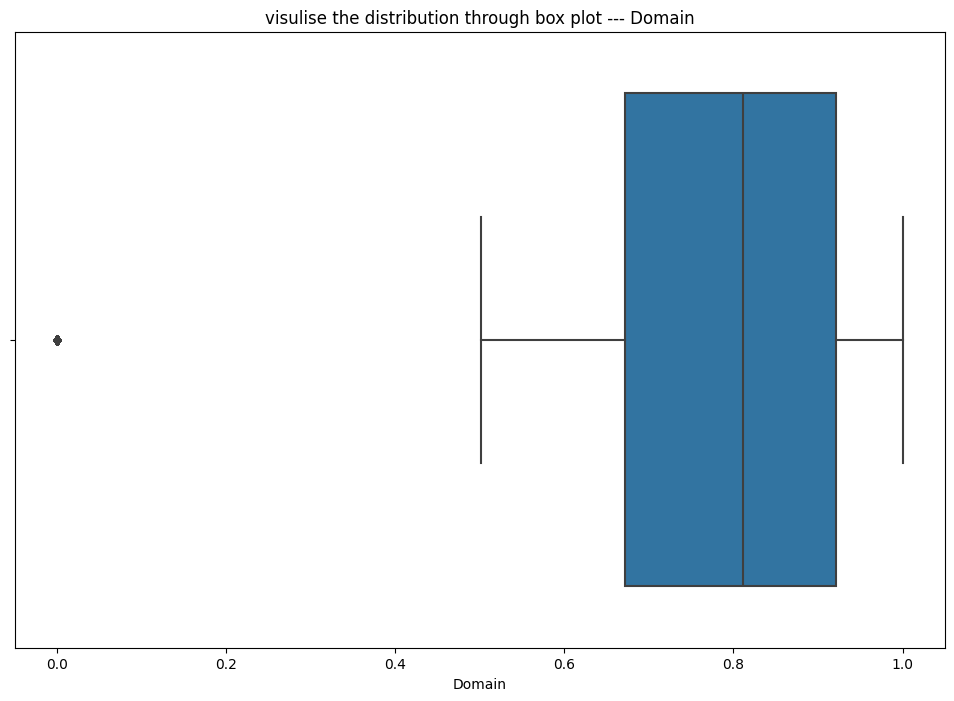

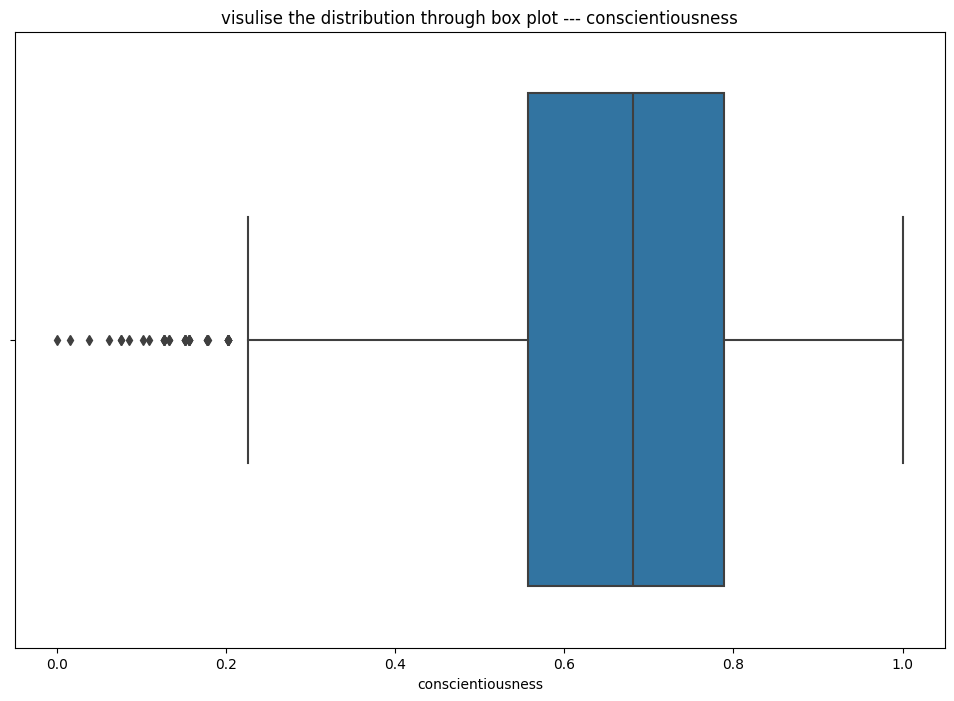

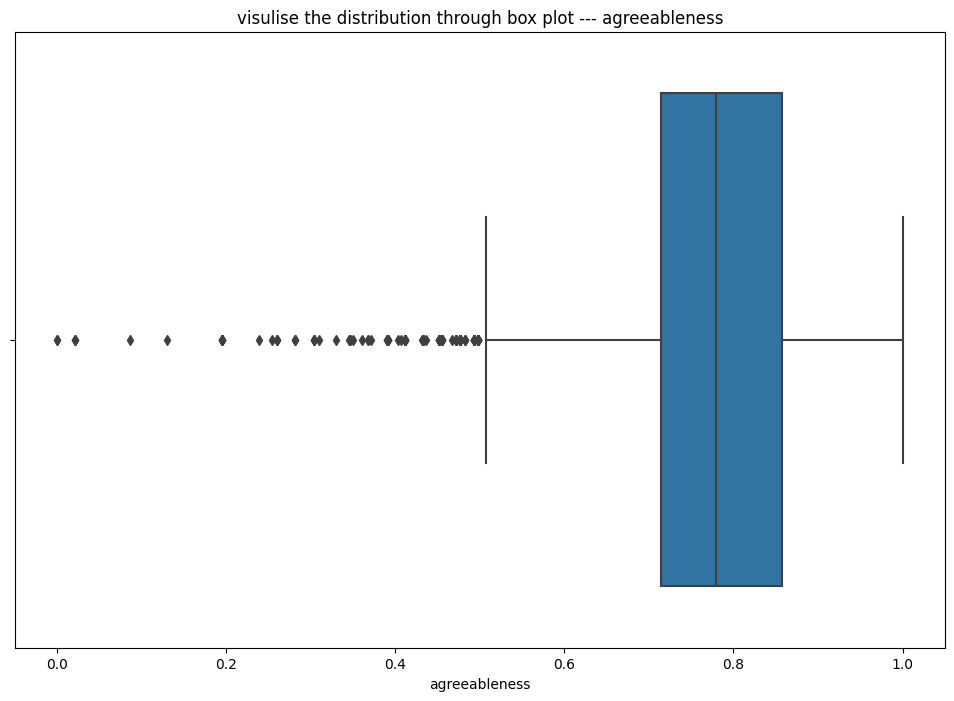

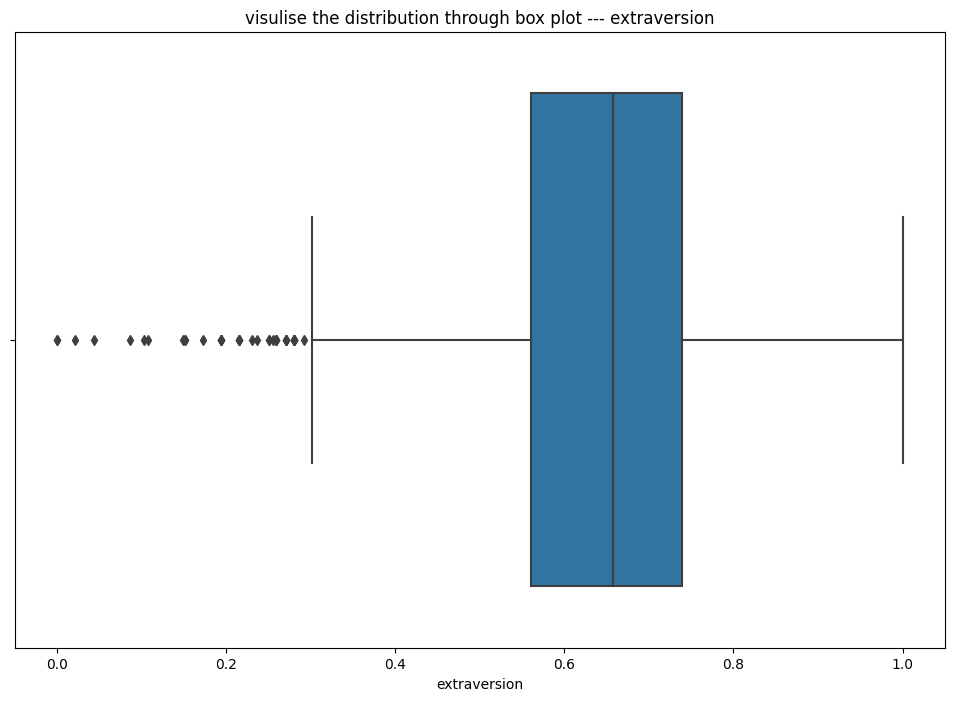

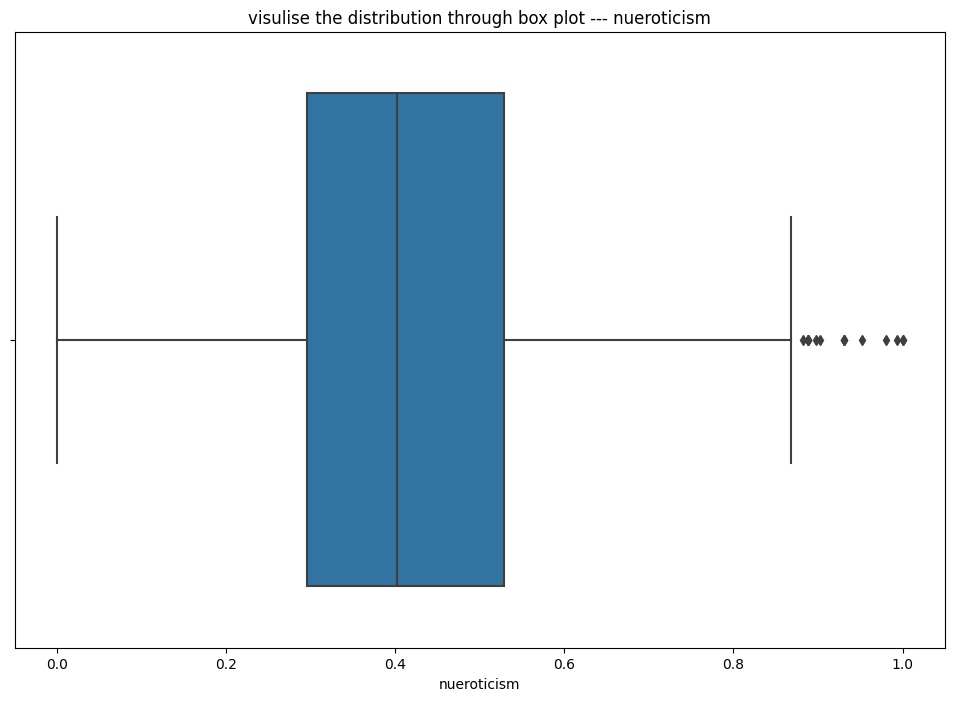

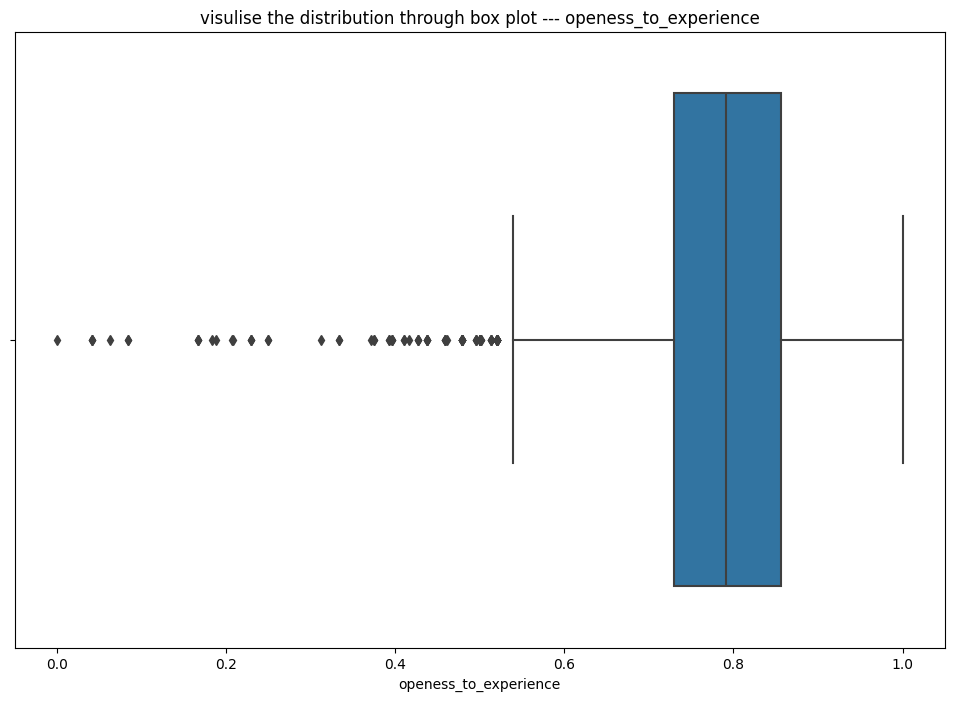

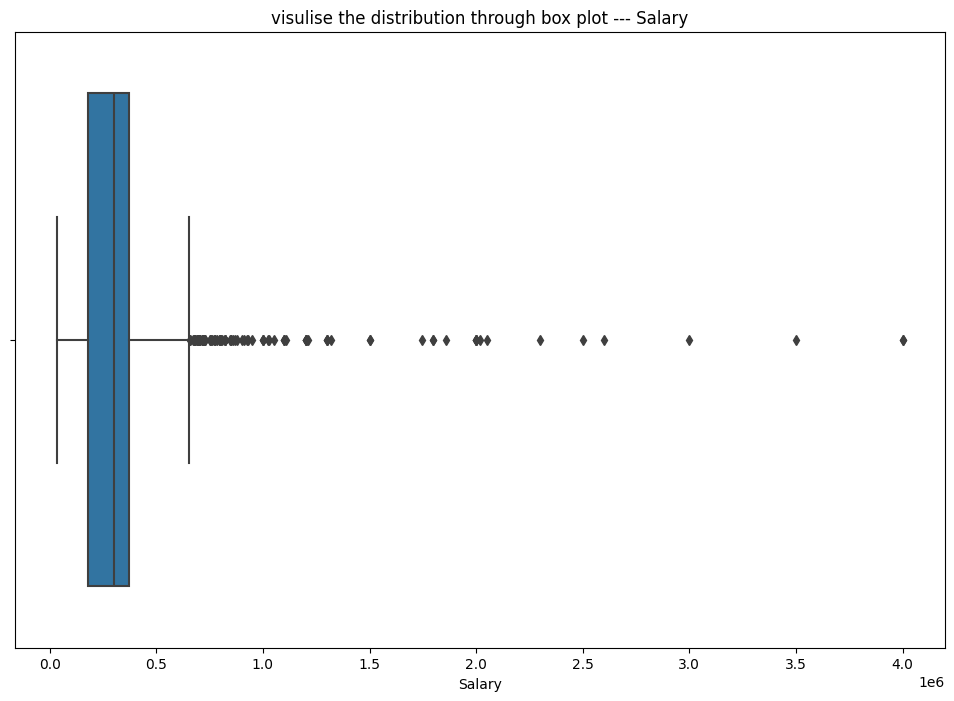

<Figure size 1200x800 with 0 Axes>

In [58]:
for i in new_df[continous_numerical_columns].columns:
    plt.title(f'visulise the distribution through box plot --- {i}')
    sns.boxplot(data = new_df, x = i)
    plt.figure(figsize = (12,8))
    plt.tight_layout()

*****observation****
1.  most of the people secured a percentage of 79 and minimum percentage secured by the people is 52 and the maximum percentage secured is 97, 25% percent of the people secured within the 71 and 75% of people secured within 87.
2. avg marks secured by most of the people is 75 in the 12th, least percentage is around 45 and the highest percentage secured is 97. 25% of people secured lessthan the 66 and 75% people secured lessthan 82 percent.
3.avg marks secured by people is 71 in the graduation, minimum marks secured is around 51, highest marks secured is around 91. 25% marks secured by people below 66 and 75% of marks secured by people is below 76.as there are people who secured less than the minimum and maximum score.
4.avg amacat score acquired by people is 0.82, maximum marks acquired is 0.99 and minimum marks acquired is around 0.51.
10. because of the outliers in the data average salary varies ,avg salary acquired each individual 30k.

# using IQR technique to remove the outliers

In [59]:
def removing_outliers(df, columns):
    filtered_df = df.copy()
    for i in columns:
        q1 = df[i].quantile(0.25)
        q3 = df[i].quantile(0.75)
        IQR = q3 - q1
        lower_bound = q1 - 1.5 * IQR
        upper_bound = q3 + 1.5 * IQR
        filtered_df = filtered_df[(filtered_df[i] >= lower_bound) & (filtered_df[i] < upper_bound)]
    return filtered_df

new_df_1 = removing_outliers(new_df, continous_numerical_columns)

In [60]:
new_df.shape

(3998, 38)

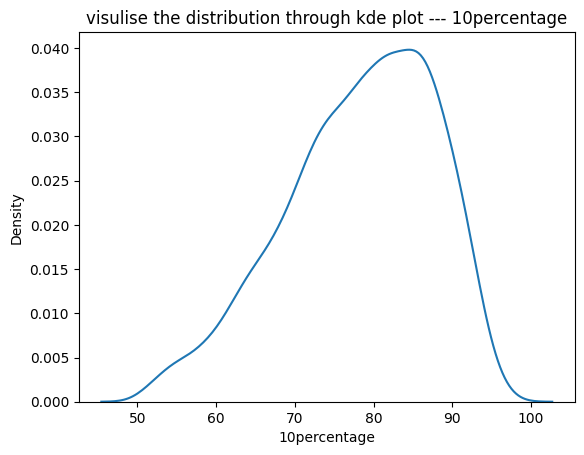

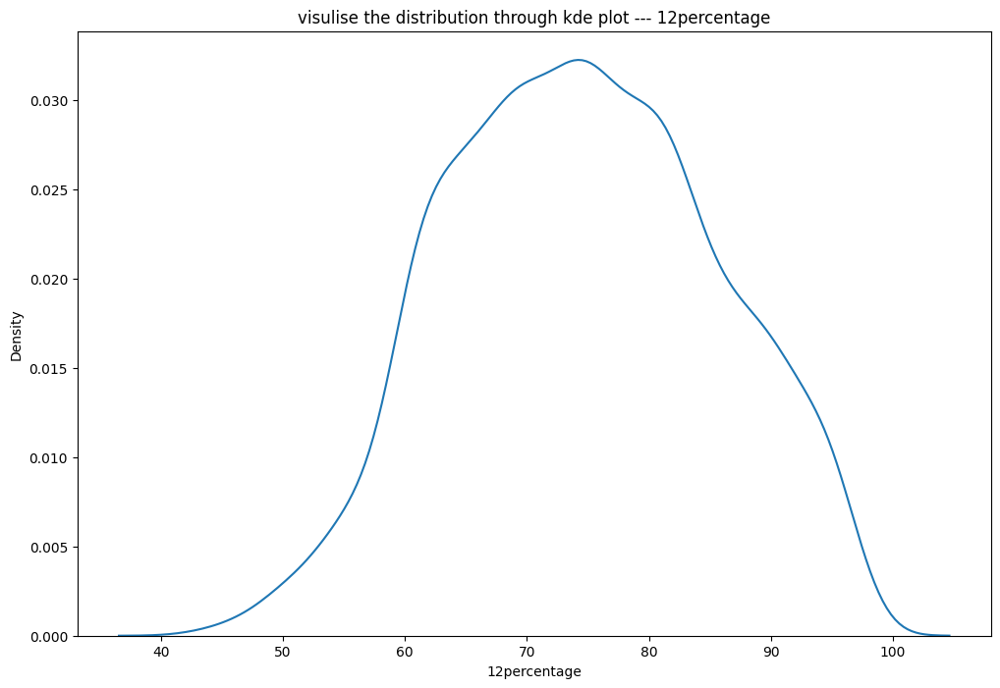

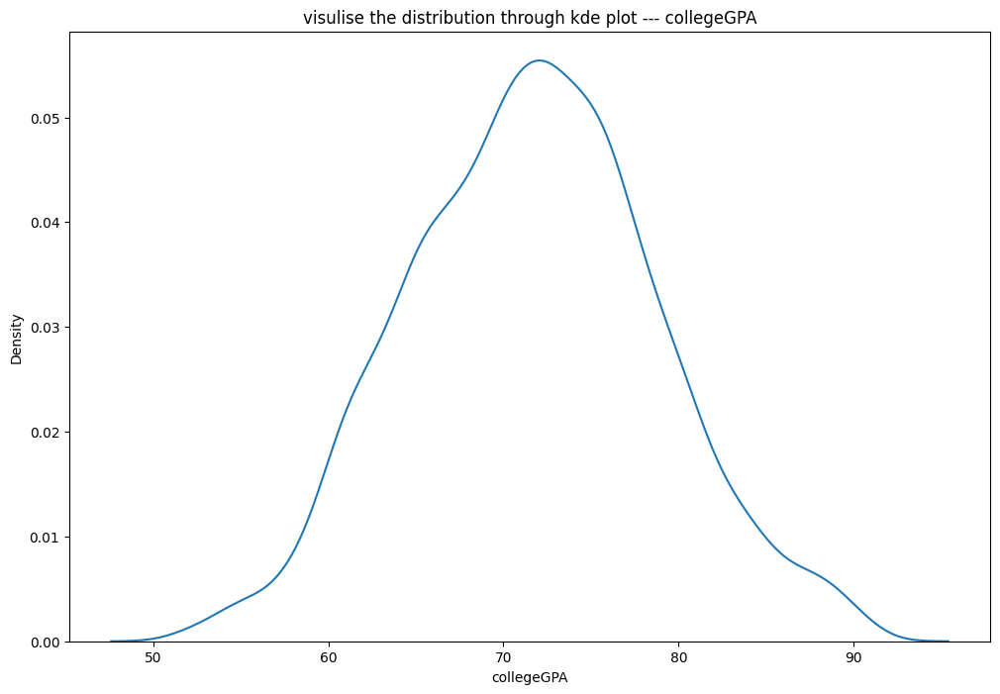

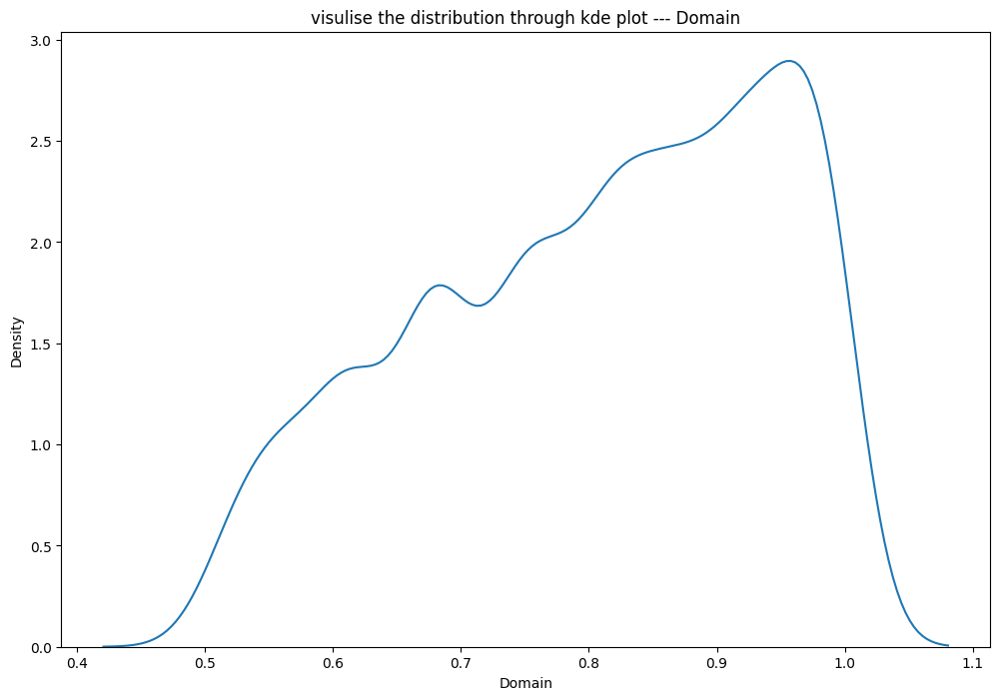

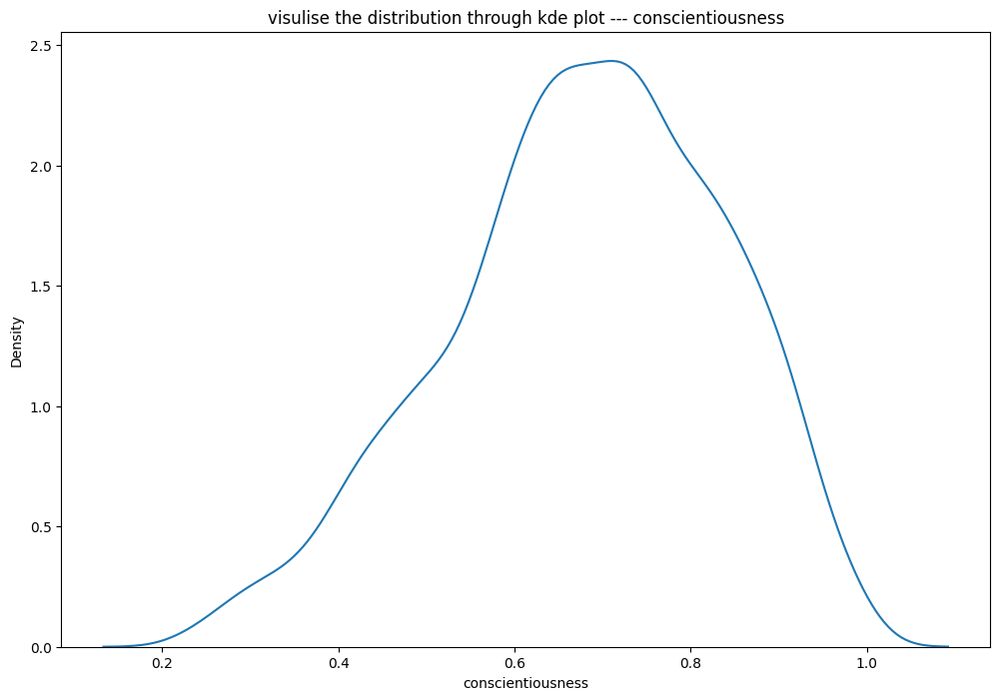

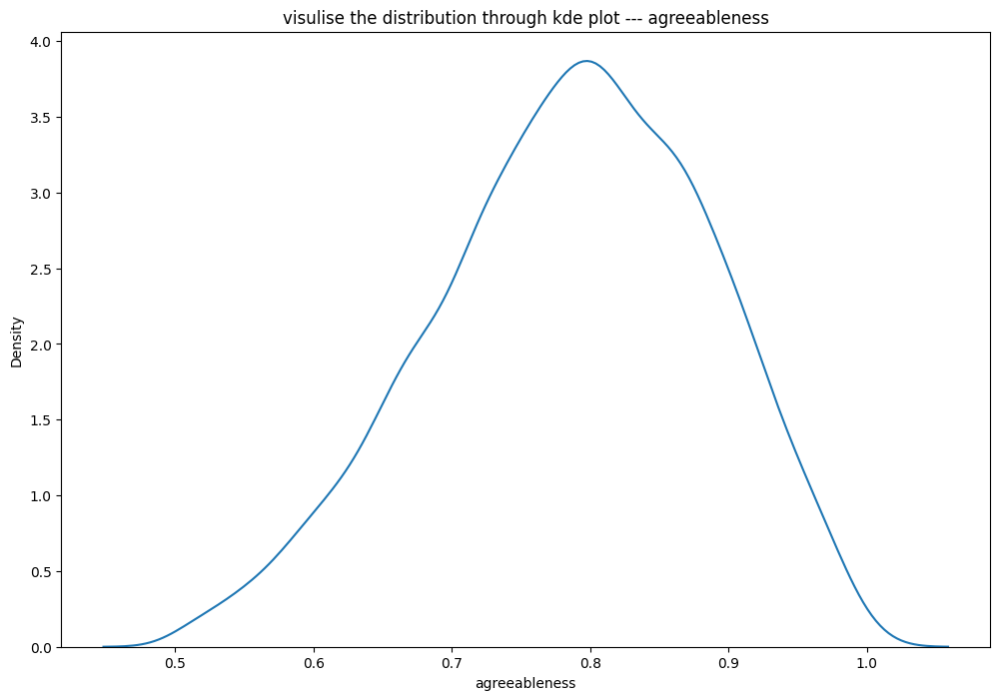

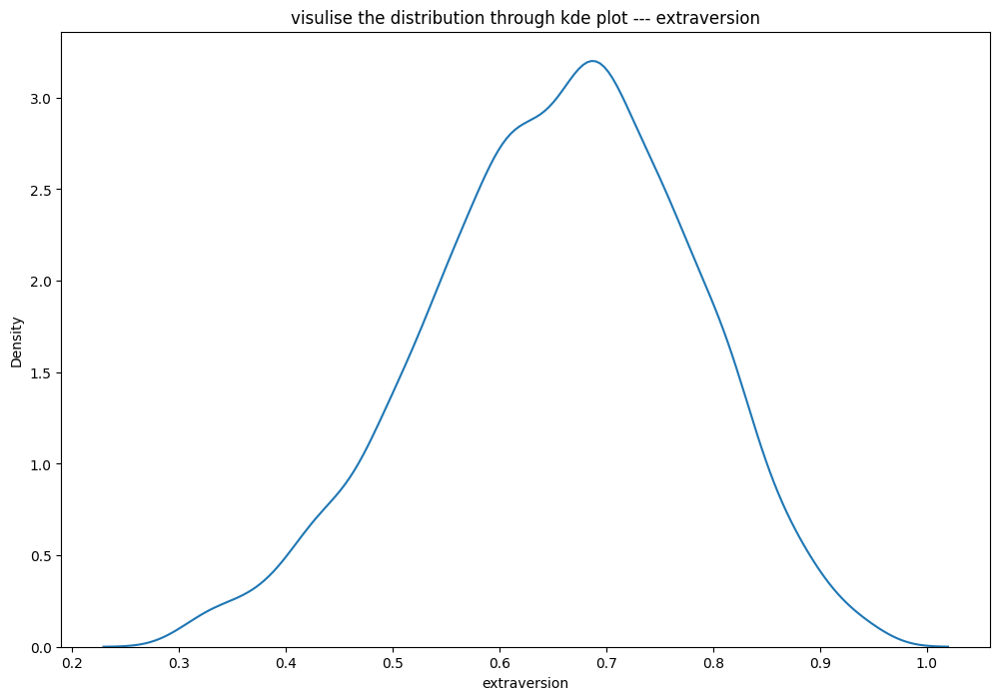

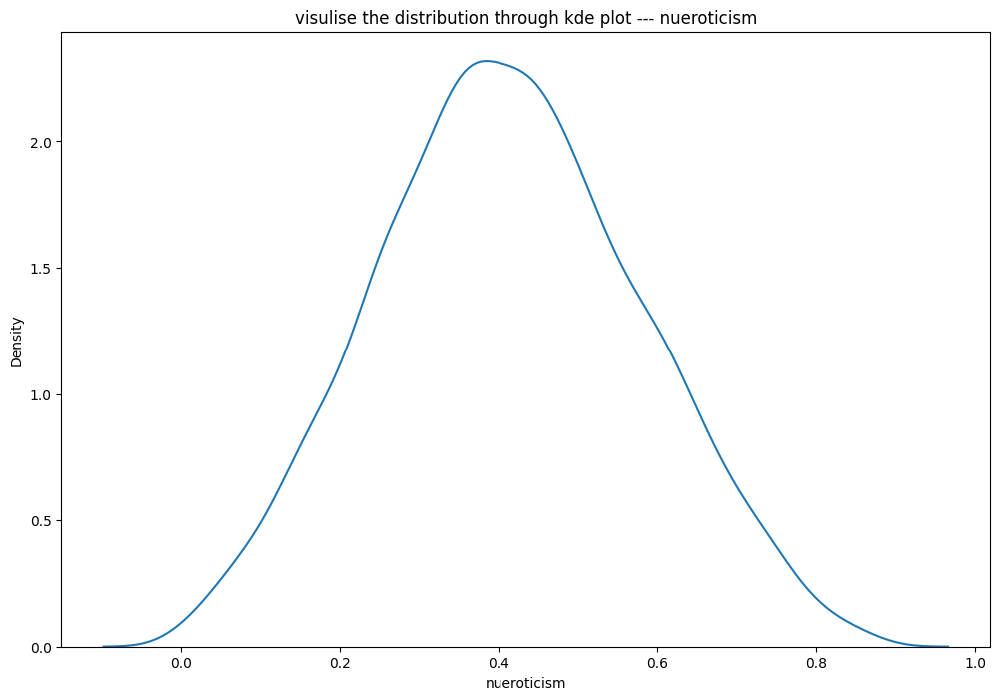

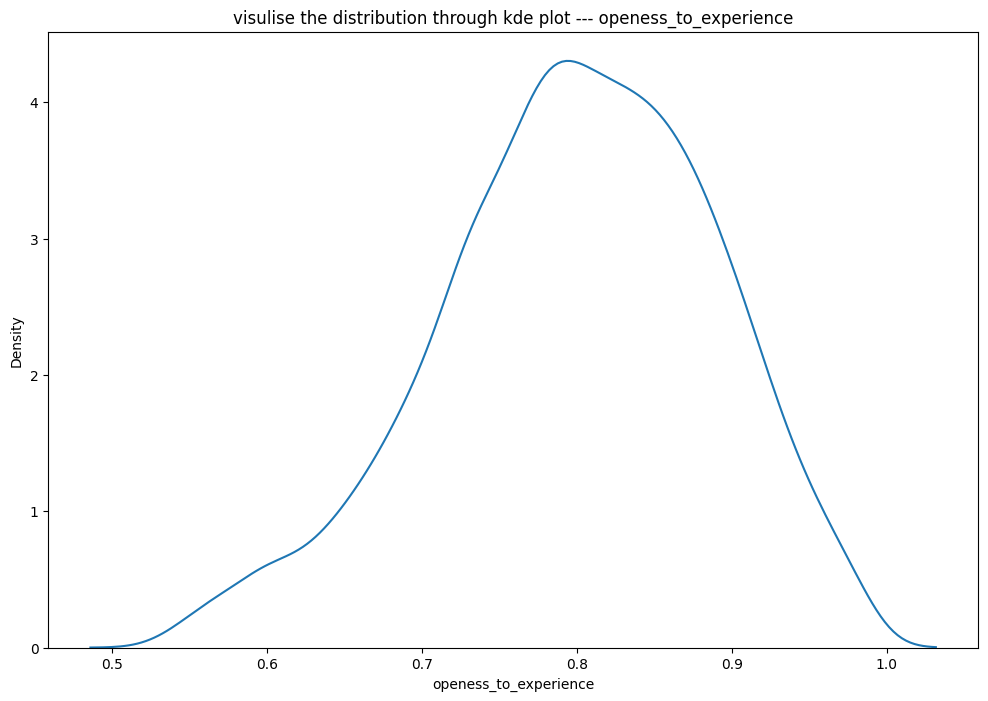

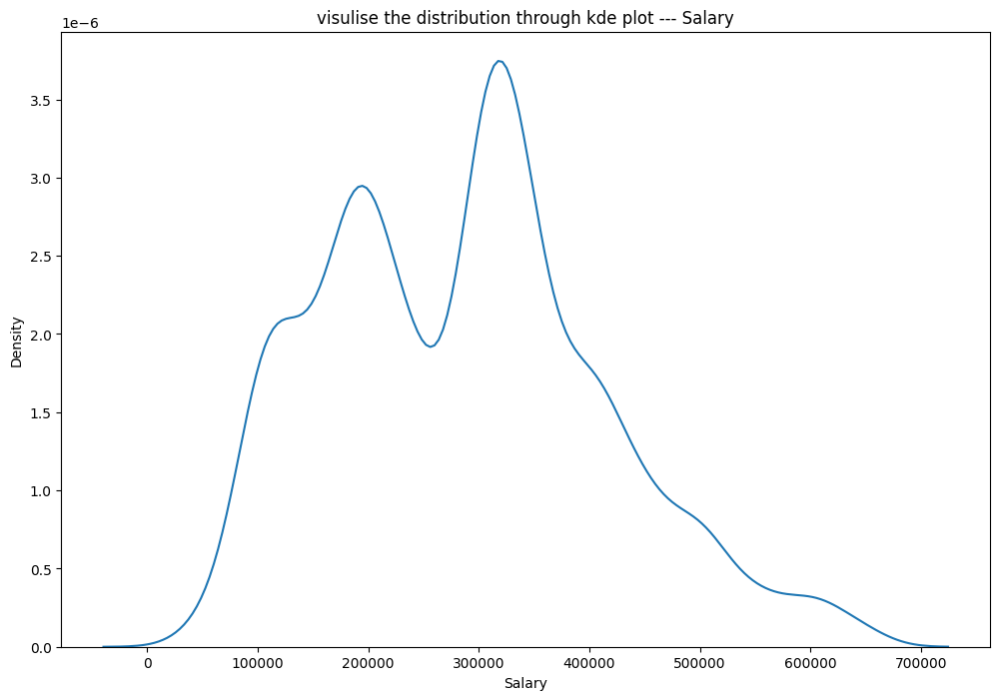

<Figure size 1200x800 with 0 Axes>

In [61]:
for i in new_df_1[continous_numerical_columns]:
    plt.title(f'visulise the distribution through kde plot --- {i}')
    sns.kdeplot(data = new_df_1, x = i)
    plt.figure(figsize = (12,8))
    plt.tight_layout()

Through kernel density plot i can able visulaise the probability of  occuarnce of the event for each columns.

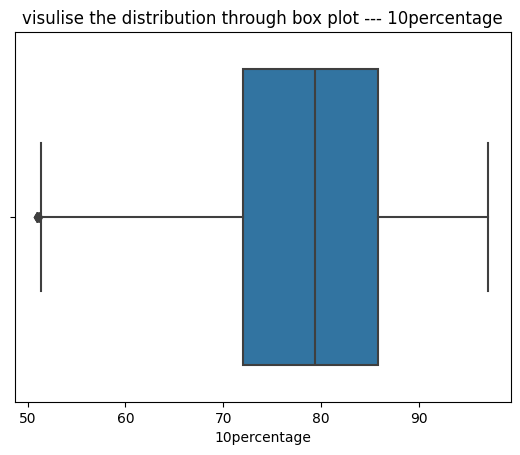

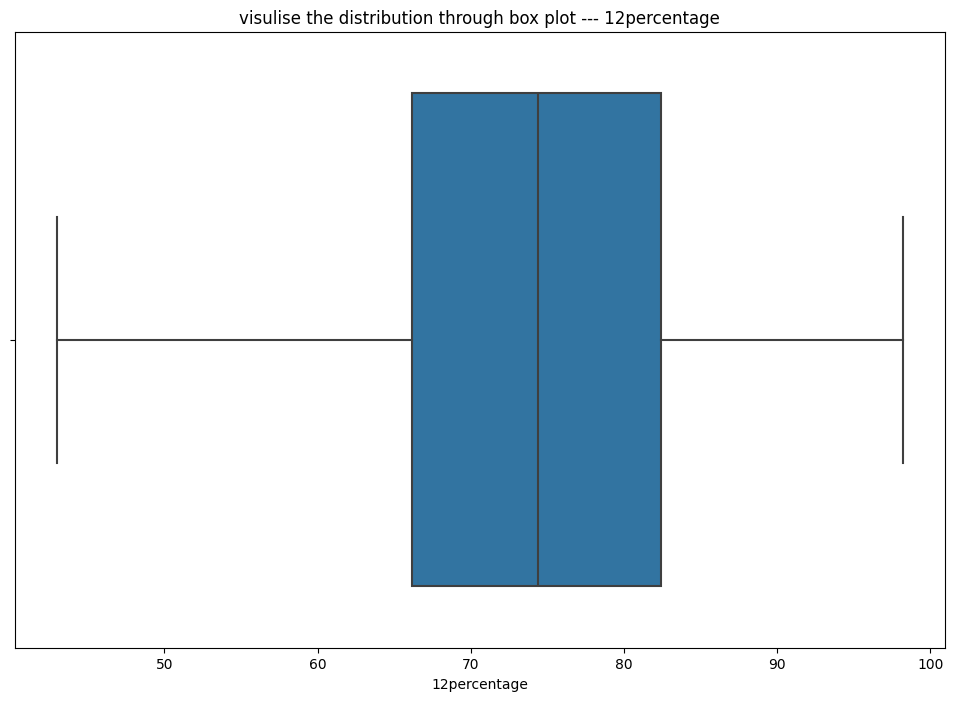

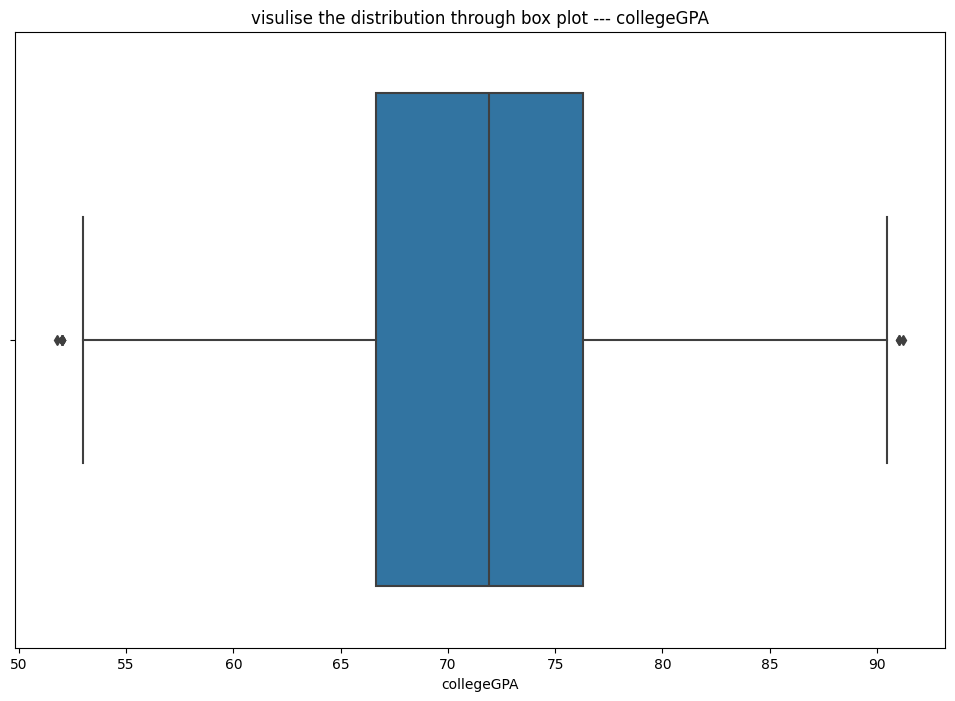

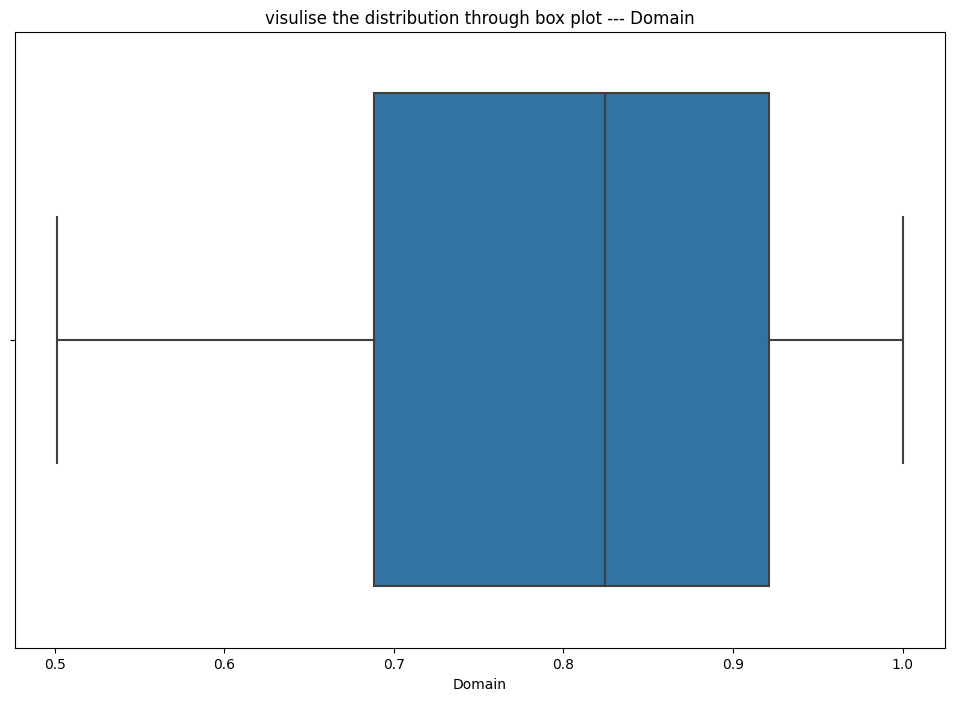

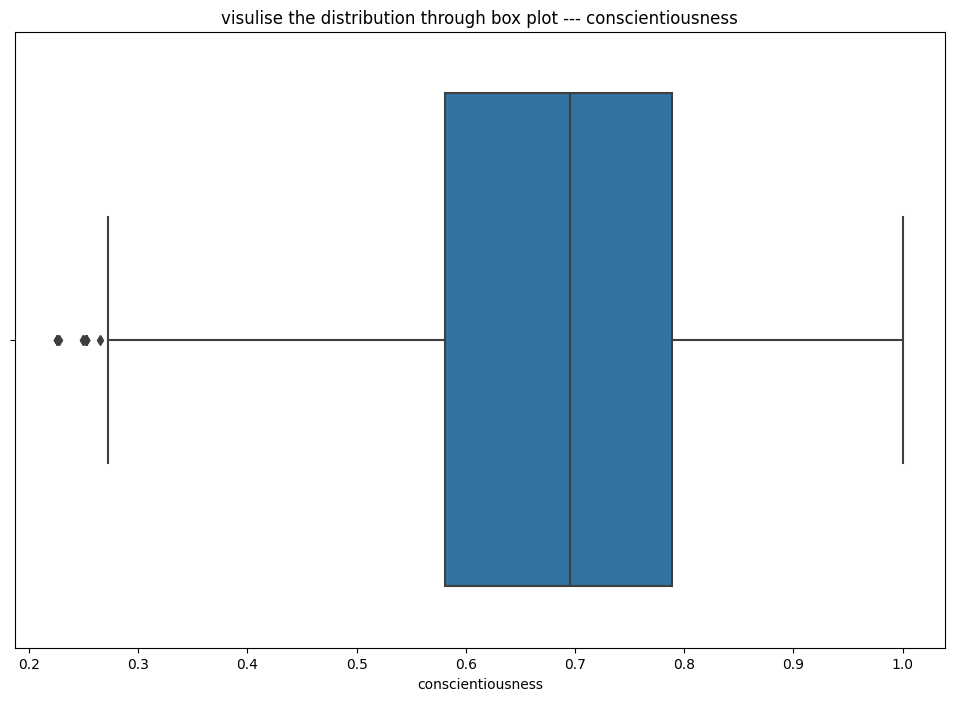

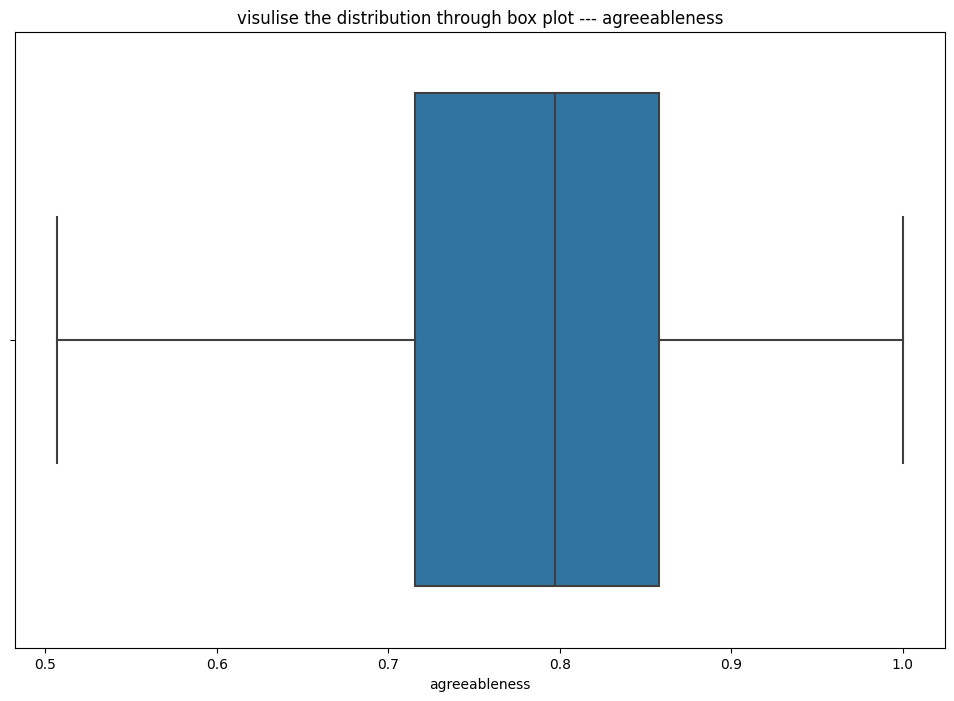

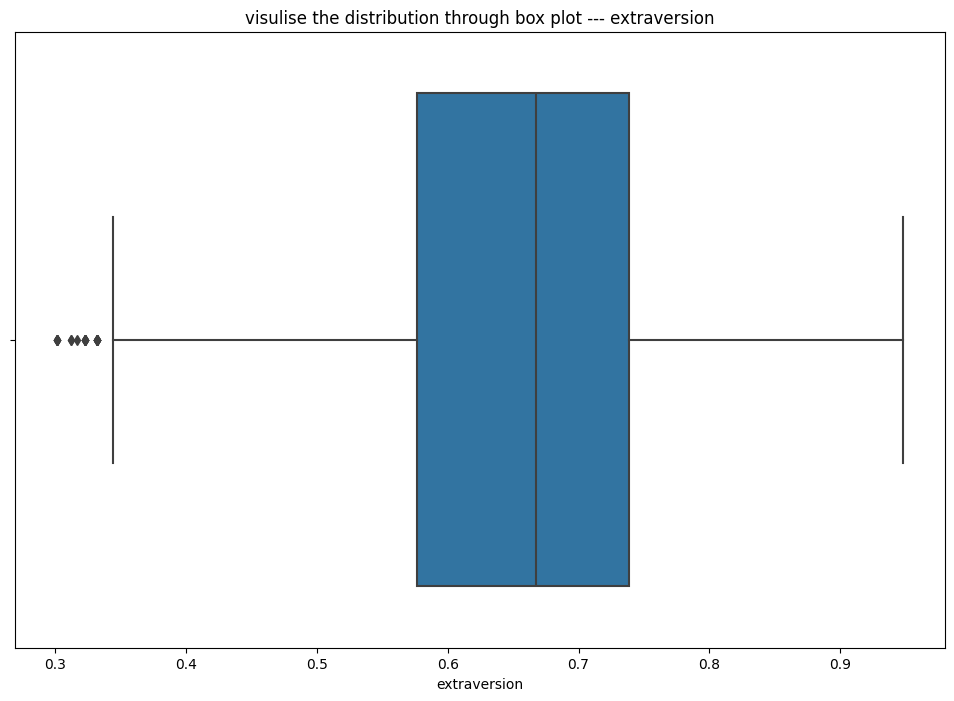

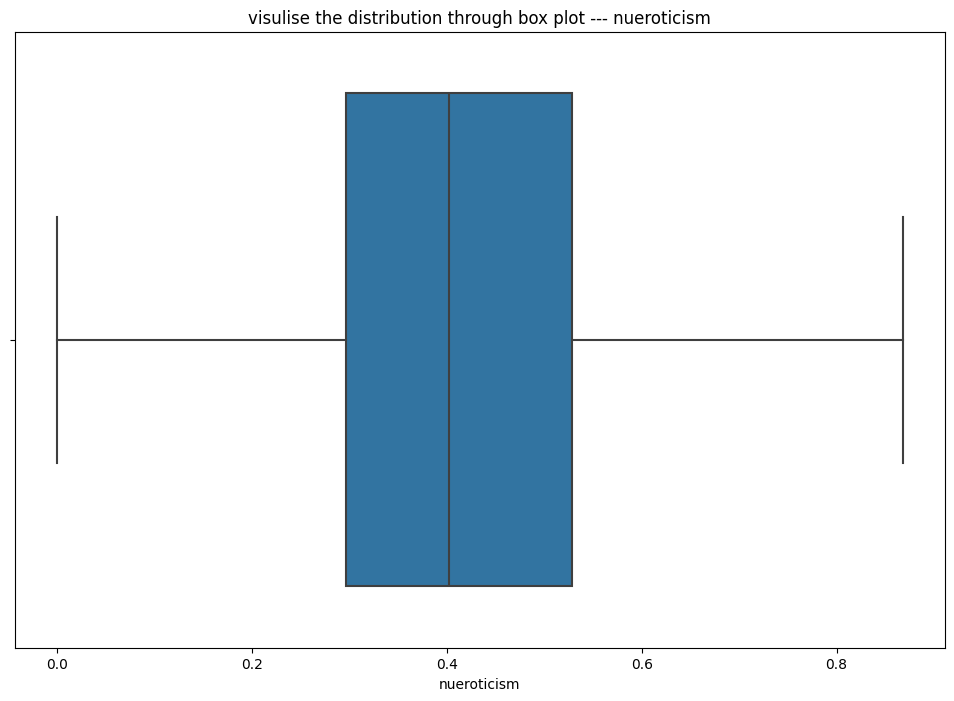

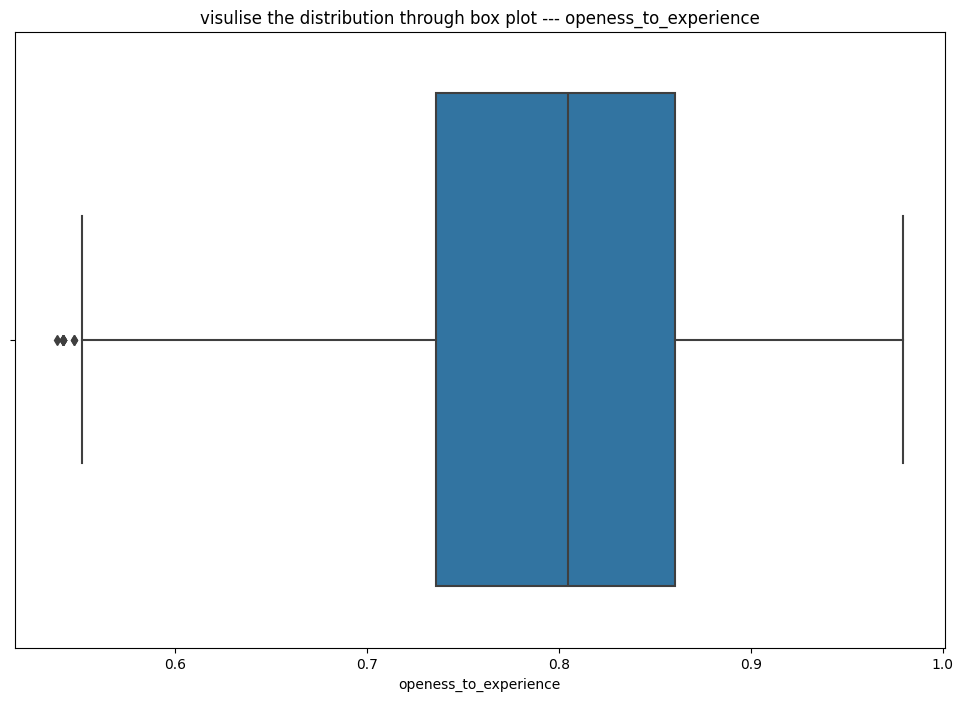

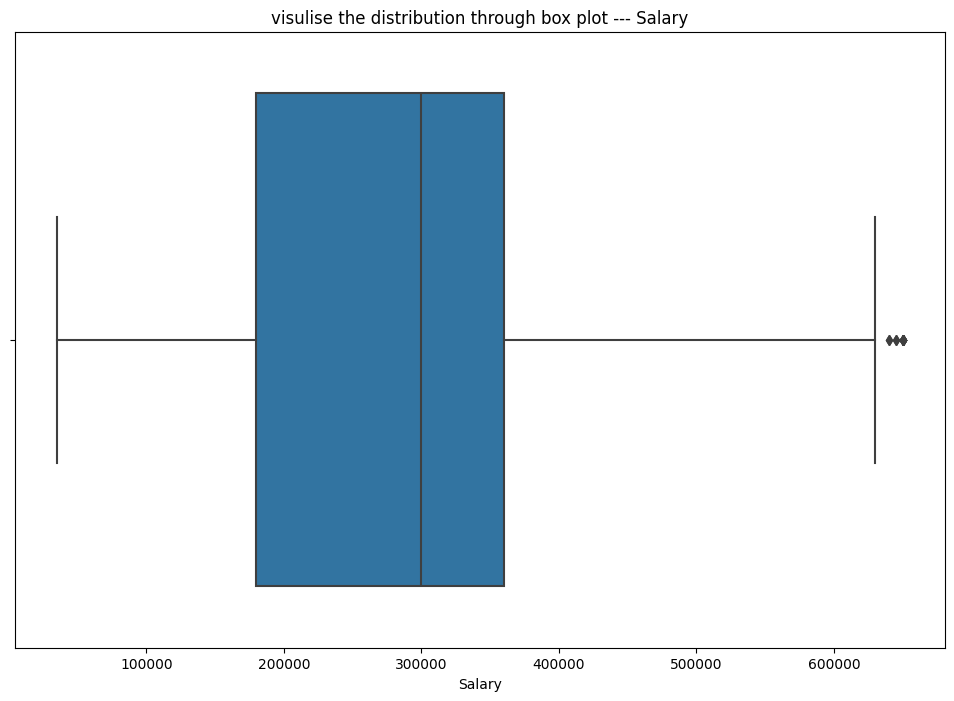

<Figure size 1200x800 with 0 Axes>

In [62]:
for i in new_df_1[continous_numerical_columns]:
    plt.title(f'visulise the distribution through box plot --- {i}')
    sns.boxplot(data = new_df_1, x = i)
    plt.figure(figsize = (12,8))
    plt.tight_layout()

after removing the outliers most of the features are distributed properly.

for instance for the salary column avg salary per person is around 3lakhs and maximum salary is above 6 lakhs and minimum is below 1 lakhs and 1.8 lakhs salary is acquired by 25 percent of people.3.8 lakhs salary is acquired 75 percent of people.

In [63]:
new_df[discrete_numerical_columns].head()

,ID,DOJ,DOB,12graduation,CollegeID,CollegeTier,CollegeCityID,CollegeCityTier,GraduationYear,English,Logical,Quant,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg
0,203097,2012-06-01,1990-02-19,2007,1141,2,1141,0,2011,515,585,525,445,-1,-1,-1,-1,-1,-1
1,579905,2013-09-01,1989-10-04,2007,5807,2,5807,0,2012,695,610,780,-1,466,-1,-1,-1,-1,-1
2,810601,2014-06-01,1992-08-03,2010,64,2,64,0,2014,615,545,370,395,-1,-1,-1,-1,-1,-1
3,267447,2011-07-01,1989-12-05,2007,6920,1,6920,1,2011,635,585,625,615,-1,-1,-1,-1,-1,-1
4,343523,2014-03-01,1991-02-27,2008,11368,2,11368,0,2012,545,625,465,-1,233,-1,-1,-1,-1,-1


from the data i observed that the there are -1 in the scores, so -1 is not possible score. so, I replacing it with 0, for better visual dipiction.

In [64]:
for i in ['ComputerProgramming','ElectronicsAndSemicon', 'ComputerScience','MechanicalEngg','ElectricalEngg','TelecomEngg', 'CivilEngg']:
    new_df[i].replace({-1 : 0}, inplace = True)

In [65]:
new_df['MechanicalEngg'].unique()

array([  0, 469, 313, 286, 253, 366, 446, 206, 438, 332, 393, 383, 260,
       561, 553, 376, 526, 284, 409, 473, 340, 223, 420, 538, 346, 435,
       512, 407, 580, 280, 358, 500, 315, 254, 616, 564, 233, 306, 461,
       180, 606, 623], dtype=int64)

In [66]:
for i in new_df[discrete_numerical_columns].columns[4:]:
    print(f'****{i} descriptive properties****')
    print(f'mean of {i} is {new_df[i].mean()}')
    print(f'median of {i} is {new_df[i].median()}')
    print(f'std of {i} is {new_df[i].std()}')
    print(f'quantile 25% of {i} is {new_df[i].quantile(0.25)}')
    print(f'quantile 75% of {i} is {new_df[i].quantile(0.75)}')
    print(f'skew of {i} is {new_df[i].skew()}')
    print(f'kurtosis of {i} is {new_df[i].kurtosis()}')
    print(' ')

****CollegeID descriptive properties****
mean of CollegeID is 5156.851425712856
median of CollegeID is 3879.0
std of CollegeID is 4802.261481733468
quantile 25% of CollegeID is 494.0
quantile 75% of CollegeID is 8818.0
skew of CollegeID is 0.649176333927607
kurtosis of CollegeID is -0.7674413638286568
 
****CollegeTier descriptive properties****
mean of CollegeTier is 1.9257128564282142
median of CollegeTier is 2.0
std of CollegeTier is 0.26227041182047633
quantile 25% of CollegeTier is 2.0
quantile 75% of CollegeTier is 2.0
skew of CollegeTier is -3.2479906747351404
kurtosis of CollegeTier is 8.553722173976427
 
****CollegeCityID descriptive properties****
mean of CollegeCityID is 5156.851425712856
median of CollegeCityID is 3879.0
std of CollegeCityID is 4802.261481733468
quantile 25% of CollegeCityID is 494.0
quantile 75% of CollegeCityID is 8818.0
skew of CollegeCityID is 0.649176333927607
kurtosis of CollegeCityID is -0.7674413638286568
 
****CollegeCityTier descriptive properties

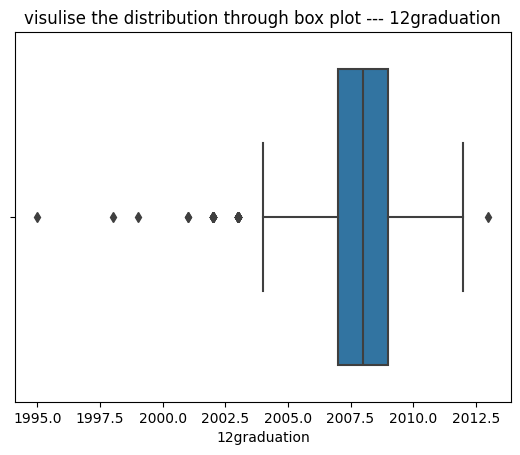

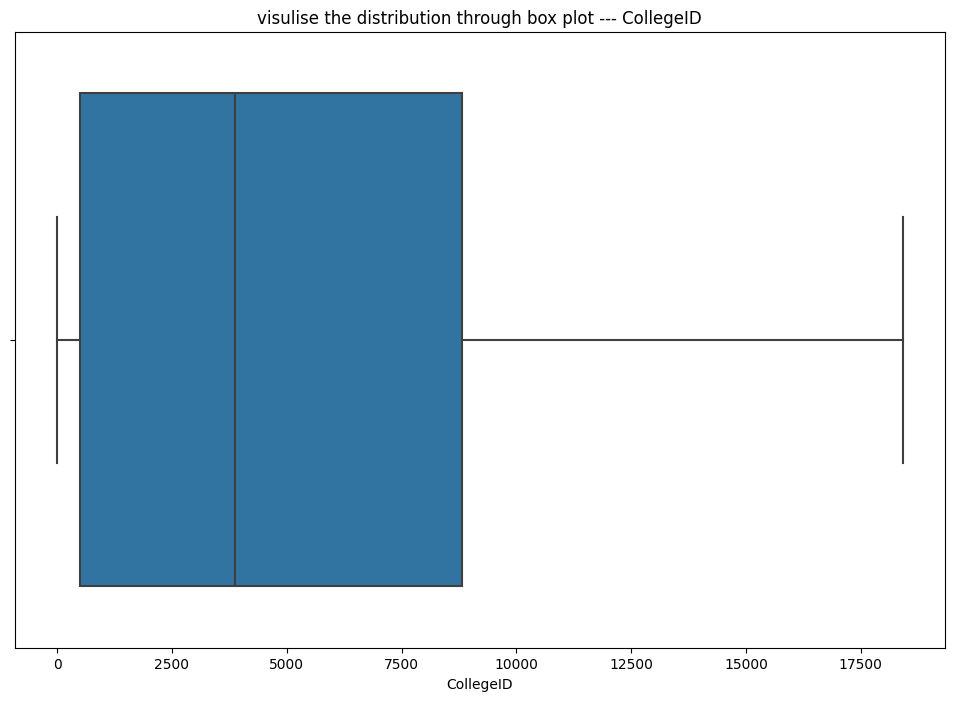

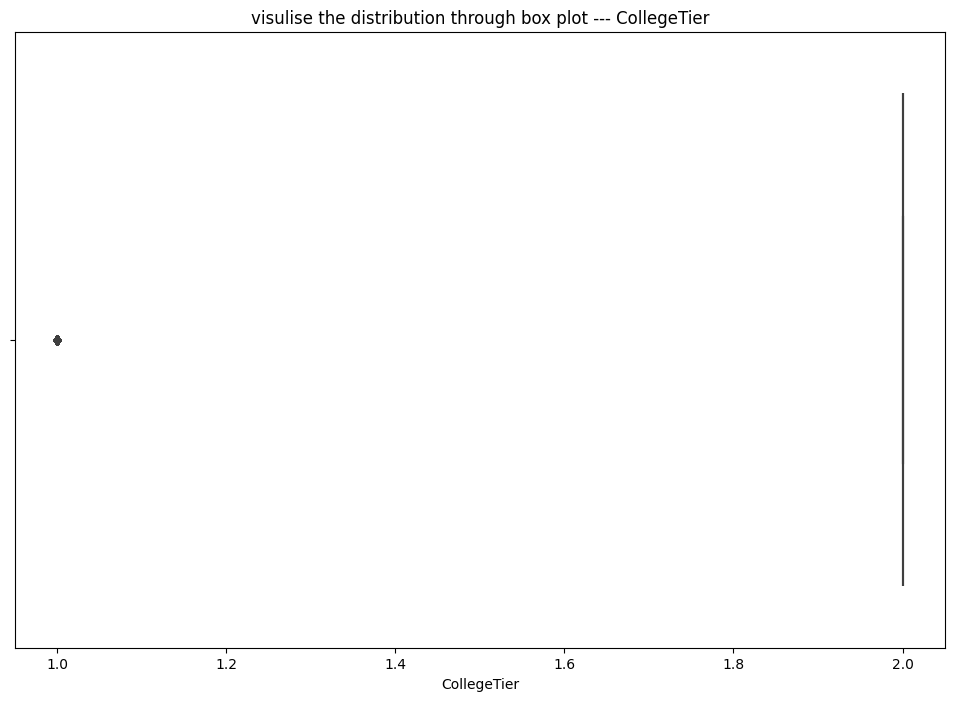

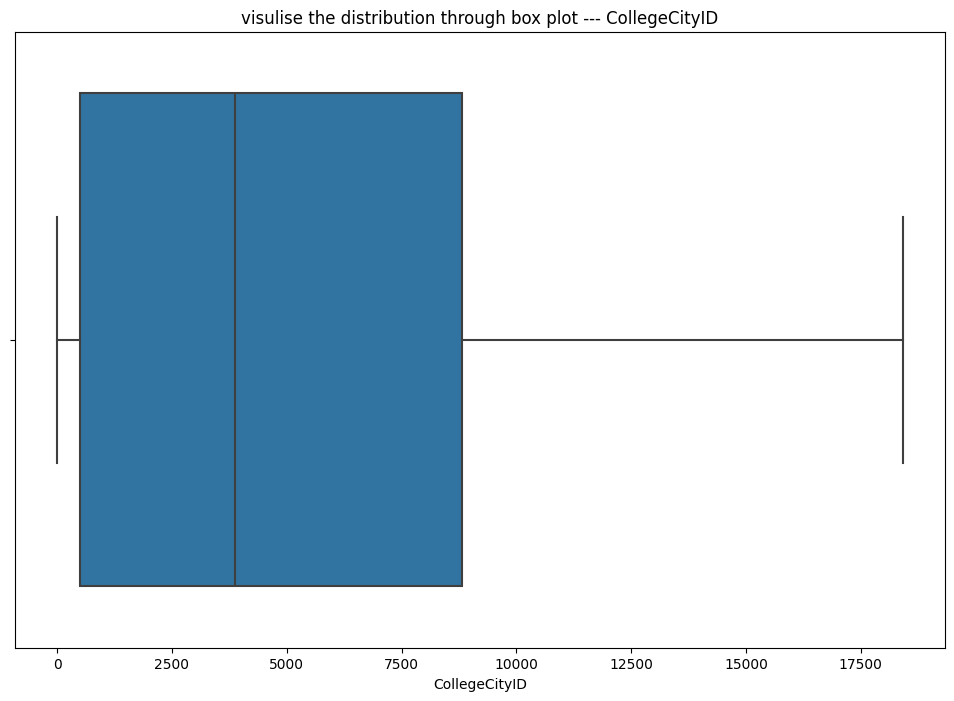

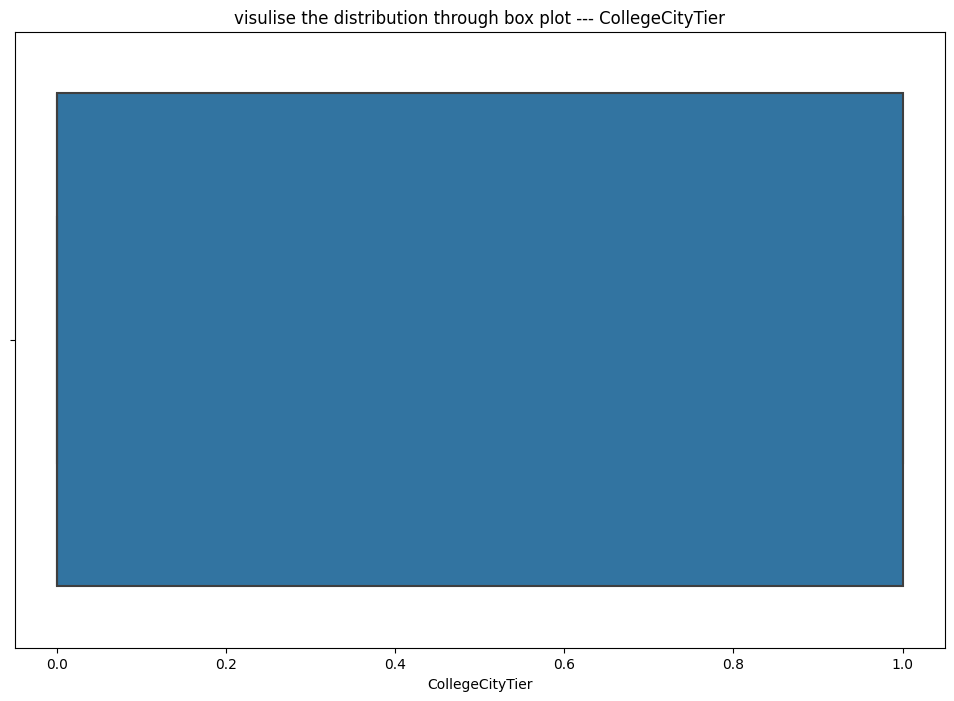

...

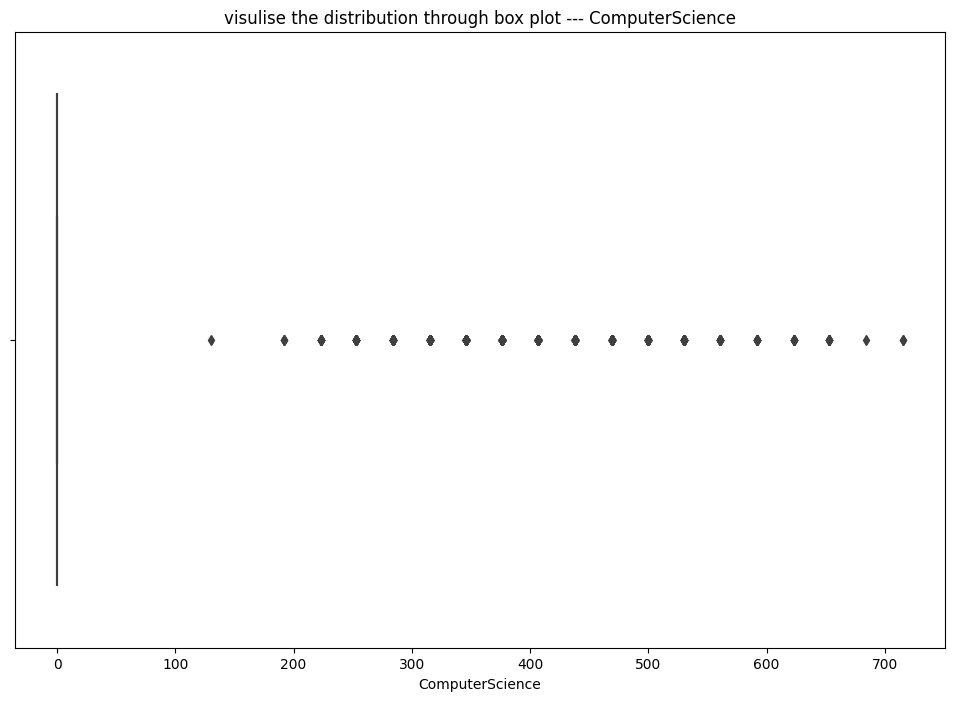

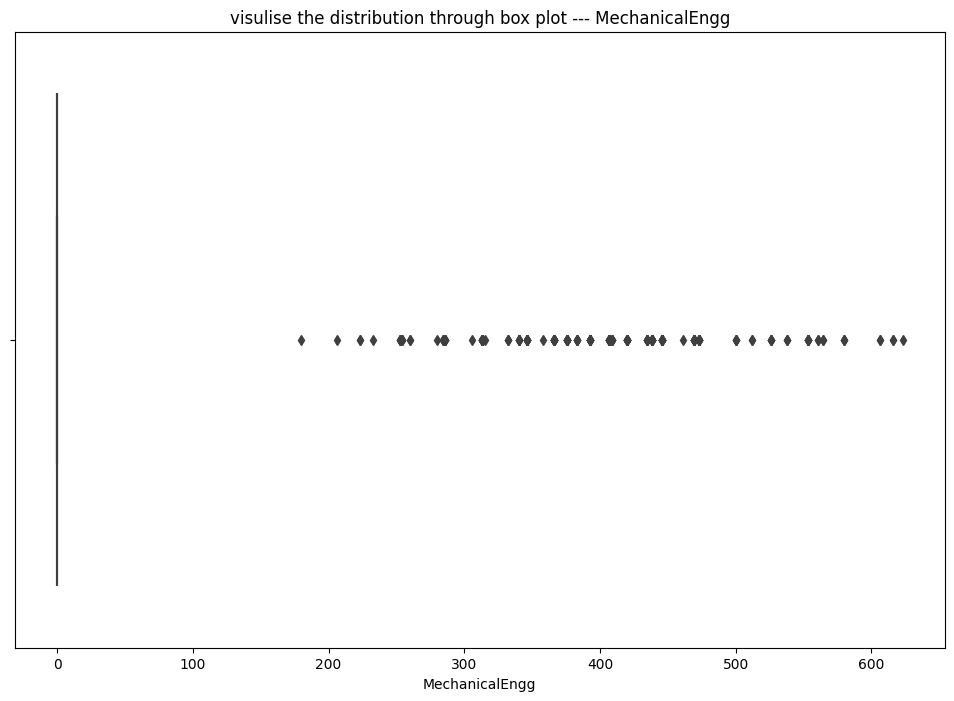

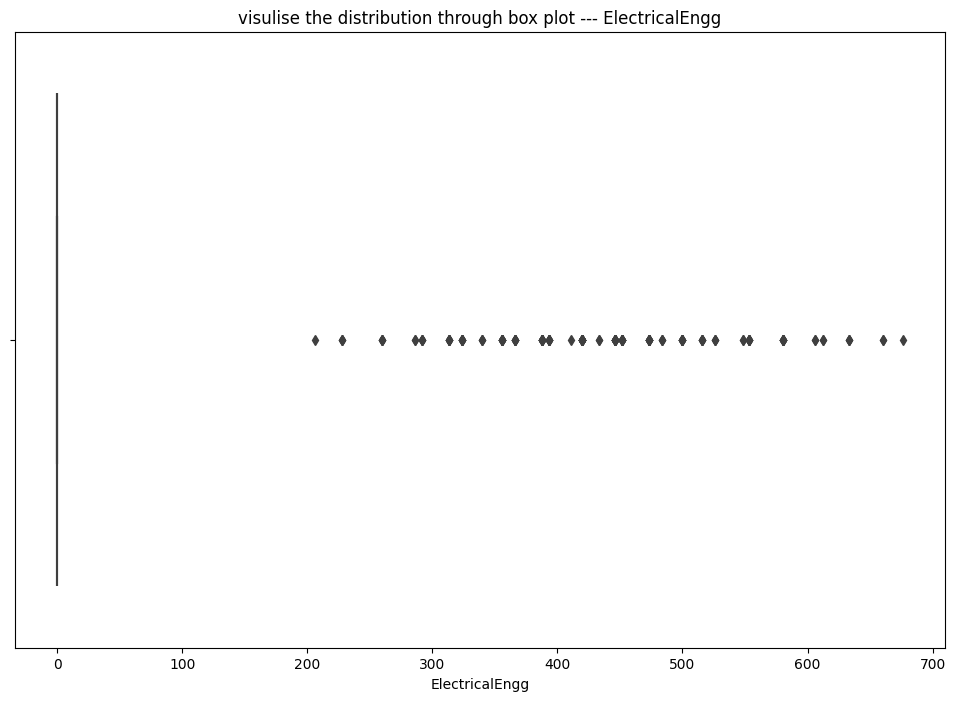

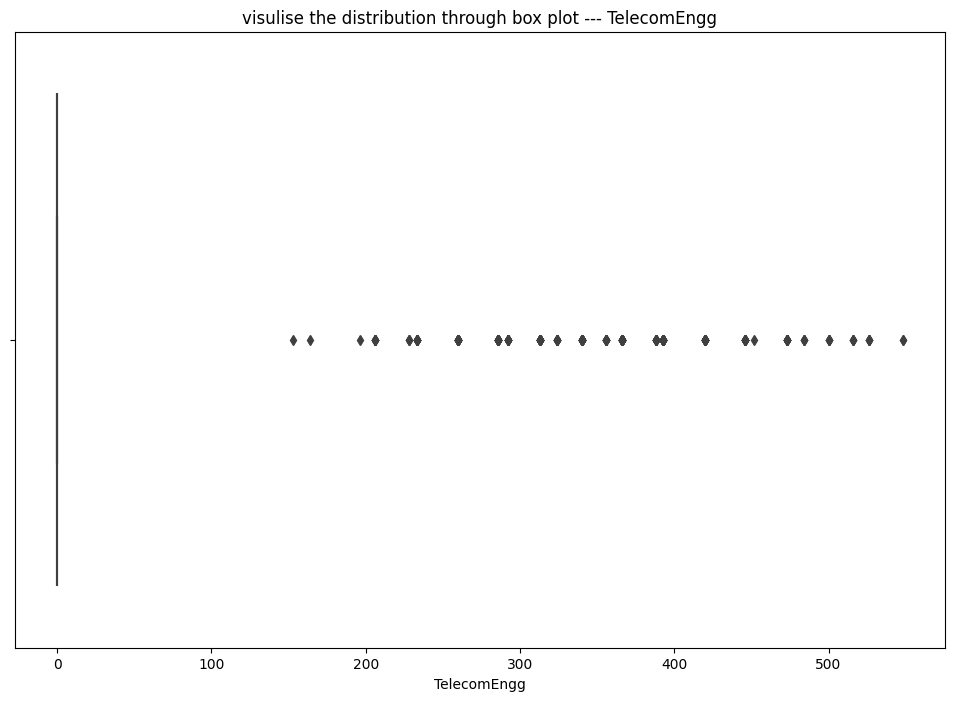

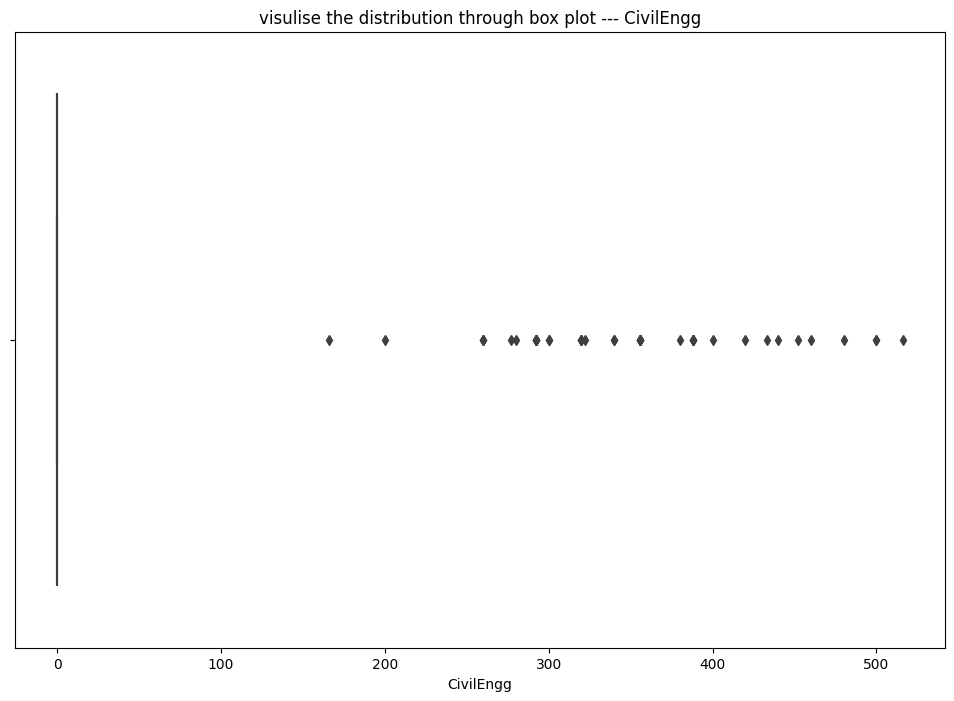

<Figure size 1200x800 with 0 Axes>

In [67]:
columns = ['12graduation', 'CollegeID', 'CollegeTier',
       'CollegeCityID', 'CollegeCityTier', 'GraduationYear', 'English',
       'Logical', 'Quant', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg']
for i in columns:
    plt.title(f'visulise the distribution through box plot --- {i}')
    sns.boxplot(data = new_df, x = i)
    plt.figure(figsize = (12,8))
    plt.tight_layout()

***observations***
**English,Logical,Quant,

majority of people having avg score of around 500, and 25% percent of people having less than 430 score and 75% percent of people having lessthan 580 score.

Outlier detection using Z-score

In [68]:
from scipy.stats import zscore
import pandas as pd

columns = ['12graduation', 'CollegeID', 'CollegeTier',
           'CollegeCityID', 'CollegeCityTier', 'GraduationYear', 'English',
           'Logical', 'Quant', 'ComputerProgramming', 'ElectronicsAndSemicon',
           'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
           'CivilEngg']
z_scores = new_df[columns].apply(zscore)
new_df_1 = new_df[(z_scores.abs() <= 3).all(axis=1)]

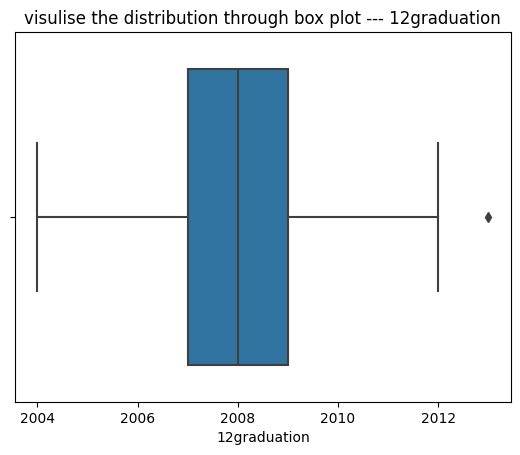

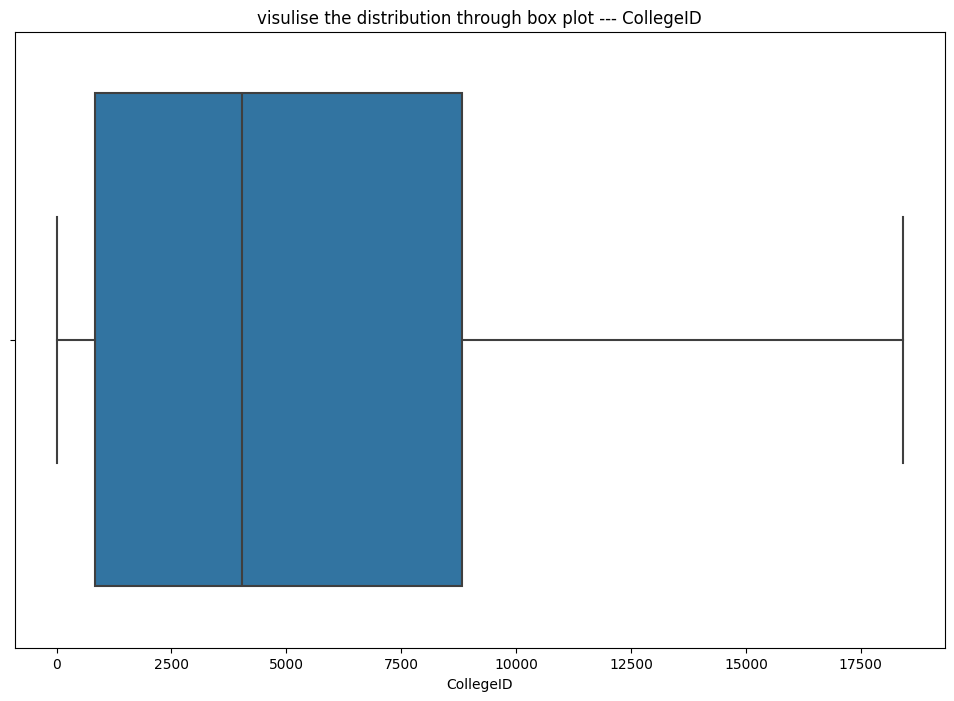

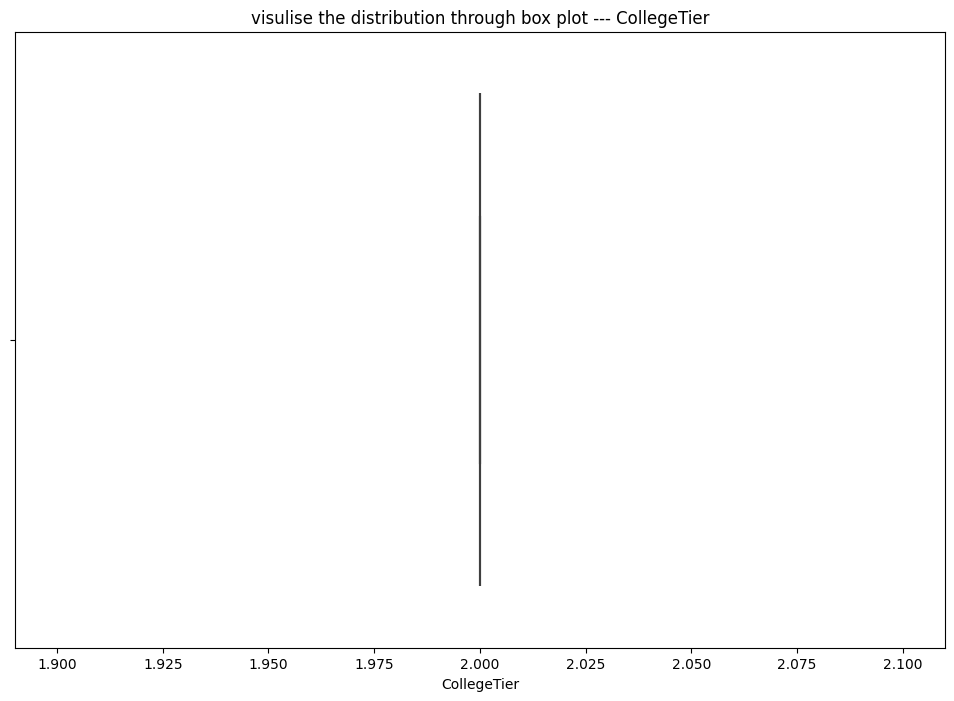

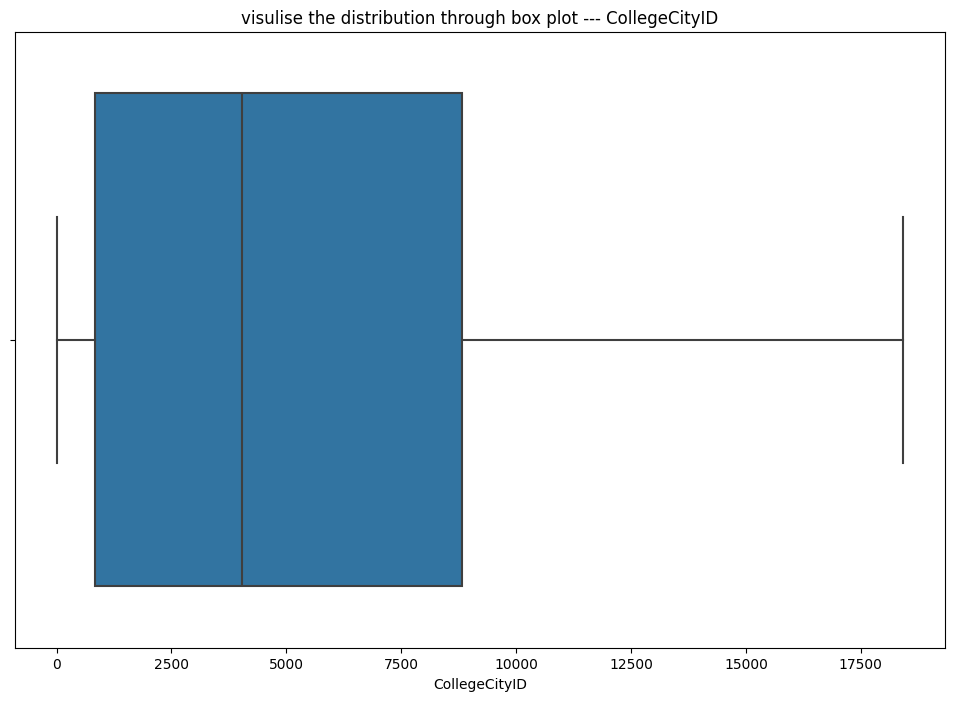

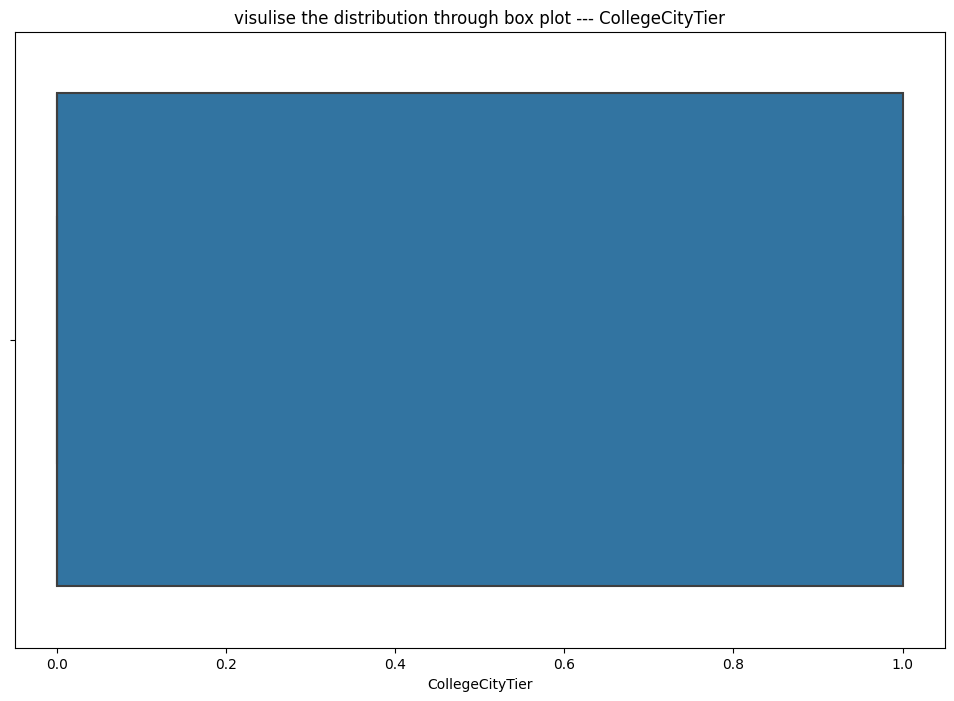

...

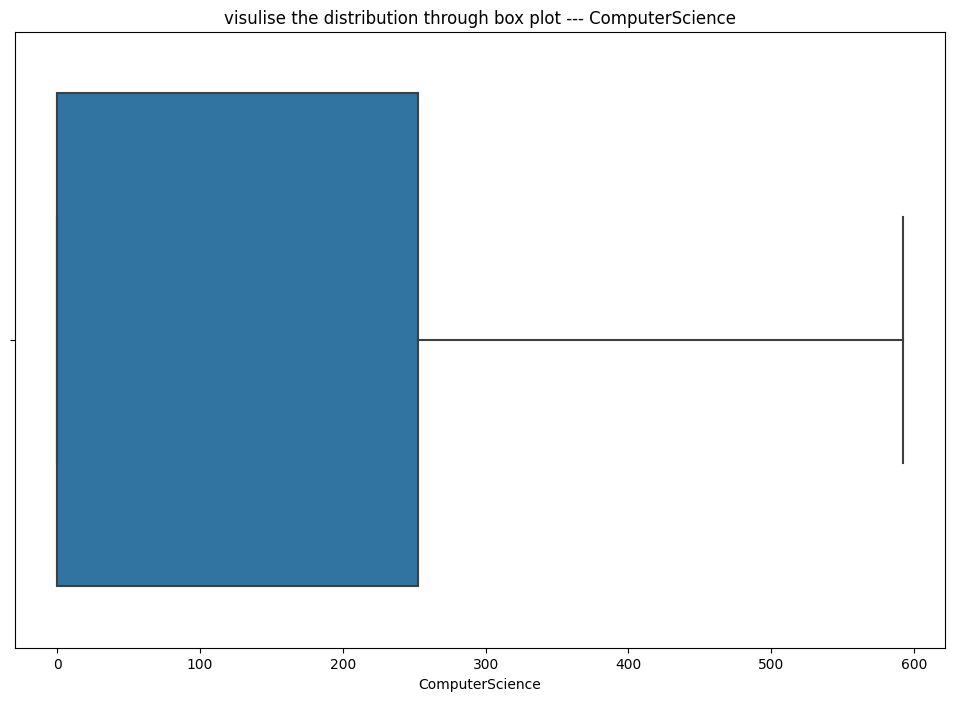

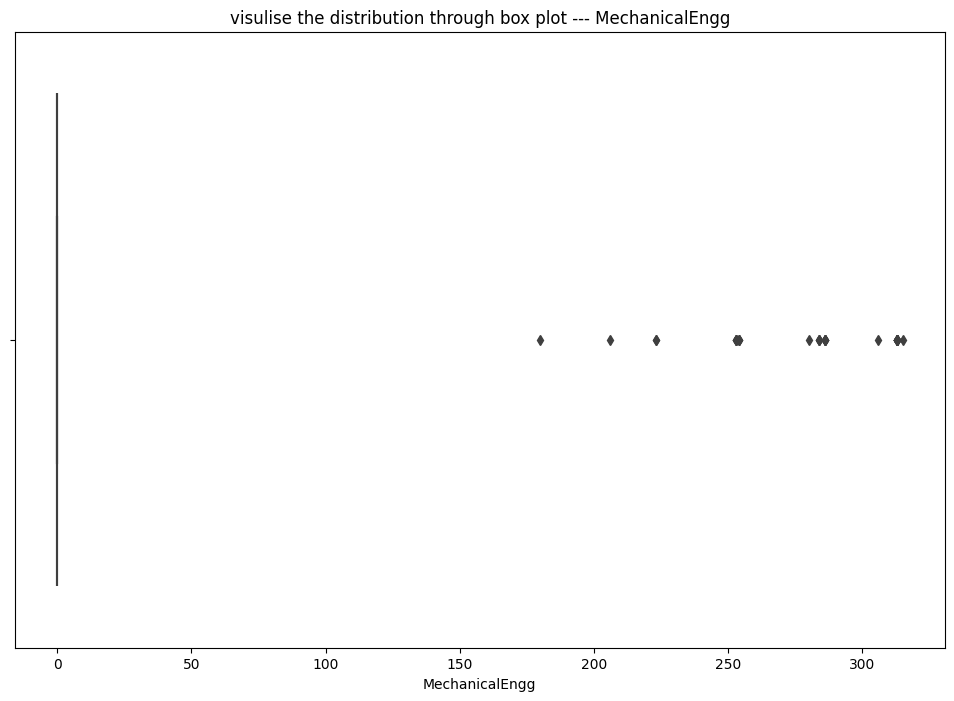

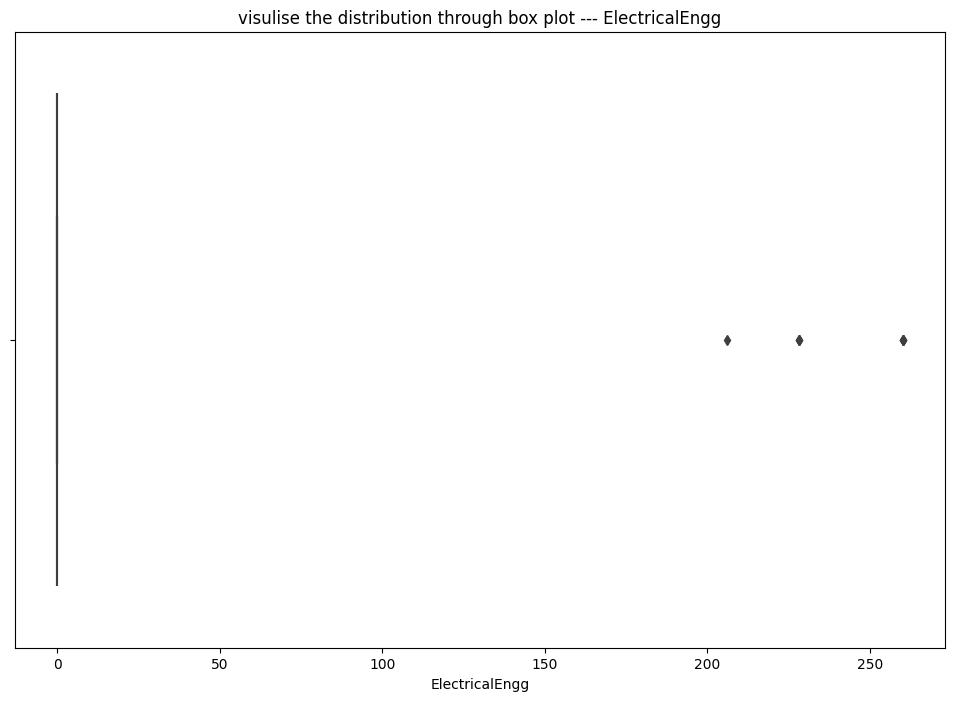

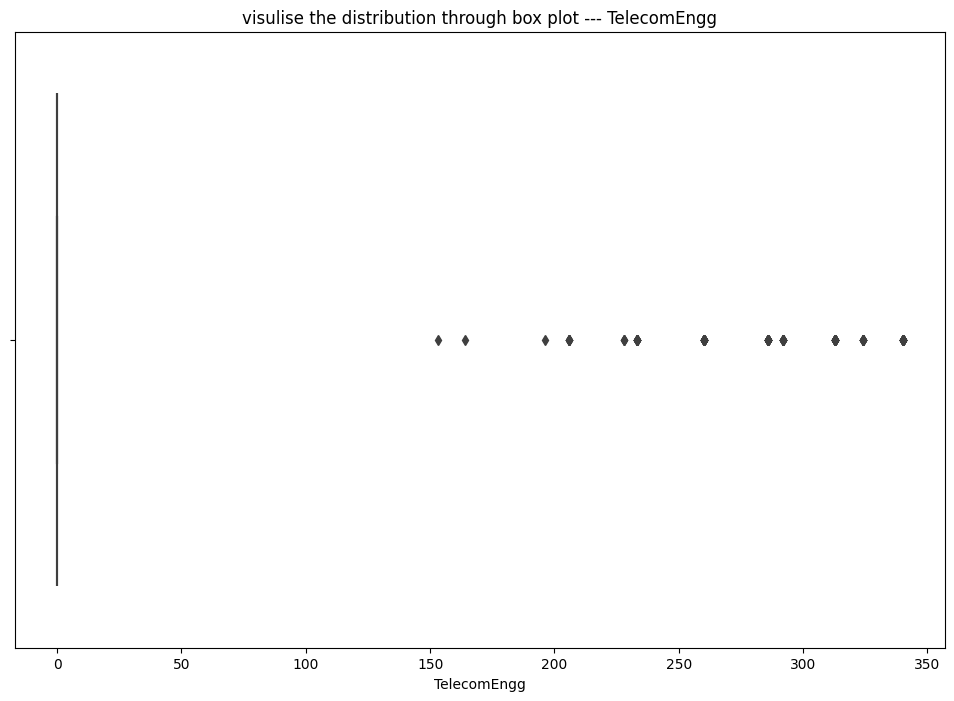

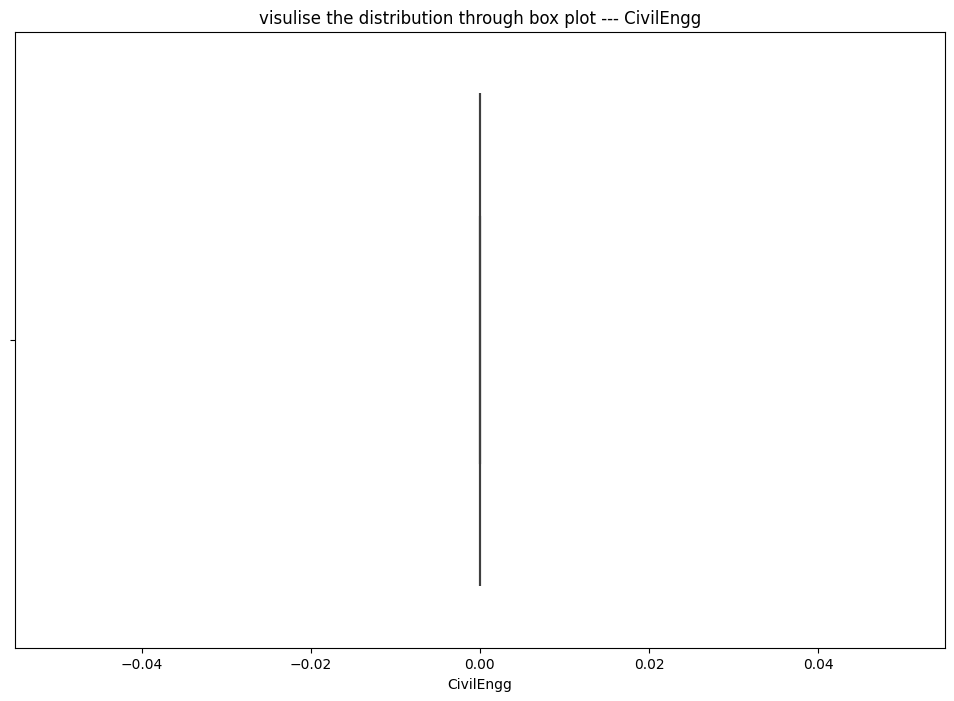

<Figure size 1200x800 with 0 Axes>

In [69]:
columns = ['12graduation', 'CollegeID', 'CollegeTier',
       'CollegeCityID', 'CollegeCityTier', 'GraduationYear', 'English',
       'Logical', 'Quant', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg']
for i in columns:
    plt.title(f'visulise the distribution through box plot --- {i}')
    sns.boxplot(data = new_df_1, x = i)
    plt.figure(figsize = (12,8))
    plt.tight_layout()

# Bi Varient analysis

In [70]:
new_df_1.shape

(3116, 38)

In [71]:
new_df_1.head()

,ID,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Salary
0,203097,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.30,other,2007,95.8,isc,1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.818026,445,0,0,0,0,0,0,0.833126,0.857931,0.718552,0.666817,0.753438,420000.0
1,579905,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.40,cbse,2007,85.0,cbse,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.980346,0,466,0,0,0,0,0,0.554263,0.801481,0.818421,0.422884,0.895772,500000.0
2,810601,2014-06-01,present,system engineer,Chennai,f,1992-08-03,85.00,cbse,2010,68.2,cbse,64,2,B.Tech/B.E.,information technology,70.00,64,0,Uttar Pradesh,2014,615,545,370,0.725471,395,0,0,0,0,0,0,0.718474,0.974774,0.667657,0.296022,0.874942,325000.0
4,343523,2014-03-01,3/1/15 0:00,Unknown,other,m,1991-02-27,78.00,cbse,2008,76.8,cbse,11368,2,B.Tech/B.E.,electronics and communication engineering,73.90,11368,0,Uttar Pradesh,2012,545,625,465,0.562276,0,233,0,0,0,0,0,0.530170,0.715849,0.494822,0.456114,0.787793,200000.0
5,1027655,2014-06-01,present,system engineer,Hyderabad,m,1992-07-02,89.92,state board,2010,87.0,isc,5086,2,B.Tech/B.E.,electronics and communication engineering,76.32,5086,0,Karnataka,2014,560,555,620,0.000000,645,0,407,0,0,0,0,0.624632,0.671511,0.323067,0.317155,0.708288,300000.0


In [72]:
new_df_1['Designation'].value_counts()

software engineer                         440
system engineer                           242
software developer                        236
programmer analyst                        120
java software engineer                     98
software test engineer                     86
technical support engineer                 66
project engineer                           63
java developer                             60
senior software engineer                   53
web developer                              51
test engineer                              45
quality analyst                            44
application developer                      42
network engineer                           42
android developer                          41
data analyst                               40
business analyst                           38
associate software engineer                36
programmer                                 34
.net developer                             34
php developer                     

In [73]:
new_df_1['date_of_joining'] = pd.to_datetime(new_df_1['DOJ']).dt.year

In [74]:
#new_df_1['date_of_Leaving'] = pd.to_datetime(new_df_1['DOL']).dt.year

# Bi varient Analysis

****Assumptions***

Are people who choose a career as a Software Engineer earning more compared to those in less chosen designations? How does this vary between genders?

What are the average salary and job designations for individuals who completed their secondary education from the CBSE board?

How much do individuals who completed their higher education in different boards with good percentages earn?

How much money do males and females earn in different cities/designations?

Does the claim made in a Times of India article dated Jan 18, 2019, stating that "After doing your Computer Science Engineering if you take up jobs as a Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh graduate" hold true based on the given data?

Is there a relationship between gender and specialization? In other words, does the preference for specialization depend on gender?

In [75]:
Q1 = new_df['Salary'].quantile(0.25)
Q3 = new_df['Salary'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

new_df_1 = new_df[(new_df['Salary'] > lower_bound) & (new_df['Salary'] < upper_bound)]

In [76]:
new_df_1.head()

,ID,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Salary
0,203097,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.30,other,2007,95.8,isc,1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.818026,445,0,0,0,0,0,0,0.833126,0.857931,0.718552,0.666817,0.753438,420000.0
1,579905,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.40,cbse,2007,85.0,cbse,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.980346,0,466,0,0,0,0,0,0.554263,0.801481,0.818421,0.422884,0.895772,500000.0
2,810601,2014-06-01,present,system engineer,Chennai,f,1992-08-03,85.00,cbse,2010,68.2,cbse,64,2,B.Tech/B.E.,information technology,70.00,64,0,Uttar Pradesh,2014,615,545,370,0.725471,395,0,0,0,0,0,0,0.718474,0.974774,0.667657,0.296022,0.874942,325000.0
4,343523,2014-03-01,3/1/15 0:00,Unknown,other,m,1991-02-27,78.00,cbse,2008,76.8,cbse,11368,2,B.Tech/B.E.,electronics and communication engineering,73.90,11368,0,Uttar Pradesh,2012,545,625,465,0.562276,0,233,0,0,0,0,0,0.530170,0.715849,0.494822,0.456114,0.787793,200000.0
5,1027655,2014-06-01,present,system engineer,Hyderabad,m,1992-07-02,89.92,state board,2010,87.0,isc,5086,2,B.Tech/B.E.,electronics and communication engineering,76.32,5086,0,Karnataka,2014,560,555,620,0.000000,645,0,407,0,0,0,0,0.624632,0.671511,0.323067,0.317155,0.708288,300000.0


* Are people who choose a career as a Software Engineer earning more compared to those in less chosen designations? How does this vary between genders?

Text(0.5, 1.0, 'Comparison with most frequent and less frequent designation with respect to Salary')

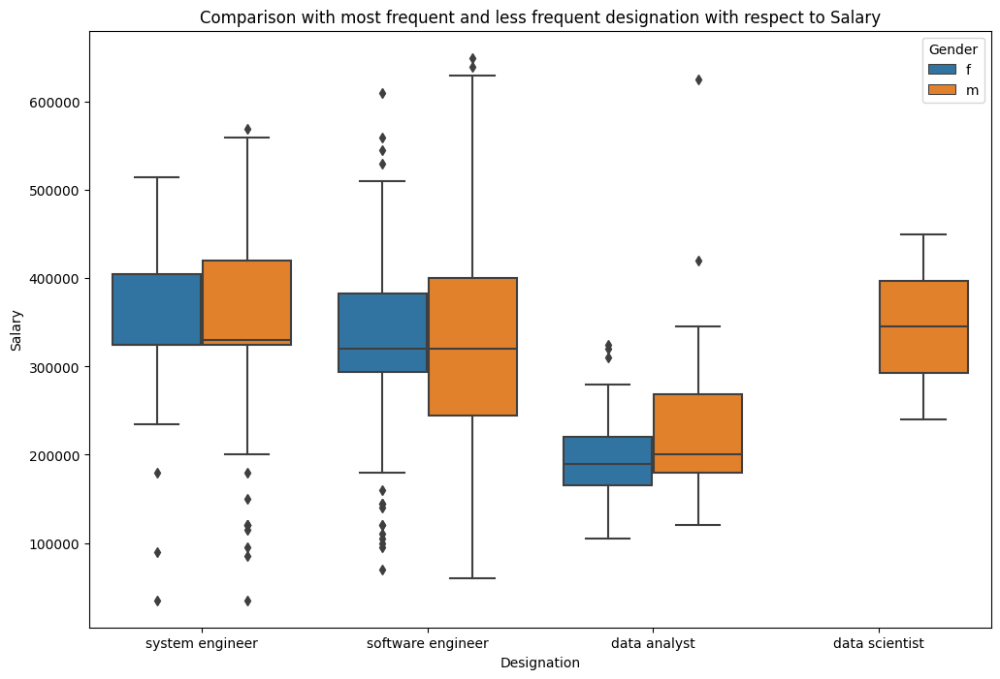

In [77]:
plt.figure(figsize = (12,8))
plt.tight_layout()
filtered_df = new_df_1.loc[new_df_1['Designation'].isin(['software engineer', 'system engineer', 'data analyst', 'data scientist'])]
sns.boxplot(x='Designation', y='Salary', data=filtered_df, hue='Gender')
plt.title('Comparison with most frequent and less frequent designation with respect to Salary')

From the comparison between the most frequent and less frequent designations with respect to gender, it is evident that there are notable differences in salary levels and gender distribution. Software Engineers, regardless of gender, tend to earn more compared to other designations, with males earning slightly higher than females. Interestingly, only males are working as Data Scientists, indicating a gender disparity in this role. On the other hand, both male and female Data Analysts have similar average salaries, suggesting a more balanced distribution in this designation. Overall, male representation is higher across all designations, indicating a potential gender imbalance in the workforce. These findings highlight the need for further examination of gender-related issues in job distribution and salary determination to promote equality in the workplace

* What are the average salary and job designations for individuals who completed their secondary education from the CBSE board?

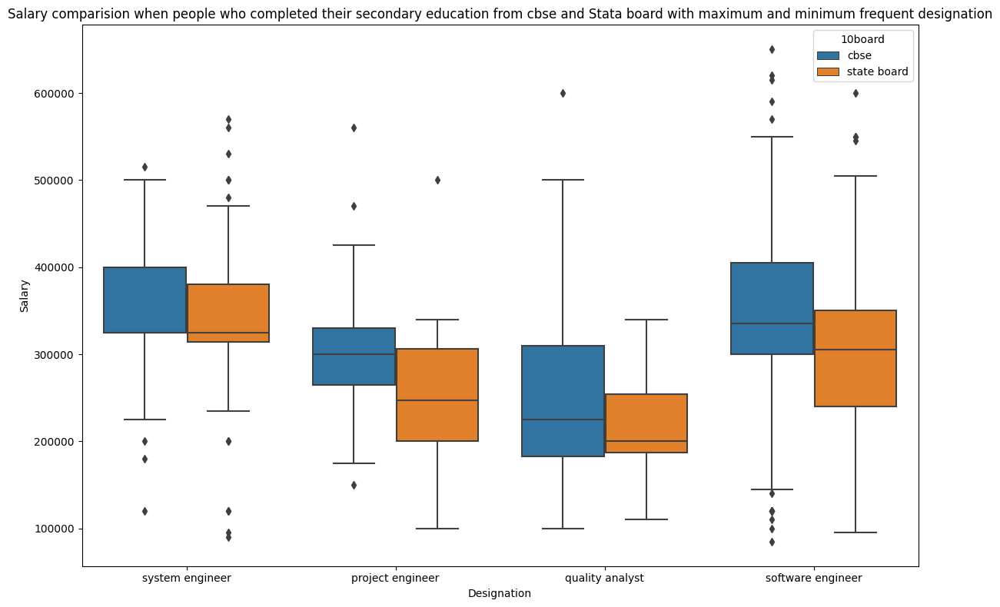

In [78]:
filtered_df = new_df_1[new_df_1['Designation'].isin(['software engineer', 'system engineer', 'project engineer', 'quality analyst'])]
filtered_df = filtered_df[filtered_df['10board'].isin(['cbse', 'state board'])]
plt.figure(figsize = (12,8))
plt.title('Salary comparision when people who completed their secondary education from cbse and Stata board with maximum and minimum frequent designation')
sns.boxplot(x='Designation', y='Salary', data=filtered_df, hue = '10board')
plt.tight_layout()

From the box plots, it is evident that individuals who completed their secondary education from the CBSE board are getting more job opportunities compared to those from state boards. However, the minimum average salary acquired by individuals from both CBSE and state boards varies slightly for some designations. This suggests that while the choice of educational board may influence job opportunities, it might not have a significant impact on the salary levels for certain designations. Other factors such as skills, experience, and industry demand may play a more crucial role in determining salary levels in these cases.

* How much do individuals who completed their higher education in different boards with good percentages earn?

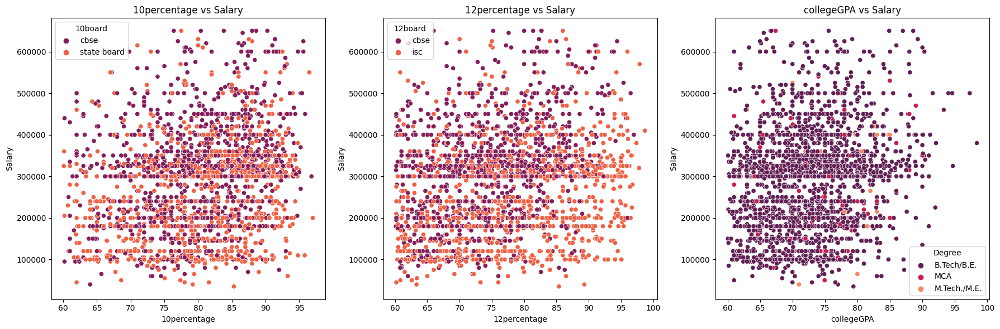

In [79]:
filtered_df = new_df_1[(new_df_1['10percentage'] > 60) & (new_df_1['12percentage'] > 60) & (new_df_1['collegeGPA'] > 60)]

filtered_10percentage = filtered_df[filtered_df['10board'].isin(['cbse', 'state board']) & filtered_df['12board'].isin(['cbse', 'isc'])]

plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
sns.scatterplot(x='10percentage', y='Salary', hue='10board', data=filtered_10percentage, palette='rocket')
plt.title('10percentage vs Salary')
plt.subplot(1, 3, 2)
sns.scatterplot(x='12percentage', y='Salary', hue='12board', data=filtered_10percentage, palette='rocket')
plt.title('12percentage vs Salary')
plt.subplot(1, 3, 3)
sns.scatterplot(x='collegeGPA', y='Salary', hue='Degree', data=filtered_10percentage, palette='rocket')
plt.title('collegeGPA vs Salary')
plt.tight_layout()
plt.show()

The plots indicate that percentage does not have a direct influence on securing a higher salary. However, it is observed that a majority of individuals who scored above 60% in their exams are earning a minimum average salary of 3 lakhs. This suggests that while percentage alone may not determine salary levels, achieving higher scores could be a contributing factor in securing a higher-paying job. The relationship between exam scores and salary highlights the importance of academic performance in the job market, particularly for securing salaries above a certain threshold.

* How much money do males and females earn in different cities/designations?

In [80]:
filtered_df = new_df_1.loc[new_df_1['Designation'].isin(['software engineer', 'system engineer', 'data analyst', 'data scientist'])]

In [81]:
cross = pd.crosstab(index=filtered_df['Gender'], columns=[filtered_df['Designation'], filtered_df['JobCity']])
cross_stacked = cross.stack().reset_index()

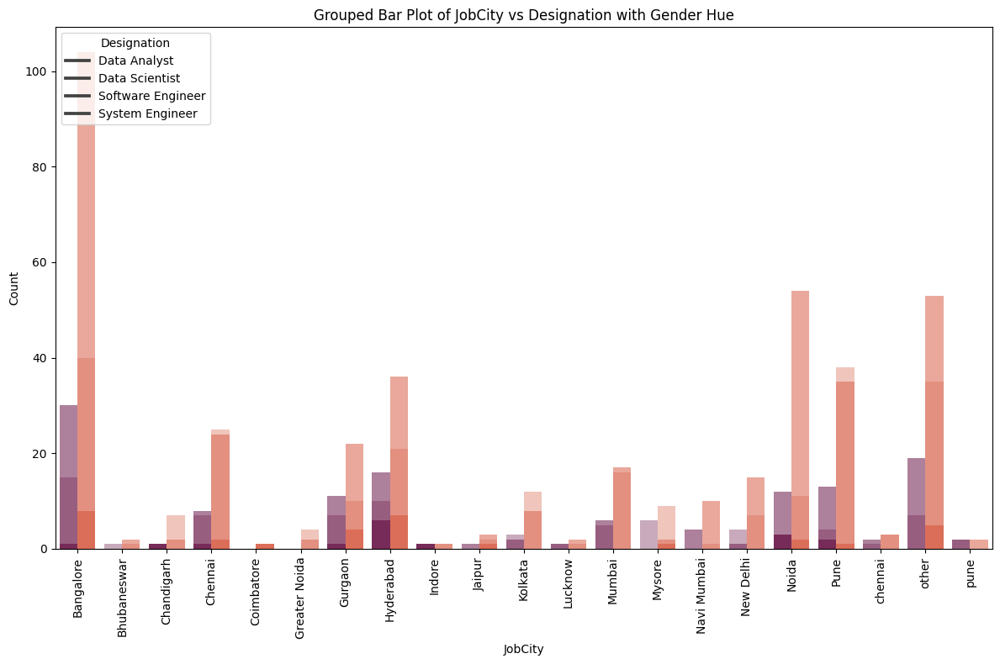

In [82]:
plt.figure(figsize=(12, 8))
sns.barplot(x='JobCity', y='data analyst', hue='Gender', data=cross_stacked, palette='rocket')
sns.barplot(x='JobCity', y='data scientist', hue='Gender', data=cross_stacked, palette='rocket', alpha=0.8)
sns.barplot(x='JobCity', y='software engineer', hue='Gender', data=cross_stacked, palette='rocket', alpha=0.6)
sns.barplot(x='JobCity', y='system engineer', hue='Gender', data=cross_stacked, palette='rocket', alpha=0.4)
plt.legend(title='Designation', labels=['Data Analyst', 'Data Scientist', 'Software Engineer', 'System Engineer'])
plt.xlabel('JobCity')
plt.ylabel('Count')
plt.title('Grouped Bar Plot of JobCity vs Designation with Gender Hue')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

The plot reveals that Bangalore is the predominant job location across designations, indicating its popularity among job seekers. Additionally, it shows that, in general, male ratios are higher than female ratios in most cities, suggesting a gender imbalance in job distribution. However, there are a few cities where the male and female ratios are similar, indicating a more balanced gender distribution in those locations. This observation underscores the importance of considering location-specific factors when analyzing gender disparities in job placements.

In [83]:
cross = pd.crosstab(new_df_1['Gender'], new_df_1['Specialization'])

<Figure size 2000x800 with 0 Axes>

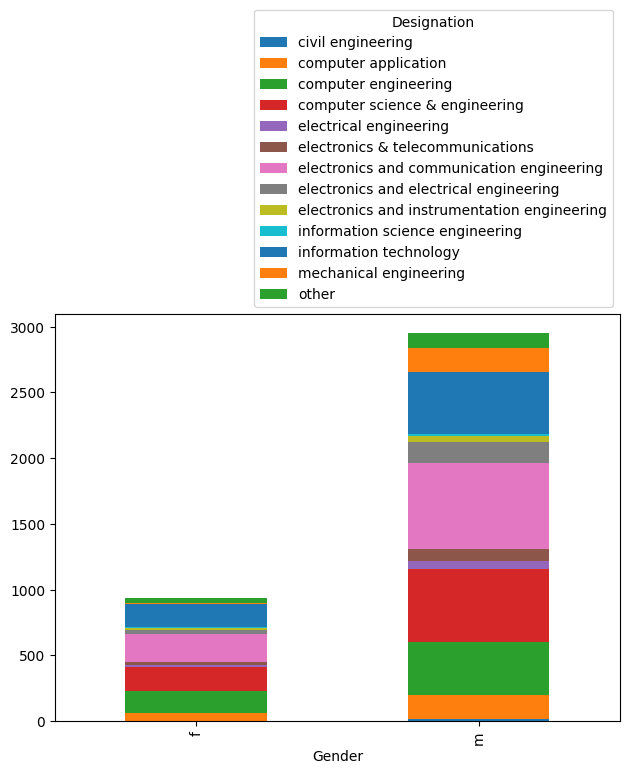

In [84]:
plt.figure(figsize = (20,8))
cross.plot(kind = 'bar', stacked = True)
plt.tight_layout()
plt.legend(title='Designation', bbox_to_anchor=(1, 1), loc='lower right') 

* Is there a relationship between gender and specialization? In other words, does the preference for specialization depend on gender?

In [85]:
from scipy.stats import chi2_contingency
cross = pd.crosstab(new_df_1['Gender'], new_df_1['Specialization'])
chi2, p, dof, expected = chi2_contingency(cross)
print(f"Chi-squared statistic: {chi2}")
print(f"P-value: {p}")
print(f"Degrees of freedom: {dof}")
print("Expected frequencies:")
print(expected)

Chi-squared statistic: 53.84680800620766
P-value: 2.91028672589253e-07
Degrees of freedom: 12
Expected frequencies:
[[  5.78692743  56.90478641 138.16289243 176.26016469  19.28975811
   29.17575914 207.84714359  46.77766341  13.74395265   6.51029336
  155.76479671  45.8131755   34.96268657]
 [ 18.21307257 179.09521359 434.83710757 554.73983531  60.71024189
   91.82424086 654.15285641 147.22233659  43.25604735  20.48970664
  490.23520329 144.1868245  110.03731343]]


<Axes: ylabel='Density'>

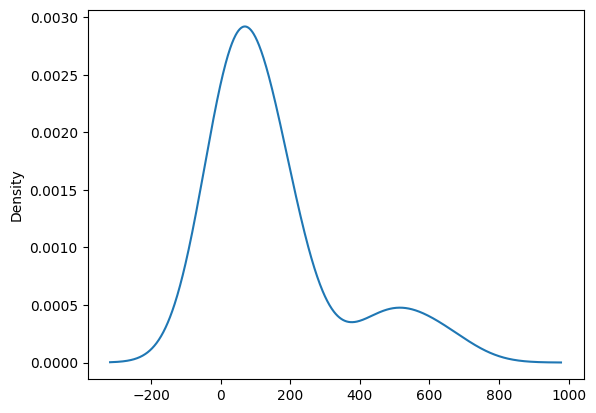

In [86]:
pd.Series(expected.flatten(), name='Expected Frequencies').plot(kind = 'kde')

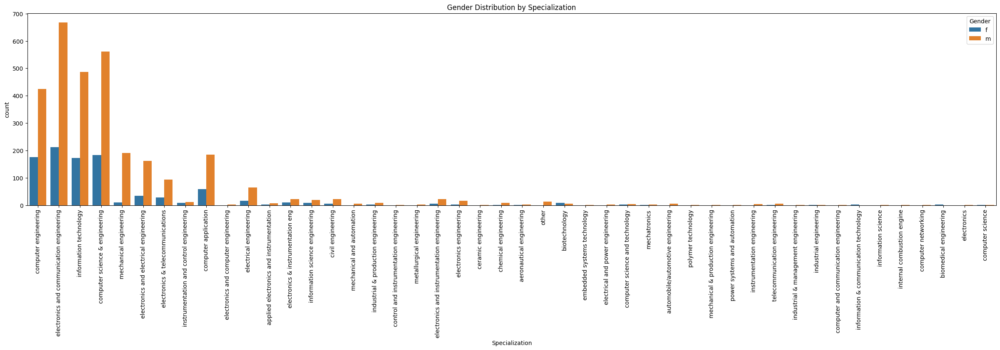

<Figure size 640x480 with 0 Axes>

In [87]:
plt.figure(figsize=(30, 6))
plt.title('Gender Distribution by Specialization')
sns.countplot(x='Specialization', hue='Gender', data=df)
plt.xticks(rotation=90)
plt.show()
plt.tight_layout()

The analysis shows a strong relationship between gender and specialization, as indicated by a chi-square score of approximately 53% and a p-value of less than 0.05. This suggests that gender and specialization are not independent of each other. The significant chi-square score implies that the observed frequencies of gender and specialization in the dataset differ from what would be expected if the two variables were independent. Therefore, there is evidence to conclude that both gender and specialization are related in the dataset, highlighting the importance of considering both factors in further analysis or decision-making processes.

* Does the claim made in a Times of India article dated Jan 18, 2019, stating that "After doing your Computer Science Engineering if you take up jobs as a Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh graduate" hold true based on the given data?

In [88]:
filtered_df = new_df_1[(new_df_1['Specialization'] == 'computer science & engineering') & 
                       (new_df_1['Designation'].isin(['software engineer', 'programmer analyst', 'hardware engineer', 'associate engineer']))]

In [89]:
filtered_df = filtered_df[filtered_df['GraduationYear'] == filtered_df['DOJ'].dt.year]

<Axes: ylabel='Density'>

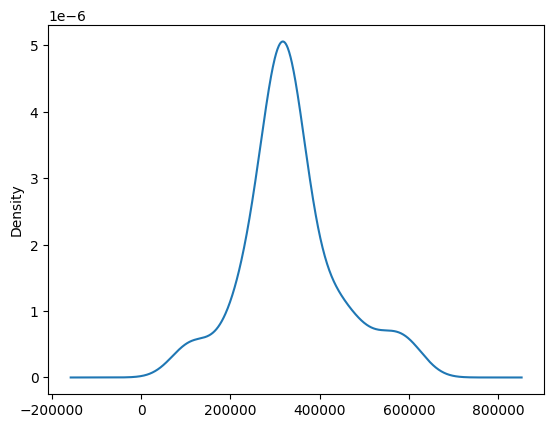

In [90]:
filtered_df['Salary'].plot(kind = 'kde')

Freshers in roles like Programming Analyst, Software Engineer, Hardware Engineer, and Associate Engineer earn an average salary of 2.5 to 3 lakhs. These roles represent entry-level positions in the tech industry, with responsibilities ranging from programming analysis to software and hardware development. The observed salary range suggests a standard pay scale for beginners in these fields. This information is valuable for both job seekers and employers, providing insights into salary expectations and industry standards for entry-level tech positions.

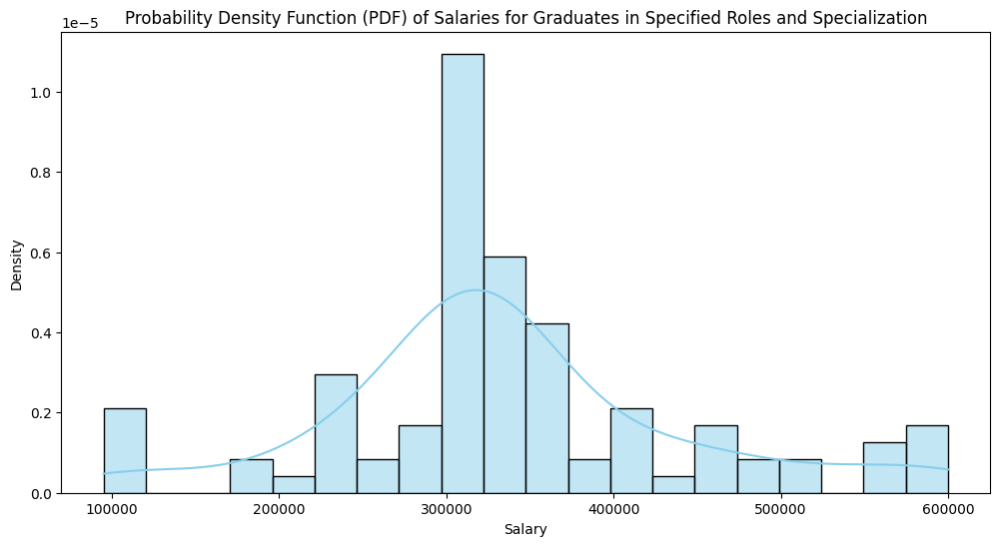

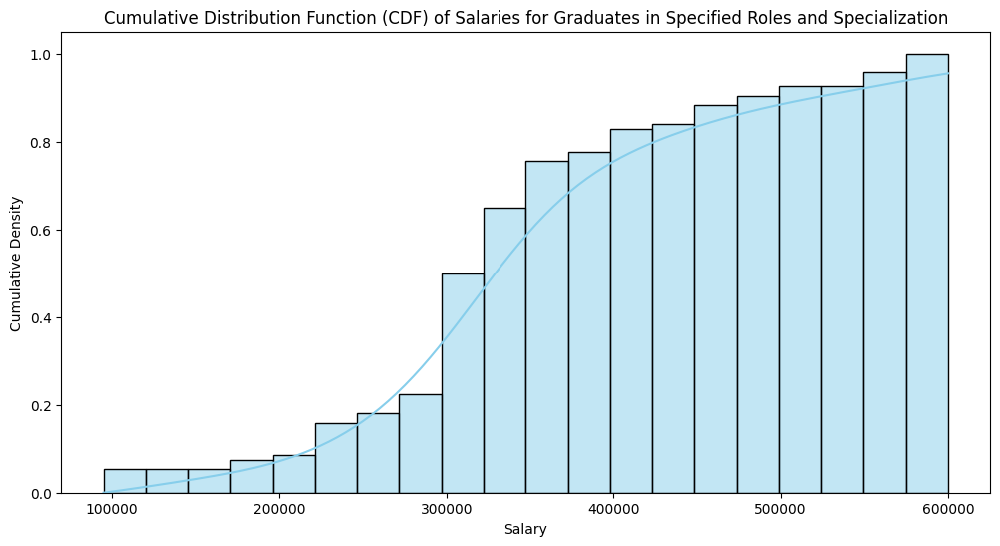

In [91]:
plt.figure(figsize=(12, 6))
sns.histplot(filtered_df['Salary'], kde=True, stat='density', color='skyblue', bins=20)
plt.xlabel('Salary')
plt.ylabel('Density')
plt.title('Probability Density Function (PDF) of Salaries for Graduates in Specified Roles and Specialization')
plt.show()

plt.figure(figsize=(12, 6))
sns.histplot(filtered_df['Salary'], kde=True, stat='density', color='skyblue', cumulative=True, bins=20)
plt.xlabel('Salary')
plt.ylabel('Cumulative Density')
plt.title('Cumulative Distribution Function (CDF) of Salaries for Graduates in Specified Roles and Specialization')
plt.show()

In [92]:
new_df_1.head()

,ID,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Salary
0,203097,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.30,other,2007,95.8,isc,1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.818026,445,0,0,0,0,0,0,0.833126,0.857931,0.718552,0.666817,0.753438,420000.0
1,579905,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.40,cbse,2007,85.0,cbse,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.980346,0,466,0,0,0,0,0,0.554263,0.801481,0.818421,0.422884,0.895772,500000.0
2,810601,2014-06-01,present,system engineer,Chennai,f,1992-08-03,85.00,cbse,2010,68.2,cbse,64,2,B.Tech/B.E.,information technology,70.00,64,0,Uttar Pradesh,2014,615,545,370,0.725471,395,0,0,0,0,0,0,0.718474,0.974774,0.667657,0.296022,0.874942,325000.0
4,343523,2014-03-01,3/1/15 0:00,Unknown,other,m,1991-02-27,78.00,cbse,2008,76.8,cbse,11368,2,B.Tech/B.E.,electronics and communication engineering,73.90,11368,0,Uttar Pradesh,2012,545,625,465,0.562276,0,233,0,0,0,0,0,0.530170,0.715849,0.494822,0.456114,0.787793,200000.0
5,1027655,2014-06-01,present,system engineer,Hyderabad,m,1992-07-02,89.92,state board,2010,87.0,isc,5086,2,B.Tech/B.E.,electronics and communication engineering,76.32,5086,0,Karnataka,2014,560,555,620,0.000000,645,0,407,0,0,0,0,0.624632,0.671511,0.323067,0.317155,0.708288,300000.0


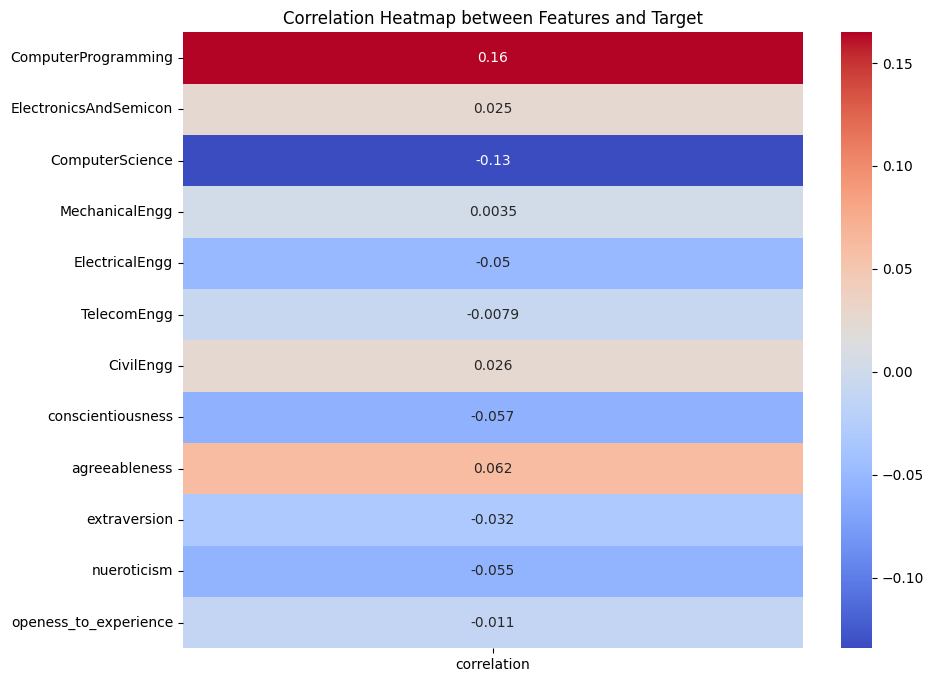

In [93]:
x = new_df_1[['ComputerProgramming', 'ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg', 'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion', 'nueroticism', 'openess_to_experience']]
y = new_df_1.iloc[:, -1] 
corr = x.corrwith(y)
corr_df = pd.DataFrame(corr, columns=['correlation'])
plt.figure(figsize=(10, 8))
sns.heatmap(corr_df, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap between Features and Target')
plt.show()

In [94]:
Q1 = new_df['ComputerProgramming'].quantile(0.25)
Q3 = new_df['ComputerProgramming'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

new_df_1 = new_df[(new_df['ComputerProgramming'] > lower_bound) & (new_df['ComputerProgramming'] < upper_bound)]

<Axes: xlabel='ComputerProgramming', ylabel='Salary'>

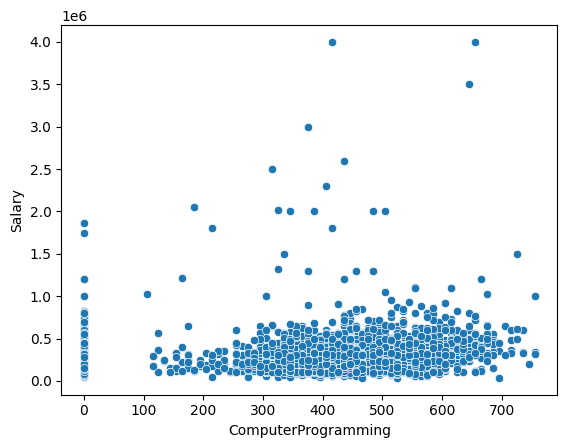

In [95]:
sns.scatterplot(x = 'ComputerProgramming', y = 'Salary', data = new_df_1)

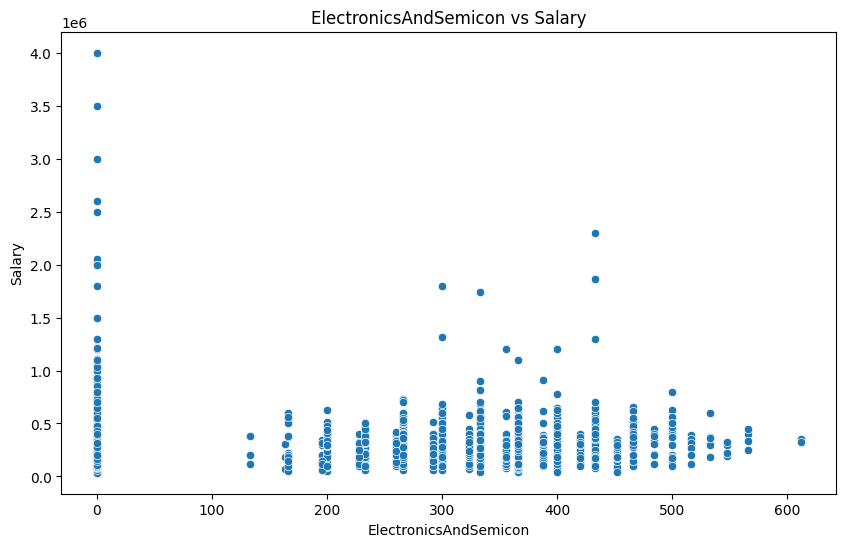

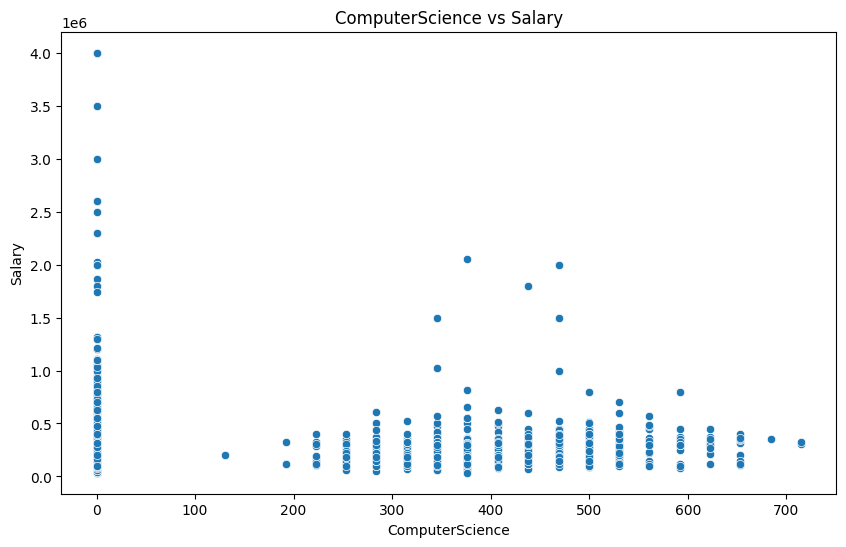

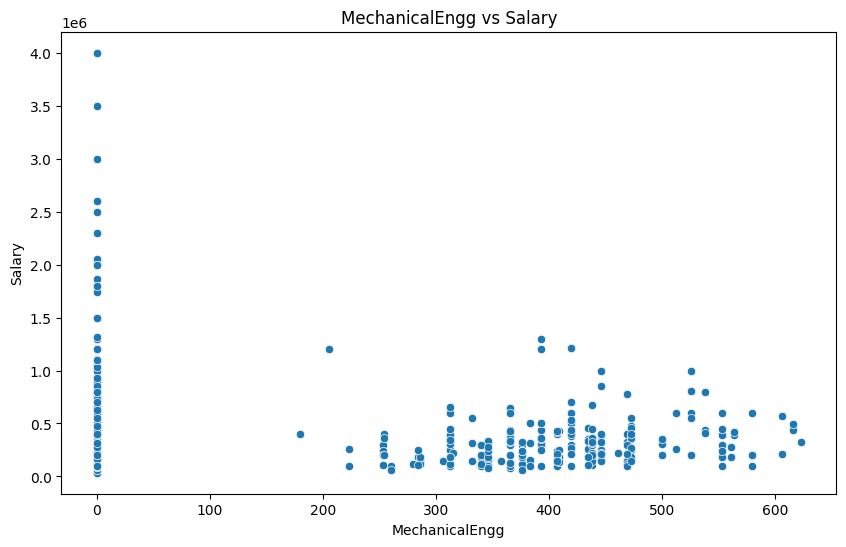

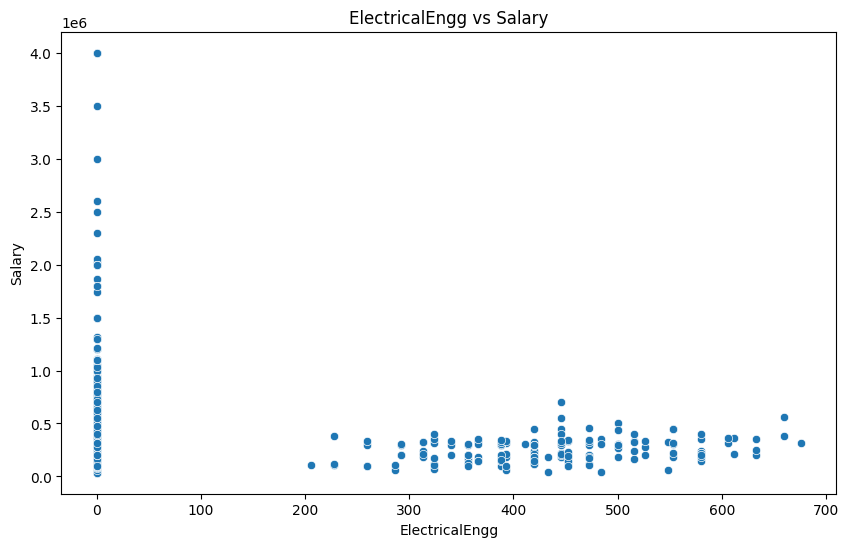

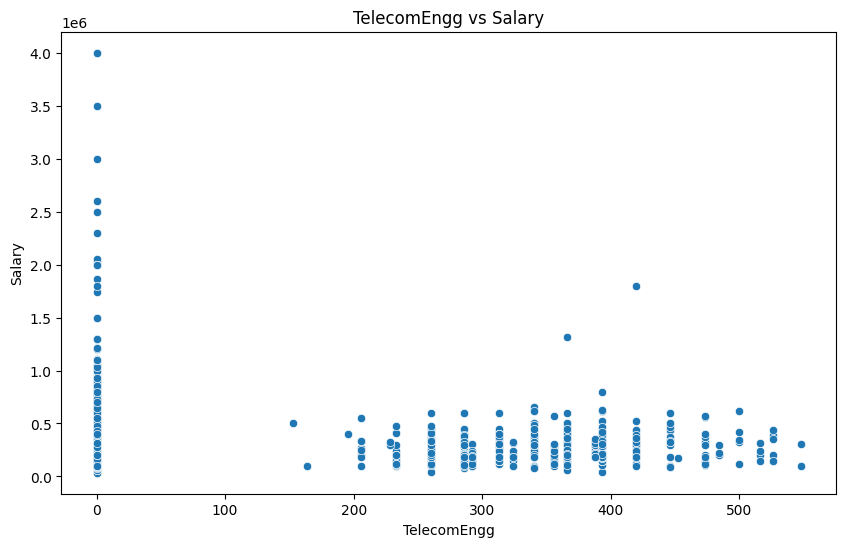

...

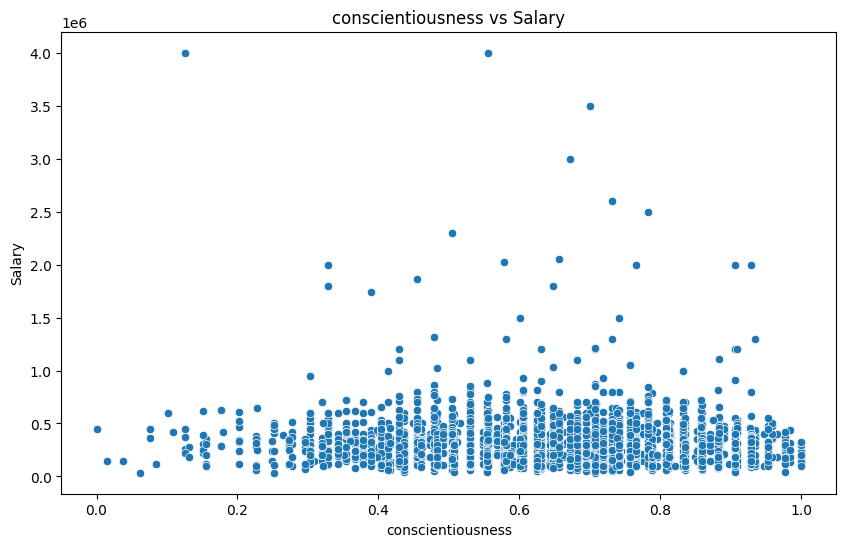

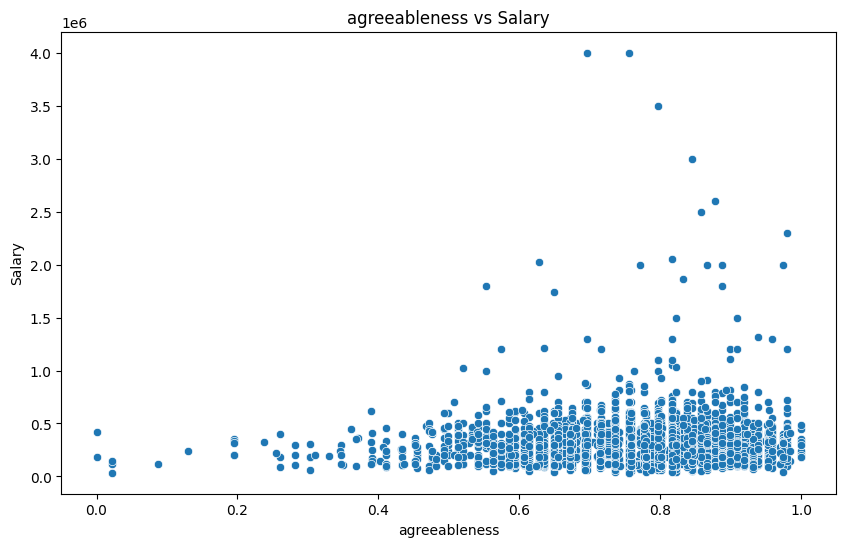

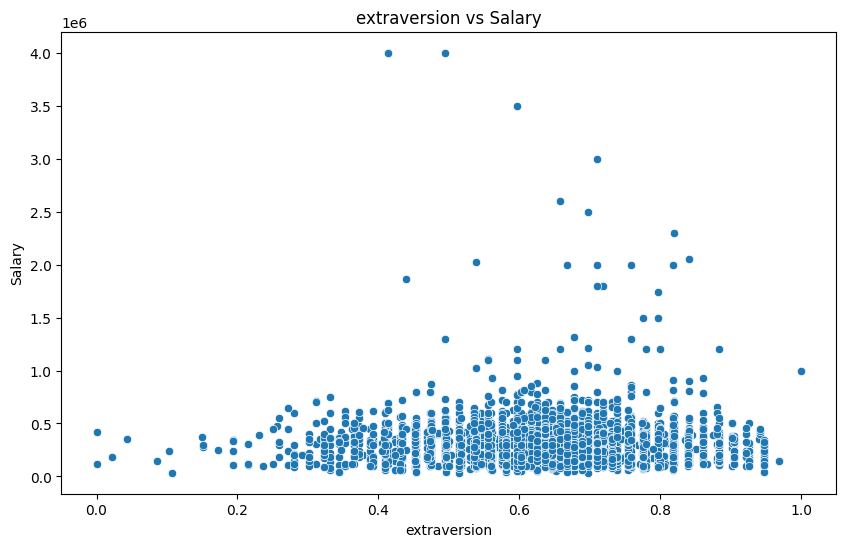

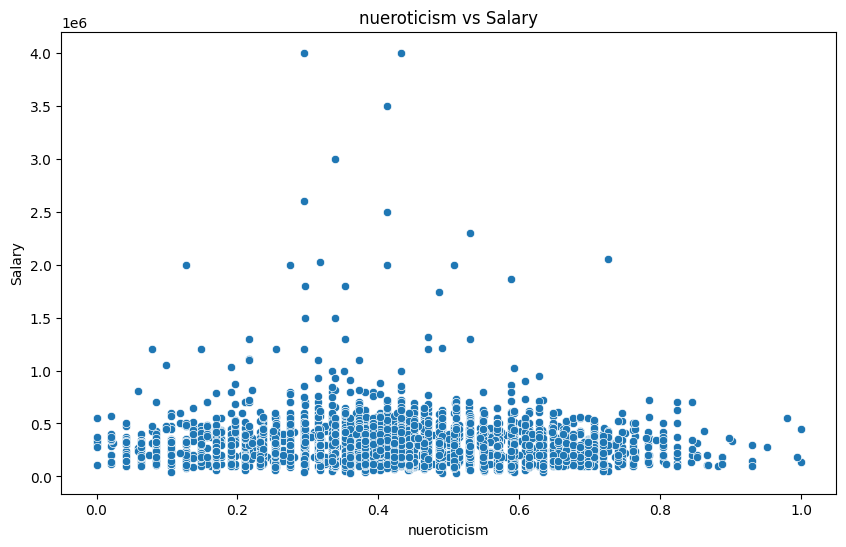

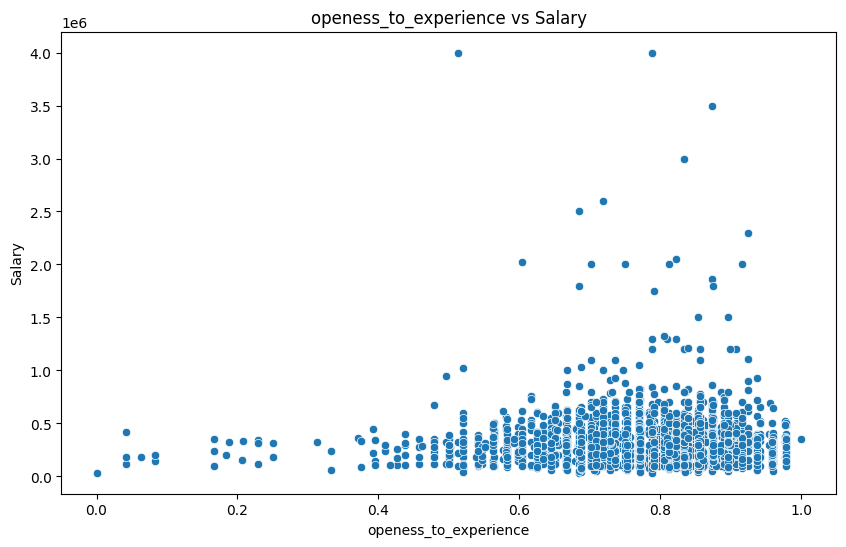

In [96]:
columns = ['ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg', 'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion', 'nueroticism', 'openess_to_experience']
for i in columns:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=i, y='Salary', data=new_df_1)
    plt.xlabel(i)
    plt.ylabel('Salary')
    plt.title(f'{i} vs Salary')

# ***Conclusion***

Through exploratory data analysis (EDA) of the Aspiring Minds Employment Outcome dataset, we can infer that individuals with a background in computer science specialization who graduated with first-class distinction and achieved high marks in their 10th, 12th, and graduation, along with scoring well in the AMCAT Computer Programming language assessment, tend to earn a higher salary compared to others. This highlights the importance of these factors in influencing salary levels for computer science graduates and emphasizes the value of a strong educational background and relevant skills in the job market.